<center>

# ENSE 480 Final Project – Handwritten Text Recognition System

## Name: Archisha Bhattacharya
## SID: 200430978

### University of Regina
### Faculty of Engineering and Applied Science - Software Systems Engineering
    
</center>

# System  Prerequisites

- Python 3;
- TensorFlow (v2.11.0)
- mltu (v1.0.0)

### 1. Importing Libraries/Dependancies

In [1]:
#tensorflow
import tensorflow as tf
try: [tf.config.experimental.set_memory_growth(gpu, True) for gpu in tf.config.experimental.list_physical_devices('GPU')]
except: pass

from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

#mltu
from mltu.preprocessors import ImageReader
from mltu.transformers import ImageResizer, LabelIndexer, LabelPadding, ImageShowCV2
from mltu.augmentors import RandomBrightness, RandomRotate, RandomErodeDilate, RandomSharpen
from mltu.configs import BaseModelConfigs

from mltu.tensorflow.dataProvider import DataProvider
from mltu.tensorflow.losses import CTCloss
from mltu.tensorflow.callbacks import Model2onnx, TrainLogger
from mltu.tensorflow.metrics import CERMetric, WERMetric

import stow
from tqdm import tqdm

from datetime import datetime

# Defining the Model Configuration
The cofigurations for the input layer and epoch for training the model is set here.

In [2]:
# Create a ModelConfigs object to store model configurations
class ModelConfigs(BaseModelConfigs):
    def __init__(self):
        super().__init__()
        self.model_path = stow.join('Models/ense480_project', datetime.strftime(datetime.now(), "%Y%m%d%H%M"))
        self.vocab = ''
        self.height = 96
        self.width = 1408
        self.max_text_length = 0
        self.batch_size = 32
        self.learning_rate = 0.0005
        self.train_epochs = 1000
        self.train_workers = 20
        
configs = ModelConfigs()

# Preparing Dataset
The dataset needs to be extracted and processed in order to be used for training the model.

### 1. Extracting the dataset
The dataset is extracted from the images saved in the folder `/dataset/` of the project directory.

In [3]:
sentences_txt_path = stow.join('Datasets', 'IAM_Sentences', 'ascii', 'sentences.txt')
sentences_folder_path = stow.join('Datasets', 'IAM_Sentences', 'sentences')

dataset, vocab, max_len = [], set(), 0
words = open(sentences_txt_path, "r").readlines()
for line in tqdm(words):
    if line.startswith("#"):
        continue

    line_split = line.split(" ")
    if line_split[2] == "err":
        continue

    folder1 = line_split[0][:3]
    folder2 = line_split[0][:8]
    file_name = line_split[0] + ".png"
    label = line_split[-1].rstrip('\n')

    # recplace '|' with ' ' in label
    label = label.replace('|', ' ')

    rel_path = stow.join(sentences_folder_path, folder1, folder2, file_name)
    if not stow.exists(rel_path):
        continue

    dataset.append([rel_path, label])
    vocab.update(list(label))
    max_len = max(max_len, len(label))

100%|████████████████████████████████████████████████████████████████████| 16777/16777 [00:00<00:00, 20749.75it/s]


### 2. Processing the Dataset
The images in the dataset are processed by resizing it, adding index and padding. The images are also augmented by adjusting the brightness, dilation and sharpness to improve readability.

In [4]:
# Save vocab and maximum text length to configs
configs.vocab = "".join(vocab)
configs.max_text_length = max_len
configs.save()

# Create a data provider for the dataset
data_provider = DataProvider(
    dataset=dataset,
    skip_validation=True,
    batch_size=configs.batch_size,
    data_preprocessors=[ImageReader()],
    transformers=[
        ImageResizer(configs.width, configs.height, keep_aspect_ratio=True),
        LabelIndexer(configs.vocab),
        LabelPadding(max_word_length=configs.max_text_length, padding_value=len(configs.vocab)),
        ],
)

# Split the dataset into training and validation sets
train_data_provider, val_data_provider = data_provider.split(split = 0.9)

# Augment training data with random brightness, rotation and erode/dilate
train_data_provider.augmentors = [
    RandomBrightness(), 
    RandomErodeDilate(),
    RandomSharpen(),
    ]

2023-03-12 13:45:54,444 INFO mltu.dataProvider: Skipping Dataset validation...


# Defining and Training Model
The model architecture is defined in this section.

### 1. Defining Model Architecture
The model architecture is defined by defining the input layer, adding the CNN and RNN layers and is compiled with CTC loss. The model summary is printed.

In [5]:
#Creating the model
from keras import layers
from keras.models import Model

from mltu.tensorflow.model_utils import residual_block

def train_model(input_dim, output_dim, activation='leaky_relu', dropout=0.2):
    
    inputs = layers.Input(shape=input_dim, name="input")

    # normalize images here instead in preprocessing step
    input = layers.Lambda(lambda x: x / 255)(inputs)
    
    #CNN Layers
    x1 = residual_block(input, 32, activation=activation, skip_conv=True, strides=1, dropout=dropout)

    x2 = residual_block(x1, 32, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x3 = residual_block(x2, 32, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    x4 = residual_block(x3, 64, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x5 = residual_block(x4, 64, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    x6 = residual_block(x5, 128, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x7 = residual_block(x6, 128, activation=activation, skip_conv=True, strides=1, dropout=dropout)

    x8 = residual_block(x7, 128, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x9 = residual_block(x8, 128, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    squeezed = layers.Reshape((x9.shape[-3] * x9.shape[-2], x9.shape[-1]))(x9)
    
    #RNN Layers
    blstm = layers.Bidirectional(layers.LSTM(256, return_sequences=True))(squeezed)
    blstm = layers.Dropout(dropout)(blstm)

    blstm = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(blstm)
    blstm = layers.Dropout(dropout)(blstm)

    output = layers.Dense(output_dim + 1, activation='softmax', name="output")(blstm)

    model = Model(inputs=inputs, outputs=output)
    return model

# Creating TensorFlow model architecture
model = train_model(
    input_dim = (configs.height, configs.width, 3),
    output_dim = len(configs.vocab),
)

# Compile the model with CTC Loss and print summary
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=configs.learning_rate), 
    loss=CTCloss(), 
    metrics=[
        CERMetric(vocabulary=configs.vocab),
        WERMetric(vocabulary=configs.vocab)
        ],
    run_eagerly=False
)
model.summary(line_length=110)

Model: "model"
______________________________________________________________________________________________________________
 Layer (type)                       Output Shape            Param #      Connected to                         
 input (InputLayer)                 [(None, 96, 1408, 3)]   0            []                                   
                                                                                                              
 lambda (Lambda)                    (None, 96, 1408, 3)     0            ['input[0][0]']                      
                                                                                                              
 conv2d (Conv2D)                    (None, 96, 1408, 32)    896          ['lambda[0][0]']                     
                                                                                                              
 batch_normalization (BatchNormaliz  (None, 96, 1408, 32)   128          ['conv2d[0][0]']        

                                                                                                              
 conv2d_9 (Conv2D)                  (None, 24, 352, 64)     36928        ['leaky_re_lu_6[0][0]']              
                                                                                                              
 batch_normalization_7 (BatchNormal  (None, 24, 352, 64)    256          ['conv2d_9[0][0]']                   
 ization)                                                                                                     
                                                                                                              
 conv2d_10 (Conv2D)                 (None, 24, 352, 64)     2112         ['dropout_2[0][0]']                  
                                                                                                              
 add_3 (Add)                        (None, 24, 352, 64)     0            ['batch_normalization_7[0][0]',      
 

 dropout_6 (Dropout)                (None, 12, 176, 128)    0            ['leaky_re_lu_13[0][0]']             
                                                                                                              
 conv2d_19 (Conv2D)                 (None, 6, 88, 128)      147584       ['dropout_6[0][0]']                  
                                                                                                              
 batch_normalization_14 (BatchNorma  (None, 6, 88, 128)     512          ['conv2d_19[0][0]']                  
 lization)                                                                                                    
                                                                                                              
 leaky_re_lu_14 (LeakyReLU)         (None, 6, 88, 128)      0            ['batch_normalization_14[0][0]']     
                                                                                                              
 

### 2. Training Model
The callbacks are declared and the model is trained here. After the model is trained the training and validation set is saved in .csv format.

In [6]:
# Define callbacks
earlystopper = EarlyStopping(monitor='val_CER', patience=20, verbose=1, mode='min')
checkpoint = ModelCheckpoint(f"{configs.model_path}/model.h5", monitor='val_CER', verbose=1, save_best_only=True, mode='min')
trainLogger = TrainLogger(configs.model_path)
tb_callback = TensorBoard(f'{configs.model_path}/logs', update_freq=1)
reduceLROnPlat = ReduceLROnPlateau(monitor='val_CER', factor=0.9, min_delta=1e-10, patience=5, verbose=1, mode='auto')
model2onnx = Model2onnx(f"{configs.model_path}/model.h5")

# Train the model
model.fit(
    train_data_provider,
    validation_data=val_data_provider,
    epochs=configs.train_epochs,
    callbacks=[earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback, model2onnx],
    workers=configs.train_workers
)

# Save training and validation datasets as csv files
train_data_provider.to_csv(stow.join(configs.model_path, 'train.csv'))
val_data_provider.to_csv(stow.join(configs.model_path, 'val.csv'))

Epoch 1/1000
85/85 [==============================] - ETA: 0s - loss: 292.4470 - CER: 1.1144 - WER: 1.1099 
Epoch 1: val_CER improved from inf to 0.96547, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 14:02:16,421 INFO root: Epoch 0; loss: 292.4469909667969; CER: 1.1143900156021118; WER: 1.1098849773406982; val_loss: 211.9629364013672; val_CER: 0.9654679894447327; val_WER: 1.0232558250427246


85/85 [==============================] - 954s 11s/step - loss: 292.4470 - CER: 1.1144 - WER: 1.1099 - val_loss: 211.9629 - val_CER: 0.9655 - val_WER: 1.0233 - lr: 5.0000e-04
Epoch 2/1000
85/85 [==============================] - ETA: 0s - loss: 161.6369 - CER: 1.0674 - WER: 1.6660 
Epoch 2: val_CER improved from 0.96547 to 0.95495, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 14:17:42,951 INFO root: Epoch 1; loss: 161.63685607910156; CER: 1.067442774772644; WER: 1.6659740209579468; val_loss: 149.2052001953125; val_CER: 0.9549462199211121; val_WER: 1.0645071268081665


85/85 [==============================] - 927s 11s/step - loss: 161.6369 - CER: 1.0674 - WER: 1.6660 - val_loss: 149.2052 - val_CER: 0.9549 - val_WER: 1.0645 - lr: 5.0000e-04
Epoch 3/1000
85/85 [==============================] - ETA: 0s - loss: 126.3885 - CER: 0.9579 - WER: 1.1061 
Epoch 3: val_CER did not improve from 0.95495


2023-03-12 14:32:45,006 INFO root: Epoch 2; loss: 126.3885498046875; CER: 0.9578867554664612; WER: 1.1060634851455688; val_loss: 151.989501953125; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 902s 11s/step - loss: 126.3885 - CER: 0.9579 - WER: 1.1061 - val_loss: 151.9895 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 5.0000e-04
Epoch 4/1000
85/85 [==============================] - ETA: 0s - loss: 122.0188 - CER: 0.9655 - WER: 1.0608 
Epoch 4: val_CER did not improve from 0.95495


2023-03-12 14:49:58,625 INFO root: Epoch 3; loss: 122.01878356933594; CER: 0.9655184745788574; WER: 1.0608205795288086; val_loss: 123.48790740966797; val_CER: 0.9787170886993408; val_WER: 1.0033222436904907


85/85 [==============================] - 1034s 12s/step - loss: 122.0188 - CER: 0.9655 - WER: 1.0608 - val_loss: 123.4879 - val_CER: 0.9787 - val_WER: 1.0033 - lr: 5.0000e-04
Epoch 5/1000
85/85 [==============================] - ETA: 0s - loss: 118.3250 - CER: 0.9731 - WER: 1.0167 
Epoch 5: val_CER did not improve from 0.95495


2023-03-12 15:07:01,333 INFO root: Epoch 4; loss: 118.32496643066406; CER: 0.9730657339096069; WER: 1.016664743423462; val_loss: 118.91900634765625; val_CER: 0.9826018214225769; val_WER: 1.0033222436904907


85/85 [==============================] - 1023s 12s/step - loss: 118.3250 - CER: 0.9731 - WER: 1.0167 - val_loss: 118.9190 - val_CER: 0.9826 - val_WER: 1.0033 - lr: 5.0000e-04
Epoch 6/1000
85/85 [==============================] - ETA: 0s - loss: 115.4449 - CER: 0.9938 - WER: 1.0001 
Epoch 6: val_CER did not improve from 0.95495


2023-03-12 15:24:14,063 INFO root: Epoch 5; loss: 115.44486236572266; CER: 0.9938338994979858; WER: 1.000073790550232; val_loss: 115.31775665283203; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 1033s 12s/step - loss: 115.4449 - CER: 0.9938 - WER: 1.0001 - val_loss: 115.3178 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 5.0000e-04
Epoch 7/1000
85/85 [==============================] - ETA: 0s - loss: 114.6596 - CER: 0.9980 - WER: 1.0000 
Epoch 7: val_CER did not improve from 0.95495


2023-03-12 15:41:06,245 INFO root: Epoch 6; loss: 114.6595687866211; CER: 0.9980456233024597; WER: 0.9999538660049438; val_loss: 115.14688110351562; val_CER: 1.0; val_WER: 1.0



Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0004500000213738531.
85/85 [==============================] - 1012s 12s/step - loss: 114.6596 - CER: 0.9980 - WER: 1.0000 - val_loss: 115.1469 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 5.0000e-04
Epoch 8/1000
85/85 [==============================] - ETA: 0s - loss: 114.3652 - CER: 0.9980 - WER: 1.0000 
Epoch 8: val_CER did not improve from 0.95495


2023-03-12 15:57:58,555 INFO root: Epoch 7; loss: 114.36518859863281; CER: 0.9979598522186279; WER: 1.0; val_loss: 114.71408081054688; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 1012s 12s/step - loss: 114.3652 - CER: 0.9980 - WER: 1.0000 - val_loss: 114.7141 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.5000e-04
Epoch 9/1000
85/85 [==============================] - ETA: 0s - loss: 114.1916 - CER: 0.9980 - WER: 0.9999 
Epoch 9: val_CER did not improve from 0.95495


2023-03-12 16:14:42,756 INFO root: Epoch 8; loss: 114.19161987304688; CER: 0.9979997873306274; WER: 0.9999384880065918; val_loss: 114.32654571533203; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 1004s 12s/step - loss: 114.1916 - CER: 0.9980 - WER: 0.9999 - val_loss: 114.3265 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.5000e-04
Epoch 10/1000
85/85 [==============================] - ETA: 0s - loss: 113.9387 - CER: 0.9984 - WER: 1.0000 
Epoch 10: val_CER did not improve from 0.95495


2023-03-12 16:30:30,741 INFO root: Epoch 9; loss: 113.93870544433594; CER: 0.9983544945716858; WER: 1.0; val_loss: 114.82245635986328; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 948s 11s/step - loss: 113.9387 - CER: 0.9984 - WER: 1.0000 - val_loss: 114.8225 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.5000e-04
Epoch 11/1000
85/85 [==============================] - ETA: 0s - loss: 113.7730 - CER: 0.9981 - WER: 0.9998 
Epoch 11: val_CER did not improve from 0.95495


2023-03-12 16:46:16,199 INFO root: Epoch 10; loss: 113.77295684814453; CER: 0.9980804324150085; WER: 0.9997818470001221; val_loss: 114.42754364013672; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 945s 11s/step - loss: 113.7730 - CER: 0.9981 - WER: 0.9998 - val_loss: 114.4275 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.5000e-04
Epoch 12/1000
85/85 [==============================] - ETA: 0s - loss: 113.6622 - CER: 0.9978 - WER: 0.9997 
Epoch 12: val_CER did not improve from 0.95495


2023-03-12 17:01:59,118 INFO root: Epoch 11; loss: 113.66215515136719; CER: 0.9977620840072632; WER: 0.9997010231018066; val_loss: 116.11421203613281; val_CER: 1.0; val_WER: 1.0



Epoch 12: ReduceLROnPlateau reducing learning rate to 0.0004050000192364678.
85/85 [==============================] - 943s 11s/step - loss: 113.6622 - CER: 0.9978 - WER: 0.9997 - val_loss: 116.1142 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.5000e-04
Epoch 13/1000
85/85 [==============================] - ETA: 0s - loss: 113.3103 - CER: 0.9965 - WER: 0.9988 
Epoch 13: val_CER did not improve from 0.95495


2023-03-12 17:17:52,313 INFO root: Epoch 12; loss: 113.3102798461914; CER: 0.9965197443962097; WER: 0.998787522315979; val_loss: 114.990966796875; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 953s 11s/step - loss: 113.3103 - CER: 0.9965 - WER: 0.9988 - val_loss: 114.9910 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.0500e-04
Epoch 14/1000
85/85 [==============================] - ETA: 0s - loss: 113.1642 - CER: 0.9943 - WER: 0.9992 
Epoch 14: val_CER did not improve from 0.95495


2023-03-12 17:33:50,321 INFO root: Epoch 13; loss: 113.16416931152344; CER: 0.9943118095397949; WER: 0.9991589188575745; val_loss: 119.43885040283203; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 958s 11s/step - loss: 113.1642 - CER: 0.9943 - WER: 0.9992 - val_loss: 119.4389 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.0500e-04
Epoch 15/1000
85/85 [==============================] - ETA: 0s - loss: 112.5993 - CER: 0.9839 - WER: 0.9995 
Epoch 15: val_CER did not improve from 0.95495


2023-03-12 17:49:21,395 INFO root: Epoch 14; loss: 112.5992660522461; CER: 0.9839063882827759; WER: 0.9995155930519104; val_loss: 120.27571868896484; val_CER: 1.0; val_WER: 1.0


85/85 [==============================] - 931s 11s/step - loss: 112.5993 - CER: 0.9839 - WER: 0.9995 - val_loss: 120.2757 - val_CER: 1.0000 - val_WER: 1.0000 - lr: 4.0500e-04
Epoch 16/1000
85/85 [==============================] - ETA: 0s - loss: 110.7776 - CER: 0.9191 - WER: 1.0188 
Epoch 16: val_CER improved from 0.95495 to 0.91129, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 18:05:30,374 INFO root: Epoch 15; loss: 110.77763366699219; CER: 0.9191164374351501; WER: 1.0188370943069458; val_loss: 113.09110260009766; val_CER: 0.9112911820411682; val_WER: 1.0236567258834839


85/85 [==============================] - 969s 11s/step - loss: 110.7776 - CER: 0.9191 - WER: 1.0188 - val_loss: 113.0911 - val_CER: 0.9113 - val_WER: 1.0237 - lr: 4.0500e-04
Epoch 17/1000
85/85 [==============================] - ETA: 0s - loss: 105.5821 - CER: 0.8660 - WER: 1.0313 
Epoch 17: val_CER improved from 0.91129 to 0.88449, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 18:21:12,794 INFO root: Epoch 16; loss: 105.5820541381836; CER: 0.8659703135490417; WER: 1.0313297510147095; val_loss: 106.77678680419922; val_CER: 0.8844857811927795; val_WER: 1.032004475593567


85/85 [==============================] - 942s 11s/step - loss: 105.5821 - CER: 0.8660 - WER: 1.0313 - val_loss: 106.7768 - val_CER: 0.8845 - val_WER: 1.0320 - lr: 4.0500e-04
Epoch 18/1000
85/85 [==============================] - ETA: 0s - loss: 101.8001 - CER: 0.8494 - WER: 1.0281 
Epoch 18: val_CER did not improve from 0.88449


2023-03-12 18:36:51,744 INFO root: Epoch 17; loss: 101.80011749267578; CER: 0.8494489789009094; WER: 1.0280718803405762; val_loss: 108.5360336303711; val_CER: 0.8883522748947144; val_WER: 1.0304540395736694


85/85 [==============================] - 939s 11s/step - loss: 101.8001 - CER: 0.8494 - WER: 1.0281 - val_loss: 108.5360 - val_CER: 0.8884 - val_WER: 1.0305 - lr: 4.0500e-04
Epoch 19/1000
85/85 [==============================] - ETA: 0s - loss: 98.4968 - CER: 0.8226 - WER: 1.0220 
Epoch 19: val_CER improved from 0.88449 to 0.86599, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 18:52:11,316 INFO root: Epoch 18; loss: 98.49678039550781; CER: 0.8226327300071716; WER: 1.0219942331314087; val_loss: 100.77849578857422; val_CER: 0.8659875988960266; val_WER: 1.032668948173523


85/85 [==============================] - 920s 11s/step - loss: 98.4968 - CER: 0.8226 - WER: 1.0220 - val_loss: 100.7785 - val_CER: 0.8660 - val_WER: 1.0327 - lr: 4.0500e-04
Epoch 20/1000
85/85 [==============================] - ETA: 0s - loss: 95.2691 - CER: 0.7926 - WER: 1.0192 
Epoch 20: val_CER did not improve from 0.86599


2023-03-12 19:07:42,412 INFO root: Epoch 19; loss: 95.26905822753906; CER: 0.7926087379455566; WER: 1.01920485496521; val_loss: 114.42477416992188; val_CER: 0.9003375768661499; val_WER: 1.0232558250427246


85/85 [==============================] - 931s 11s/step - loss: 95.2691 - CER: 0.7926 - WER: 1.0192 - val_loss: 114.4248 - val_CER: 0.9003 - val_WER: 1.0233 - lr: 4.0500e-04
Epoch 21/1000
85/85 [==============================] - ETA: 0s - loss: 92.2516 - CER: 0.7727 - WER: 1.0074 
Epoch 21: val_CER improved from 0.86599 to 0.81698, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 19:22:50,881 INFO root: Epoch 20; loss: 92.25162506103516; CER: 0.7727416753768921; WER: 1.0074106454849243; val_loss: 94.15962982177734; val_CER: 0.8169833421707153; val_WER: 1.0161800384521484


85/85 [==============================] - 908s 11s/step - loss: 92.2516 - CER: 0.7727 - WER: 1.0074 - val_loss: 94.1596 - val_CER: 0.8170 - val_WER: 1.0162 - lr: 4.0500e-04
Epoch 22/1000
85/85 [==============================] - ETA: 0s - loss: 89.6000 - CER: 0.7531 - WER: 0.9991 
Epoch 22: val_CER improved from 0.81698 to 0.79388, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 19:37:48,278 INFO root: Epoch 21; loss: 89.59996795654297; CER: 0.7530940175056458; WER: 0.9990628361701965; val_loss: 89.4643325805664; val_CER: 0.793883740901947; val_WER: 1.007534146308899


85/85 [==============================] - 897s 11s/step - loss: 89.6000 - CER: 0.7531 - WER: 0.9991 - val_loss: 89.4643 - val_CER: 0.7939 - val_WER: 1.0075 - lr: 4.0500e-04
Epoch 23/1000
85/85 [==============================] - ETA: 0s - loss: 87.2461 - CER: 0.7360 - WER: 0.9892 
Epoch 23: val_CER improved from 0.79388 to 0.78649, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 19:52:59,647 INFO root: Epoch 22; loss: 87.24609375; CER: 0.7360313534736633; WER: 0.989206850528717; val_loss: 88.724365234375; val_CER: 0.7864897847175598; val_WER: 0.9997990727424622


85/85 [==============================] - 911s 11s/step - loss: 87.2461 - CER: 0.7360 - WER: 0.9892 - val_loss: 88.7244 - val_CER: 0.7865 - val_WER: 0.9998 - lr: 4.0500e-04
Epoch 24/1000
85/85 [==============================] - ETA: 0s - loss: 85.3342 - CER: 0.7213 - WER: 0.9805 
Epoch 24: val_CER improved from 0.78649 to 0.76075, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 20:08:08,742 INFO root: Epoch 23; loss: 85.33424377441406; CER: 0.7212672829627991; WER: 0.9805348515510559; val_loss: 86.27422332763672; val_CER: 0.7607535719871521; val_WER: 0.9818388223648071


85/85 [==============================] - 909s 11s/step - loss: 85.3342 - CER: 0.7213 - WER: 0.9805 - val_loss: 86.2742 - val_CER: 0.7608 - val_WER: 0.9818 - lr: 4.0500e-04
Epoch 25/1000
85/85 [==============================] - ETA: 0s - loss: 82.6255 - CER: 0.6982 - WER: 0.9660 
Epoch 25: val_CER improved from 0.76075 to 0.73508, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 20:23:10,227 INFO root: Epoch 24; loss: 82.62554168701172; CER: 0.6982261538505554; WER: 0.9659827947616577; val_loss: 80.9364242553711; val_CER: 0.7350831031799316; val_WER: 0.9706480503082275


85/85 [==============================] - 901s 11s/step - loss: 82.6255 - CER: 0.6982 - WER: 0.9660 - val_loss: 80.9364 - val_CER: 0.7351 - val_WER: 0.9706 - lr: 4.0500e-04
Epoch 26/1000
85/85 [==============================] - ETA: 0s - loss: 79.9114 - CER: 0.6711 - WER: 0.9518 
Epoch 26: val_CER improved from 0.73508 to 0.70851, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 20:38:23,384 INFO root: Epoch 25; loss: 79.91141510009766; CER: 0.671100378036499; WER: 0.9518409371376038; val_loss: 79.16107177734375; val_CER: 0.7085066437721252; val_WER: 0.944613516330719


85/85 [==============================] - 913s 11s/step - loss: 79.9114 - CER: 0.6711 - WER: 0.9518 - val_loss: 79.1611 - val_CER: 0.7085 - val_WER: 0.9446 - lr: 4.0500e-04
Epoch 27/1000
85/85 [==============================] - ETA: 0s - loss: 76.6369 - CER: 0.6433 - WER: 0.9384 
Epoch 27: val_CER improved from 0.70851 to 0.63978, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 20:53:36,712 INFO root: Epoch 26; loss: 76.63690948486328; CER: 0.6433150768280029; WER: 0.9383847117424011; val_loss: 72.39157104492188; val_CER: 0.6397847533226013; val_WER: 0.9223910570144653


85/85 [==============================] - 913s 11s/step - loss: 76.6369 - CER: 0.6433 - WER: 0.9384 - val_loss: 72.3916 - val_CER: 0.6398 - val_WER: 0.9224 - lr: 4.0500e-04
Epoch 28/1000
85/85 [==============================] - ETA: 0s - loss: 73.7306 - CER: 0.6146 - WER: 0.9224 
Epoch 28: val_CER improved from 0.63978 to 0.63298, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 21:08:31,806 INFO root: Epoch 27; loss: 73.73058319091797; CER: 0.6146102547645569; WER: 0.9223634600639343; val_loss: 70.374267578125; val_CER: 0.6329778432846069; val_WER: 0.9172793030738831


85/85 [==============================] - 895s 11s/step - loss: 73.7306 - CER: 0.6146 - WER: 0.9224 - val_loss: 70.3743 - val_CER: 0.6330 - val_WER: 0.9173 - lr: 4.0500e-04
Epoch 29/1000
85/85 [==============================] - ETA: 0s - loss: 69.5897 - CER: 0.5783 - WER: 0.9028 
Epoch 29: val_CER improved from 0.63298 to 0.57227, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 21:23:31,352 INFO root: Epoch 28; loss: 69.58969116210938; CER: 0.5782530307769775; WER: 0.9028494954109192; val_loss: 65.14879608154297; val_CER: 0.5722725987434387; val_WER: 0.8957033753395081


85/85 [==============================] - 900s 11s/step - loss: 69.5897 - CER: 0.5783 - WER: 0.9028 - val_loss: 65.1488 - val_CER: 0.5723 - val_WER: 0.8957 - lr: 4.0500e-04
Epoch 30/1000
85/85 [==============================] - ETA: 0s - loss: 66.1326 - CER: 0.5458 - WER: 0.8855 
Epoch 30: val_CER improved from 0.57227 to 0.55739, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 21:38:35,924 INFO root: Epoch 29; loss: 66.13261413574219; CER: 0.5457888245582581; WER: 0.8854892253875732; val_loss: 61.269554138183594; val_CER: 0.5573948621749878; val_WER: 0.8808332085609436


85/85 [==============================] - 905s 11s/step - loss: 66.1326 - CER: 0.5458 - WER: 0.8855 - val_loss: 61.2696 - val_CER: 0.5574 - val_WER: 0.8808 - lr: 4.0500e-04
Epoch 31/1000
85/85 [==============================] - ETA: 0s - loss: 61.8272 - CER: 0.5061 - WER: 0.8547 
Epoch 31: val_CER improved from 0.55739 to 0.52098, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 21:53:35,981 INFO root: Epoch 30; loss: 61.82719802856445; CER: 0.5060875415802002; WER: 0.8546985387802124; val_loss: 56.3726806640625; val_CER: 0.5209804773330688; val_WER: 0.8565400242805481


85/85 [==============================] - 900s 11s/step - loss: 61.8272 - CER: 0.5061 - WER: 0.8547 - val_loss: 56.3727 - val_CER: 0.5210 - val_WER: 0.8565 - lr: 4.0500e-04
Epoch 32/1000
85/85 [==============================] - ETA: 0s - loss: 57.2910 - CER: 0.4701 - WER: 0.8180 
Epoch 32: val_CER improved from 0.52098 to 0.48409, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 22:08:16,821 INFO root: Epoch 31; loss: 57.290992736816406; CER: 0.4701358675956726; WER: 0.8179532289505005; val_loss: 51.847904205322266; val_CER: 0.4840882122516632; val_WER: 0.8203258514404297


85/85 [==============================] - 881s 10s/step - loss: 57.2910 - CER: 0.4701 - WER: 0.8180 - val_loss: 51.8479 - val_CER: 0.4841 - val_WER: 0.8203 - lr: 4.0500e-04
Epoch 33/1000
85/85 [==============================] - ETA: 0s - loss: 53.2712 - CER: 0.4339 - WER: 0.7894 
Epoch 33: val_CER improved from 0.48409 to 0.46205, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 22:22:55,210 INFO root: Epoch 32; loss: 53.27124786376953; CER: 0.433931440114975; WER: 0.789353609085083; val_loss: 48.9997444152832; val_CER: 0.46204879879951477; val_WER: 0.8071297407150269


85/85 [==============================] - 878s 10s/step - loss: 53.2712 - CER: 0.4339 - WER: 0.7894 - val_loss: 48.9997 - val_CER: 0.4620 - val_WER: 0.8071 - lr: 4.0500e-04
Epoch 34/1000
85/85 [==============================] - ETA: 0s - loss: 49.2279 - CER: 0.4028 - WER: 0.7634 
Epoch 34: val_CER improved from 0.46205 to 0.42294, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 22:38:04,426 INFO root: Epoch 33; loss: 49.227874755859375; CER: 0.4027893543243408; WER: 0.7634167075157166; val_loss: 45.25728988647461; val_CER: 0.4229418933391571; val_WER: 0.7715713381767273


85/85 [==============================] - 909s 11s/step - loss: 49.2279 - CER: 0.4028 - WER: 0.7634 - val_loss: 45.2573 - val_CER: 0.4229 - val_WER: 0.7716 - lr: 4.0500e-04
Epoch 35/1000
85/85 [==============================] - ETA: 0s - loss: 45.6332 - CER: 0.3703 - WER: 0.7401 
Epoch 35: val_CER improved from 0.42294 to 0.38578, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 22:53:08,151 INFO root: Epoch 34; loss: 45.63322067260742; CER: 0.3703060448169708; WER: 0.7400531768798828; val_loss: 40.63387680053711; val_CER: 0.3857822120189667; val_WER: 0.73534095287323


85/85 [==============================] - 904s 11s/step - loss: 45.6332 - CER: 0.3703 - WER: 0.7401 - val_loss: 40.6339 - val_CER: 0.3858 - val_WER: 0.7353 - lr: 4.0500e-04
Epoch 36/1000
85/85 [==============================] - ETA: 0s - loss: 42.2347 - CER: 0.3406 - WER: 0.7168 
Epoch 36: val_CER improved from 0.38578 to 0.36020, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 23:08:00,947 INFO root: Epoch 35; loss: 42.234703063964844; CER: 0.34055644273757935; WER: 0.7167608737945557; val_loss: 36.79888153076172; val_CER: 0.3602036237716675; val_WER: 0.7027772665023804


85/85 [==============================] - 893s 10s/step - loss: 42.2347 - CER: 0.3406 - WER: 0.7168 - val_loss: 36.7989 - val_CER: 0.3602 - val_WER: 0.7028 - lr: 4.0500e-04
Epoch 37/1000
85/85 [==============================] - ETA: 0s - loss: 38.2144 - CER: 0.3107 - WER: 0.6872 
Epoch 37: val_CER improved from 0.36020 to 0.33036, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 23:22:55,439 INFO root: Epoch 36; loss: 38.214351654052734; CER: 0.31071895360946655; WER: 0.6871705055236816; val_loss: 33.691646575927734; val_CER: 0.3303591310977936; val_WER: 0.6616336703300476


85/85 [==============================] - 894s 11s/step - loss: 38.2144 - CER: 0.3107 - WER: 0.6872 - val_loss: 33.6916 - val_CER: 0.3304 - val_WER: 0.6616 - lr: 4.0500e-04
Epoch 38/1000
85/85 [==============================] - ETA: 0s - loss: 37.9712 - CER: 0.3062 - WER: 0.6809 
Epoch 38: val_CER improved from 0.33036 to 0.30449, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 23:38:03,930 INFO root: Epoch 37; loss: 37.97117614746094; CER: 0.3062465488910675; WER: 0.6808599233627319; val_loss: 31.400585174560547; val_CER: 0.3044939637184143; val_WER: 0.6386701464653015


85/85 [==============================] - 908s 11s/step - loss: 37.9712 - CER: 0.3062 - WER: 0.6809 - val_loss: 31.4006 - val_CER: 0.3045 - val_WER: 0.6387 - lr: 4.0500e-04
Epoch 39/1000
85/85 [==============================] - ETA: 0s - loss: 33.6276 - CER: 0.2688 - WER: 0.6346 
Epoch 39: val_CER improved from 0.30449 to 0.29414, saving model to Models/ense480_project/202303121345/model.h5


2023-03-12 23:53:12,237 INFO root: Epoch 38; loss: 33.62761306762695; CER: 0.2688225507736206; WER: 0.6345534324645996; val_loss: 29.42806053161621; val_CER: 0.29413798451423645; val_WER: 0.6093823909759521


85/85 [==============================] - 908s 11s/step - loss: 33.6276 - CER: 0.2688 - WER: 0.6346 - val_loss: 29.4281 - val_CER: 0.2941 - val_WER: 0.6094 - lr: 4.0500e-04
Epoch 40/1000
85/85 [==============================] - ETA: 0s - loss: 31.3286 - CER: 0.2519 - WER: 0.6159 
Epoch 40: val_CER improved from 0.29414 to 0.27390, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 00:08:17,814 INFO root: Epoch 39; loss: 31.32861328125; CER: 0.2518545985221863; WER: 0.615918755531311; val_loss: 27.3746395111084; val_CER: 0.2739003300666809; val_WER: 0.5889999270439148


85/85 [==============================] - 906s 11s/step - loss: 31.3286 - CER: 0.2519 - WER: 0.6159 - val_loss: 27.3746 - val_CER: 0.2739 - val_WER: 0.5890 - lr: 4.0500e-04
Epoch 41/1000
85/85 [==============================] - ETA: 0s - loss: 28.9587 - CER: 0.2326 - WER: 0.5876 
Epoch 41: val_CER improved from 0.27390 to 0.27065, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 00:23:27,519 INFO root: Epoch 40; loss: 28.958723068237305; CER: 0.23262499272823334; WER: 0.5875539183616638; val_loss: 26.954044342041016; val_CER: 0.2706490755081177; val_WER: 0.5990422964096069


85/85 [==============================] - 910s 11s/step - loss: 28.9587 - CER: 0.2326 - WER: 0.5876 - val_loss: 26.9540 - val_CER: 0.2706 - val_WER: 0.5990 - lr: 4.0500e-04
Epoch 42/1000
85/85 [==============================] - ETA: 0s - loss: 27.1751 - CER: 0.2188 - WER: 0.5621 
Epoch 42: val_CER improved from 0.27065 to 0.25353, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 00:38:47,715 INFO root: Epoch 41; loss: 27.175092697143555; CER: 0.21880853176116943; WER: 0.5621432662010193; val_loss: 24.806652069091797; val_CER: 0.2535313367843628; val_WER: 0.5615620613098145


85/85 [==============================] - 920s 11s/step - loss: 27.1751 - CER: 0.2188 - WER: 0.5621 - val_loss: 24.8067 - val_CER: 0.2535 - val_WER: 0.5616 - lr: 4.0500e-04
Epoch 43/1000
85/85 [==============================] - ETA: 0s - loss: 25.6741 - CER: 0.2061 - WER: 0.5465 
Epoch 43: val_CER improved from 0.25353 to 0.23965, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 00:53:24,271 INFO root: Epoch 42; loss: 25.674068450927734; CER: 0.20610371232032776; WER: 0.546532928943634; val_loss: 23.997413635253906; val_CER: 0.23965002596378326; val_WER: 0.5277840495109558


85/85 [==============================] - 877s 10s/step - loss: 25.6741 - CER: 0.2061 - WER: 0.5465 - val_loss: 23.9974 - val_CER: 0.2397 - val_WER: 0.5278 - lr: 4.0500e-04
Epoch 44/1000
85/85 [==============================] - ETA: 0s - loss: 24.4205 - CER: 0.1980 - WER: 0.5275
Epoch 44: val_CER improved from 0.23965 to 0.22847, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 01:07:26,243 INFO root: Epoch 43; loss: 24.42047691345215; CER: 0.19800814986228943; WER: 0.5274547934532166; val_loss: 22.568265914916992; val_CER: 0.228473499417305; val_WER: 0.5142239928245544


85/85 [==============================] - 842s 10s/step - loss: 24.4205 - CER: 0.1980 - WER: 0.5275 - val_loss: 22.5683 - val_CER: 0.2285 - val_WER: 0.5142 - lr: 4.0500e-04
Epoch 45/1000
85/85 [==============================] - ETA: 0s - loss: 22.7471 - CER: 0.1819 - WER: 0.5017
Epoch 45: val_CER improved from 0.22847 to 0.21235, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 01:21:38,218 INFO root: Epoch 44; loss: 22.747051239013672; CER: 0.18185874819755554; WER: 0.5017053484916687; val_loss: 20.514278411865234; val_CER: 0.2123524397611618; val_WER: 0.4781540632247925


85/85 [==============================] - 852s 10s/step - loss: 22.7471 - CER: 0.1819 - WER: 0.5017 - val_loss: 20.5143 - val_CER: 0.2124 - val_WER: 0.4782 - lr: 4.0500e-04
Epoch 46/1000
85/85 [==============================] - ETA: 0s - loss: 21.8107 - CER: 0.1755 - WER: 0.4894 
Epoch 46: val_CER did not improve from 0.21235


2023-03-13 01:36:38,181 INFO root: Epoch 45; loss: 21.81074333190918; CER: 0.17548182606697083; WER: 0.48941558599472046; val_loss: 20.6120662689209; val_CER: 0.2127019166946411; val_WER: 0.47659242153167725


85/85 [==============================] - 900s 11s/step - loss: 21.8107 - CER: 0.1755 - WER: 0.4894 - val_loss: 20.6121 - val_CER: 0.2127 - val_WER: 0.4766 - lr: 4.0500e-04
Epoch 47/1000
85/85 [==============================] - ETA: 0s - loss: 20.5097 - CER: 0.1660 - WER: 0.4752 
Epoch 47: val_CER improved from 0.21235 to 0.20970, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 01:51:55,651 INFO root: Epoch 46; loss: 20.50969886779785; CER: 0.16600316762924194; WER: 0.47515153884887695; val_loss: 19.74949836730957; val_CER: 0.20970302820205688; val_WER: 0.4974501132965088


85/85 [==============================] - 917s 11s/step - loss: 20.5097 - CER: 0.1660 - WER: 0.4752 - val_loss: 19.7495 - val_CER: 0.2097 - val_WER: 0.4975 - lr: 4.0500e-04
Epoch 48/1000
85/85 [==============================] - ETA: 0s - loss: 19.6329 - CER: 0.1587 - WER: 0.4607 
Epoch 48: val_CER improved from 0.20970 to 0.20156, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 02:07:07,634 INFO root: Epoch 47; loss: 19.632858276367188; CER: 0.15874548256397247; WER: 0.4606570601463318; val_loss: 19.850093841552734; val_CER: 0.20156428217887878; val_WER: 0.4696327745914459


85/85 [==============================] - 912s 11s/step - loss: 19.6329 - CER: 0.1587 - WER: 0.4607 - val_loss: 19.8501 - val_CER: 0.2016 - val_WER: 0.4696 - lr: 4.0500e-04
Epoch 49/1000
85/85 [==============================] - ETA: 0s - loss: 18.5566 - CER: 0.1518 - WER: 0.4446 
Epoch 49: val_CER improved from 0.20156 to 0.19148, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 02:22:17,113 INFO root: Epoch 48; loss: 18.55660057067871; CER: 0.1518201380968094; WER: 0.44463926553726196; val_loss: 17.181203842163086; val_CER: 0.19148088991641998; val_WER: 0.444334477186203


85/85 [==============================] - 909s 11s/step - loss: 18.5566 - CER: 0.1518 - WER: 0.4446 - val_loss: 17.1812 - val_CER: 0.1915 - val_WER: 0.4443 - lr: 4.0500e-04
Epoch 50/1000
85/85 [==============================] - ETA: 0s - loss: 17.6180 - CER: 0.1419 - WER: 0.4269 
Epoch 50: val_CER improved from 0.19148 to 0.18797, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 02:37:31,199 INFO root: Epoch 49; loss: 17.618005752563477; CER: 0.141912043094635; WER: 0.42689278721809387; val_loss: 17.72809410095215; val_CER: 0.18797340989112854; val_WER: 0.4307813048362732


85/85 [==============================] - 914s 11s/step - loss: 17.6180 - CER: 0.1419 - WER: 0.4269 - val_loss: 17.7281 - val_CER: 0.1880 - val_WER: 0.4308 - lr: 4.0500e-04
Epoch 51/1000
85/85 [==============================] - ETA: 0s - loss: 16.9344 - CER: 0.1371 - WER: 0.4133 
Epoch 51: val_CER did not improve from 0.18797


2023-03-13 02:52:40,884 INFO root: Epoch 50; loss: 16.93438148498535; CER: 0.13707235455513; WER: 0.4133230149745941; val_loss: 18.345224380493164; val_CER: 0.19297249615192413; val_WER: 0.4391736090183258


85/85 [==============================] - 910s 11s/step - loss: 16.9344 - CER: 0.1371 - WER: 0.4133 - val_loss: 18.3452 - val_CER: 0.1930 - val_WER: 0.4392 - lr: 4.0500e-04
Epoch 52/1000
85/85 [==============================] - ETA: 0s - loss: 16.1692 - CER: 0.1318 - WER: 0.4072 
Epoch 52: val_CER improved from 0.18797 to 0.18038, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 03:07:38,238 INFO root: Epoch 51; loss: 16.16918182373047; CER: 0.1317753791809082; WER: 0.40718626976013184; val_loss: 16.734773635864258; val_CER: 0.1803792119026184; val_WER: 0.428464412689209


85/85 [==============================] - 897s 11s/step - loss: 16.1692 - CER: 0.1318 - WER: 0.4072 - val_loss: 16.7348 - val_CER: 0.1804 - val_WER: 0.4285 - lr: 4.0500e-04
Epoch 53/1000
85/85 [==============================] - ETA: 0s - loss: 15.5482 - CER: 0.1241 - WER: 0.3865 
Epoch 53: val_CER did not improve from 0.18038


2023-03-13 03:22:54,897 INFO root: Epoch 52; loss: 15.548176765441895; CER: 0.12407013028860092; WER: 0.38649633526802063; val_loss: 17.14872932434082; val_CER: 0.18515492975711823; val_WER: 0.41617855429649353


85/85 [==============================] - 917s 11s/step - loss: 15.5482 - CER: 0.1241 - WER: 0.3865 - val_loss: 17.1487 - val_CER: 0.1852 - val_WER: 0.4162 - lr: 4.0500e-04
Epoch 54/1000
85/85 [==============================] - ETA: 0s - loss: 14.7288 - CER: 0.1203 - WER: 0.3776 
Epoch 54: val_CER improved from 0.18038 to 0.17382, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 03:38:11,138 INFO root: Epoch 53; loss: 14.728759765625; CER: 0.1203082948923111; WER: 0.3775723874568939; val_loss: 15.705734252929688; val_CER: 0.17381572723388672; val_WER: 0.3970893919467926


85/85 [==============================] - 916s 11s/step - loss: 14.7288 - CER: 0.1203 - WER: 0.3776 - val_loss: 15.7057 - val_CER: 0.1738 - val_WER: 0.3971 - lr: 4.0500e-04
Epoch 55/1000
85/85 [==============================] - ETA: 0s - loss: 14.0556 - CER: 0.1141 - WER: 0.3604 
Epoch 55: val_CER improved from 0.17382 to 0.17353, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 03:53:11,278 INFO root: Epoch 54; loss: 14.05555534362793; CER: 0.11408699303865433; WER: 0.36044272780418396; val_loss: 15.812969207763672; val_CER: 0.1735251396894455; val_WER: 0.3958699703216553


85/85 [==============================] - 900s 11s/step - loss: 14.0556 - CER: 0.1141 - WER: 0.3604 - val_loss: 15.8130 - val_CER: 0.1735 - val_WER: 0.3959 - lr: 4.0500e-04
Epoch 56/1000
85/85 [==============================] - ETA: 0s - loss: 13.5484 - CER: 0.1098 - WER: 0.3564 
Epoch 56: val_CER improved from 0.17353 to 0.17209, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 04:08:10,760 INFO root: Epoch 55; loss: 13.548378944396973; CER: 0.10977264493703842; WER: 0.35637927055358887; val_loss: 15.725847244262695; val_CER: 0.1720946580171585; val_WER: 0.3867403566837311


85/85 [==============================] - 899s 11s/step - loss: 13.5484 - CER: 0.1098 - WER: 0.3564 - val_loss: 15.7258 - val_CER: 0.1721 - val_WER: 0.3867 - lr: 4.0500e-04
Epoch 57/1000
85/85 [==============================] - ETA: 0s - loss: 13.0718 - CER: 0.1064 - WER: 0.3422 
Epoch 57: val_CER improved from 0.17209 to 0.16154, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 04:22:55,551 INFO root: Epoch 56; loss: 13.071846961975098; CER: 0.10644327104091644; WER: 0.34216323494911194; val_loss: 14.916823387145996; val_CER: 0.16154199838638306; val_WER: 0.36808404326438904


85/85 [==============================] - 885s 10s/step - loss: 13.0718 - CER: 0.1064 - WER: 0.3422 - val_loss: 14.9168 - val_CER: 0.1615 - val_WER: 0.3681 - lr: 4.0500e-04
Epoch 58/1000
85/85 [==============================] - ETA: 0s - loss: 12.6070 - CER: 0.1027 - WER: 0.3317 
Epoch 58: val_CER did not improve from 0.16154


2023-03-13 04:37:59,807 INFO root: Epoch 57; loss: 12.607017517089844; CER: 0.10265568643808365; WER: 0.3316924571990967; val_loss: 15.357383728027344; val_CER: 0.1702878773212433; val_WER: 0.3772231340408325


85/85 [==============================] - 904s 11s/step - loss: 12.6070 - CER: 0.1027 - WER: 0.3317 - val_loss: 15.3574 - val_CER: 0.1703 - val_WER: 0.3772 - lr: 4.0500e-04
Epoch 59/1000
85/85 [==============================] - ETA: 0s - loss: 12.0040 - CER: 0.0991 - WER: 0.3282 
Epoch 59: val_CER improved from 0.16154 to 0.15437, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 04:53:03,710 INFO root: Epoch 58; loss: 12.004034996032715; CER: 0.09906236827373505; WER: 0.3281514048576355; val_loss: 14.005792617797852; val_CER: 0.1543661206960678; val_WER: 0.3553684949874878


85/85 [==============================] - 904s 11s/step - loss: 12.0040 - CER: 0.0991 - WER: 0.3282 - val_loss: 14.0058 - val_CER: 0.1544 - val_WER: 0.3554 - lr: 4.0500e-04
Epoch 60/1000
85/85 [==============================] - ETA: 0s - loss: 11.5012 - CER: 0.0951 - WER: 0.3166 
Epoch 60: val_CER did not improve from 0.15437


2023-03-13 05:08:21,678 INFO root: Epoch 59; loss: 11.50121784210205; CER: 0.09507554024457932; WER: 0.3166272044181824; val_loss: 14.962380409240723; val_CER: 0.16815422475337982; val_WER: 0.3871428966522217


85/85 [==============================] - 918s 11s/step - loss: 11.5012 - CER: 0.0951 - WER: 0.3166 - val_loss: 14.9624 - val_CER: 0.1682 - val_WER: 0.3871 - lr: 4.0500e-04
Epoch 61/1000
85/85 [==============================] - ETA: 0s - loss: 10.9927 - CER: 0.0911 - WER: 0.3035 
Epoch 61: val_CER did not improve from 0.15437


2023-03-13 05:23:26,577 INFO root: Epoch 60; loss: 10.992730140686035; CER: 0.09114763885736465; WER: 0.30346691608428955; val_loss: 13.814725875854492; val_CER: 0.15554852783679962; val_WER: 0.34645721316337585


85/85 [==============================] - 905s 11s/step - loss: 10.9927 - CER: 0.0911 - WER: 0.3035 - val_loss: 13.8147 - val_CER: 0.1555 - val_WER: 0.3465 - lr: 4.0500e-04
Epoch 62/1000
85/85 [==============================] - ETA: 0s - loss: 10.4945 - CER: 0.0867 - WER: 0.2932 
Epoch 62: val_CER improved from 0.15437 to 0.14992, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 05:38:24,521 INFO root: Epoch 61; loss: 10.494467735290527; CER: 0.08670133352279663; WER: 0.2931775152683258; val_loss: 13.230645179748535; val_CER: 0.14991627633571625; val_WER: 0.32979580760002136


85/85 [==============================] - 898s 11s/step - loss: 10.4945 - CER: 0.0867 - WER: 0.2932 - val_loss: 13.2306 - val_CER: 0.1499 - val_WER: 0.3298 - lr: 4.0500e-04
Epoch 63/1000
85/85 [==============================] - ETA: 0s - loss: 10.0263 - CER: 0.0808 - WER: 0.2790 
Epoch 63: val_CER improved from 0.14992 to 0.14887, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 05:53:41,220 INFO root: Epoch 62; loss: 10.026278495788574; CER: 0.08084461092948914; WER: 0.27896201610565186; val_loss: 12.96628475189209; val_CER: 0.1488679051399231; val_WER: 0.3227918744087219


85/85 [==============================] - 917s 11s/step - loss: 10.0263 - CER: 0.0808 - WER: 0.2790 - val_loss: 12.9663 - val_CER: 0.1489 - val_WER: 0.3228 - lr: 4.0500e-04
Epoch 64/1000
85/85 [==============================] - ETA: 0s - loss: 9.4717 - CER: 0.0773 - WER: 0.2713 
Epoch 64: val_CER did not improve from 0.14887


2023-03-13 06:08:42,355 INFO root: Epoch 63; loss: 9.471717834472656; CER: 0.07732375711202621; WER: 0.2712865173816681; val_loss: 13.338053703308105; val_CER: 0.15091492235660553; val_WER: 0.3433064818382263


85/85 [==============================] - 901s 11s/step - loss: 9.4717 - CER: 0.0773 - WER: 0.2713 - val_loss: 13.3381 - val_CER: 0.1509 - val_WER: 0.3433 - lr: 4.0500e-04
Epoch 65/1000
85/85 [==============================] - ETA: 0s - loss: 9.1332 - CER: 0.0747 - WER: 0.2647 
Epoch 65: val_CER improved from 0.14887 to 0.14398, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 06:23:44,862 INFO root: Epoch 64; loss: 9.133228302001953; CER: 0.07467237859964371; WER: 0.264717161655426; val_loss: 12.817758560180664; val_CER: 0.1439836025238037; val_WER: 0.3259826600551605


85/85 [==============================] - 902s 11s/step - loss: 9.1332 - CER: 0.0747 - WER: 0.2647 - val_loss: 12.8178 - val_CER: 0.1440 - val_WER: 0.3260 - lr: 4.0500e-04
Epoch 66/1000
85/85 [==============================] - ETA: 0s - loss: 8.9709 - CER: 0.0769 - WER: 0.2696 
Epoch 66: val_CER did not improve from 0.14398


2023-03-13 06:38:42,916 INFO root: Epoch 65; loss: 8.970890045166016; CER: 0.07692030817270279; WER: 0.26955878734588623; val_loss: 13.640642166137695; val_CER: 0.14733794331550598; val_WER: 0.3338712453842163


85/85 [==============================] - 898s 11s/step - loss: 8.9709 - CER: 0.0769 - WER: 0.2696 - val_loss: 13.6406 - val_CER: 0.1473 - val_WER: 0.3339 - lr: 4.0500e-04
Epoch 67/1000
85/85 [==============================] - ETA: 0s - loss: 8.7217 - CER: 0.0721 - WER: 0.2566 
Epoch 67: val_CER did not improve from 0.14398


2023-03-13 06:53:54,840 INFO root: Epoch 66; loss: 8.721664428710938; CER: 0.07207980006933212; WER: 0.25658005475997925; val_loss: 13.525842666625977; val_CER: 0.14864881336688995; val_WER: 0.3373572826385498


85/85 [==============================] - 912s 11s/step - loss: 8.7217 - CER: 0.0721 - WER: 0.2566 - val_loss: 13.5258 - val_CER: 0.1486 - val_WER: 0.3374 - lr: 4.0500e-04
Epoch 68/1000
85/85 [==============================] - ETA: 0s - loss: 8.2808 - CER: 0.0675 - WER: 0.2436 
Epoch 68: val_CER improved from 0.14398 to 0.13974, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 07:09:19,720 INFO root: Epoch 67; loss: 8.280821800231934; CER: 0.0675494521856308; WER: 0.2435799241065979; val_loss: 12.757303237915039; val_CER: 0.13973753154277802; val_WER: 0.31380775570869446


85/85 [==============================] - 925s 11s/step - loss: 8.2808 - CER: 0.0675 - WER: 0.2436 - val_loss: 12.7573 - val_CER: 0.1397 - val_WER: 0.3138 - lr: 4.0500e-04
Epoch 69/1000
85/85 [==============================] - ETA: 0s - loss: 8.0565 - CER: 0.0677 - WER: 0.2426 
Epoch 69: val_CER did not improve from 0.13974


2023-03-13 07:24:38,063 INFO root: Epoch 68; loss: 8.056535720825195; CER: 0.06766822934150696; WER: 0.24262632429599762; val_loss: 11.96258544921875; val_CER: 0.14150993525981903; val_WER: 0.3139364421367645


85/85 [==============================] - 918s 11s/step - loss: 8.0565 - CER: 0.0677 - WER: 0.2426 - val_loss: 11.9626 - val_CER: 0.1415 - val_WER: 0.3139 - lr: 4.0500e-04
Epoch 70/1000
85/85 [==============================] - ETA: 0s - loss: 7.7173 - CER: 0.0631 - WER: 0.2347 
Epoch 70: val_CER did not improve from 0.13974


2023-03-13 07:40:05,686 INFO root: Epoch 69; loss: 7.71732234954834; CER: 0.06310304999351501; WER: 0.23467744886875153; val_loss: 14.45512580871582; val_CER: 0.14814996719360352; val_WER: 0.3335697054862976


85/85 [==============================] - 928s 11s/step - loss: 7.7173 - CER: 0.0631 - WER: 0.2347 - val_loss: 14.4551 - val_CER: 0.1481 - val_WER: 0.3336 - lr: 4.0500e-04
Epoch 71/1000
85/85 [==============================] - ETA: 0s - loss: 7.2423 - CER: 0.0619 - WER: 0.2290 
Epoch 71: val_CER improved from 0.13974 to 0.13768, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 07:55:20,086 INFO root: Epoch 70; loss: 7.242278575897217; CER: 0.06186981871724129; WER: 0.22904221713542938; val_loss: 12.251520156860352; val_CER: 0.1376822143793106; val_WER: 0.31070730090141296


85/85 [==============================] - 914s 11s/step - loss: 7.2423 - CER: 0.0619 - WER: 0.2290 - val_loss: 12.2515 - val_CER: 0.1377 - val_WER: 0.3107 - lr: 4.0500e-04
Epoch 72/1000
85/85 [==============================] - ETA: 0s - loss: 7.0995 - CER: 0.0592 - WER: 0.2212 
Epoch 72: val_CER did not improve from 0.13768


2023-03-13 08:10:39,297 INFO root: Epoch 71; loss: 7.099493980407715; CER: 0.059222131967544556; WER: 0.22117522358894348; val_loss: 12.26478099822998; val_CER: 0.1396012157201767; val_WER: 0.3107687532901764


85/85 [==============================] - 919s 11s/step - loss: 7.0995 - CER: 0.0592 - WER: 0.2212 - val_loss: 12.2648 - val_CER: 0.1396 - val_WER: 0.3108 - lr: 4.0500e-04
Epoch 73/1000
85/85 [==============================] - ETA: 0s - loss: 6.8137 - CER: 0.0579 - WER: 0.2156 
Epoch 73: val_CER improved from 0.13768 to 0.13541, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 08:25:59,460 INFO root: Epoch 72; loss: 6.81372594833374; CER: 0.05788403004407883; WER: 0.215579554438591; val_loss: 11.943822860717773; val_CER: 0.13540959358215332; val_WER: 0.2968323528766632


85/85 [==============================] - 920s 11s/step - loss: 6.8137 - CER: 0.0579 - WER: 0.2156 - val_loss: 11.9438 - val_CER: 0.1354 - val_WER: 0.2968 - lr: 4.0500e-04
Epoch 74/1000
85/85 [==============================] - ETA: 0s - loss: 6.6515 - CER: 0.0554 - WER: 0.2111 
Epoch 74: val_CER did not improve from 0.13541


2023-03-13 08:41:17,545 INFO root: Epoch 73; loss: 6.651519775390625; CER: 0.05539693683385849; WER: 0.2110985368490219; val_loss: 12.3600435256958; val_CER: 0.139220729470253; val_WER: 0.307540625333786


85/85 [==============================] - 918s 11s/step - loss: 6.6515 - CER: 0.0554 - WER: 0.2111 - val_loss: 12.3600 - val_CER: 0.1392 - val_WER: 0.3075 - lr: 4.0500e-04
Epoch 75/1000
85/85 [==============================] - ETA: 0s - loss: 6.3756 - CER: 0.0547 - WER: 0.2051 
Epoch 75: val_CER improved from 0.13541 to 0.13206, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 08:56:24,371 INFO root: Epoch 74; loss: 6.375564098358154; CER: 0.05474789813160896; WER: 0.20512789487838745; val_loss: 11.79528522491455; val_CER: 0.13205909729003906; val_WER: 0.2980256974697113


85/85 [==============================] - 907s 11s/step - loss: 6.3756 - CER: 0.0547 - WER: 0.2051 - val_loss: 11.7953 - val_CER: 0.1321 - val_WER: 0.2980 - lr: 4.0500e-04
Epoch 76/1000
85/85 [==============================] - ETA: 0s - loss: 6.2953 - CER: 0.0543 - WER: 0.2050 
Epoch 76: val_CER did not improve from 0.13206


2023-03-13 09:11:19,831 INFO root: Epoch 75; loss: 6.295311450958252; CER: 0.05425615608692169; WER: 0.20504716038703918; val_loss: 12.06343936920166; val_CER: 0.1337035745382309; val_WER: 0.29255184531211853


85/85 [==============================] - 895s 11s/step - loss: 6.2953 - CER: 0.0543 - WER: 0.2050 - val_loss: 12.0634 - val_CER: 0.1337 - val_WER: 0.2926 - lr: 4.0500e-04
Epoch 77/1000
85/85 [==============================] - ETA: 0s - loss: 5.8092 - CER: 0.0500 - WER: 0.1921 
Epoch 77: val_CER did not improve from 0.13206


2023-03-13 09:26:32,600 INFO root: Epoch 76; loss: 5.809231281280518; CER: 0.04995257034897804; WER: 0.19205209612846375; val_loss: 12.094642639160156; val_CER: 0.13607090711593628; val_WER: 0.29999080300331116


85/85 [==============================] - 913s 11s/step - loss: 5.8092 - CER: 0.0500 - WER: 0.1921 - val_loss: 12.0946 - val_CER: 0.1361 - val_WER: 0.3000 - lr: 4.0500e-04
Epoch 78/1000
85/85 [==============================] - ETA: 0s - loss: 5.5499 - CER: 0.0479 - WER: 0.1874 
Epoch 78: val_CER did not improve from 0.13206


2023-03-13 09:43:19,833 INFO root: Epoch 77; loss: 5.549912929534912; CER: 0.04785545542836189; WER: 0.18742413818836212; val_loss: 11.890806198120117; val_CER: 0.13271626830101013; val_WER: 0.2805500328540802


85/85 [==============================] - 1007s 12s/step - loss: 5.5499 - CER: 0.0479 - WER: 0.1874 - val_loss: 11.8908 - val_CER: 0.1327 - val_WER: 0.2806 - lr: 4.0500e-04
Epoch 79/1000
85/85 [==============================] - ETA: 0s - loss: 5.3612 - CER: 0.0457 - WER: 0.1790 
Epoch 79: val_CER did not improve from 0.13206


2023-03-13 09:59:22,961 INFO root: Epoch 78; loss: 5.36123514175415; CER: 0.04574243351817131; WER: 0.17903631925582886; val_loss: 12.416550636291504; val_CER: 0.13250945508480072; val_WER: 0.28651243448257446


85/85 [==============================] - 963s 11s/step - loss: 5.3612 - CER: 0.0457 - WER: 0.1790 - val_loss: 12.4166 - val_CER: 0.1325 - val_WER: 0.2865 - lr: 4.0500e-04
Epoch 80/1000
85/85 [==============================] - ETA: 0s - loss: 5.5371 - CER: 0.0485 - WER: 0.1862 
Epoch 80: val_CER did not improve from 0.13206


2023-03-13 10:14:57,439 INFO root: Epoch 79; loss: 5.537084579467773; CER: 0.04845735430717468; WER: 0.18617528676986694; val_loss: 12.329209327697754; val_CER: 0.1349831074476242; val_WER: 0.3004610240459442



Epoch 80: ReduceLROnPlateau reducing learning rate to 0.0003645000251708552.
85/85 [==============================] - 934s 11s/step - loss: 5.5371 - CER: 0.0485 - WER: 0.1862 - val_loss: 12.3292 - val_CER: 0.1350 - val_WER: 0.3005 - lr: 4.0500e-04
Epoch 81/1000
85/85 [==============================] - ETA: 0s - loss: 5.5643 - CER: 0.0479 - WER: 0.1827 
Epoch 81: val_CER did not improve from 0.13206


2023-03-13 10:30:40,212 INFO root: Epoch 80; loss: 5.564335346221924; CER: 0.047944117337465286; WER: 0.18273162841796875; val_loss: 16.31951904296875; val_CER: 0.16115142405033112; val_WER: 0.3330726623535156


85/85 [==============================] - 943s 11s/step - loss: 5.5643 - CER: 0.0479 - WER: 0.1827 - val_loss: 16.3195 - val_CER: 0.1612 - val_WER: 0.3331 - lr: 3.6450e-04
Epoch 82/1000
85/85 [==============================] - ETA: 0s - loss: 5.8836 - CER: 0.0532 - WER: 0.1960 
Epoch 82: val_CER did not improve from 0.13206


2023-03-13 10:46:46,853 INFO root: Epoch 81; loss: 5.883575439453125; CER: 0.05315829813480377; WER: 0.19596976041793823; val_loss: 11.582810401916504; val_CER: 0.13283218443393707; val_WER: 0.2748908996582031


85/85 [==============================] - 967s 11s/step - loss: 5.8836 - CER: 0.0532 - WER: 0.1960 - val_loss: 11.5828 - val_CER: 0.1328 - val_WER: 0.2749 - lr: 3.6450e-04
Epoch 83/1000
85/85 [==============================] - ETA: 0s - loss: 4.7988 - CER: 0.0414 - WER: 0.1651 
Epoch 83: val_CER improved from 0.13206 to 0.12910, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 11:02:11,804 INFO root: Epoch 82; loss: 4.798767566680908; CER: 0.041383497416973114; WER: 0.16506238281726837; val_loss: 12.018593788146973; val_CER: 0.12909965217113495; val_WER: 0.2779225707054138


85/85 [==============================] - 925s 11s/step - loss: 4.7988 - CER: 0.0414 - WER: 0.1651 - val_loss: 12.0186 - val_CER: 0.1291 - val_WER: 0.2779 - lr: 3.6450e-04
Epoch 84/1000
85/85 [==============================] - ETA: 0s - loss: 4.5673 - CER: 0.0391 - WER: 0.1542 
Epoch 84: val_CER improved from 0.12910 to 0.12815, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 11:17:33,989 INFO root: Epoch 83; loss: 4.5673441886901855; CER: 0.039113450795412064; WER: 0.15416143834590912; val_loss: 11.755819320678711; val_CER: 0.1281459927558899; val_WER: 0.26679158210754395


85/85 [==============================] - 922s 11s/step - loss: 4.5673 - CER: 0.0391 - WER: 0.1542 - val_loss: 11.7558 - val_CER: 0.1281 - val_WER: 0.2668 - lr: 3.6450e-04
Epoch 85/1000
85/85 [==============================] - ETA: 0s - loss: 4.2931 - CER: 0.0353 - WER: 0.1439 
Epoch 85: val_CER did not improve from 0.12815


2023-03-13 11:32:32,466 INFO root: Epoch 84; loss: 4.293116092681885; CER: 0.03532716631889343; WER: 0.14389152824878693; val_loss: 12.179573059082031; val_CER: 0.131669819355011; val_WER: 0.2769356667995453


85/85 [==============================] - 898s 11s/step - loss: 4.2931 - CER: 0.0353 - WER: 0.1439 - val_loss: 12.1796 - val_CER: 0.1317 - val_WER: 0.2769 - lr: 3.6450e-04
Epoch 86/1000
85/85 [==============================] - ETA: 0s - loss: 4.1170 - CER: 0.0349 - WER: 0.1419 
Epoch 86: val_CER improved from 0.12815 to 0.12789, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 11:47:49,997 INFO root: Epoch 85; loss: 4.116987228393555; CER: 0.03493817150592804; WER: 0.14194341003894806; val_loss: 11.444519996643066; val_CER: 0.12788726389408112; val_WER: 0.27040499448776245


85/85 [==============================] - 918s 11s/step - loss: 4.1170 - CER: 0.0349 - WER: 0.1419 - val_loss: 11.4445 - val_CER: 0.1279 - val_WER: 0.2704 - lr: 3.6450e-04
Epoch 87/1000
85/85 [==============================] - ETA: 0s - loss: 4.0906 - CER: 0.0342 - WER: 0.1420 
Epoch 87: val_CER did not improve from 0.12789


2023-03-13 12:02:56,760 INFO root: Epoch 86; loss: 4.090571880340576; CER: 0.034178584814071655; WER: 0.1419648677110672; val_loss: 13.679671287536621; val_CER: 0.14348071813583374; val_WER: 0.32755857706069946


85/85 [==============================] - 907s 11s/step - loss: 4.0906 - CER: 0.0342 - WER: 0.1420 - val_loss: 13.6797 - val_CER: 0.1435 - val_WER: 0.3276 - lr: 3.6450e-04
Epoch 88/1000
85/85 [==============================] - ETA: 0s - loss: 3.8676 - CER: 0.0323 - WER: 0.1344 
Epoch 88: val_CER improved from 0.12789 to 0.12509, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 12:17:50,109 INFO root: Epoch 87; loss: 3.867648124694824; CER: 0.03231174498796463; WER: 0.13444538414478302; val_loss: 11.618879318237305; val_CER: 0.12509097158908844; val_WER: 0.25623637437820435


85/85 [==============================] - 893s 11s/step - loss: 3.8676 - CER: 0.0323 - WER: 0.1344 - val_loss: 11.6189 - val_CER: 0.1251 - val_WER: 0.2562 - lr: 3.6450e-04
Epoch 89/1000
85/85 [==============================] - ETA: 0s - loss: 3.7915 - CER: 0.0319 - WER: 0.1321 
Epoch 89: val_CER improved from 0.12509 to 0.12491, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 12:32:51,625 INFO root: Epoch 88; loss: 3.79154109954834; CER: 0.03191867843270302; WER: 0.13208763301372528; val_loss: 11.287565231323242; val_CER: 0.12491016834974289; val_WER: 0.2519738972187042


85/85 [==============================] - 902s 11s/step - loss: 3.7915 - CER: 0.0319 - WER: 0.1321 - val_loss: 11.2876 - val_CER: 0.1249 - val_WER: 0.2520 - lr: 3.6450e-04
Epoch 90/1000
85/85 [==============================] - ETA: 0s - loss: 3.5858 - CER: 0.0311 - WER: 0.1273 
Epoch 90: val_CER improved from 0.12491 to 0.11989, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 12:48:38,690 INFO root: Epoch 89; loss: 3.5857627391815186; CER: 0.031079009175300598; WER: 0.12732823193073273; val_loss: 11.476022720336914; val_CER: 0.11989214271306992; val_WER: 0.26101088523864746


85/85 [==============================] - 947s 11s/step - loss: 3.5858 - CER: 0.0311 - WER: 0.1273 - val_loss: 11.4760 - val_CER: 0.1199 - val_WER: 0.2610 - lr: 3.6450e-04
Epoch 91/1000
85/85 [==============================] - ETA: 0s - loss: 3.5790 - CER: 0.0312 - WER: 0.1306 
Epoch 91: val_CER did not improve from 0.11989


2023-03-13 13:03:48,795 INFO root: Epoch 90; loss: 3.5789928436279297; CER: 0.031217826530337334; WER: 0.1305558979511261; val_loss: 12.404635429382324; val_CER: 0.12716282904148102; val_WER: 0.2664014995098114


85/85 [==============================] - 910s 11s/step - loss: 3.5790 - CER: 0.0312 - WER: 0.1306 - val_loss: 12.4046 - val_CER: 0.1272 - val_WER: 0.2664 - lr: 3.6450e-04
Epoch 92/1000
85/85 [==============================] - ETA: 0s - loss: 3.4082 - CER: 0.0293 - WER: 0.1226 
Epoch 92: val_CER did not improve from 0.11989


2023-03-13 13:18:59,131 INFO root: Epoch 91; loss: 3.4081807136535645; CER: 0.02928648516535759; WER: 0.1226423904299736; val_loss: 11.673032760620117; val_CER: 0.12319786846637726; val_WER: 0.26564881205558777


85/85 [==============================] - 910s 11s/step - loss: 3.4082 - CER: 0.0293 - WER: 0.1226 - val_loss: 11.6730 - val_CER: 0.1232 - val_WER: 0.2656 - lr: 3.6450e-04
Epoch 93/1000
85/85 [==============================] - ETA: 0s - loss: 3.4331 - CER: 0.0301 - WER: 0.1253 
Epoch 93: val_CER improved from 0.11989 to 0.11616, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 13:34:05,560 INFO root: Epoch 92; loss: 3.433124303817749; CER: 0.03013681061565876; WER: 0.1252860724925995; val_loss: 12.317152976989746; val_CER: 0.11615756899118423; val_WER: 0.26092731952667236


85/85 [==============================] - 906s 11s/step - loss: 3.4331 - CER: 0.0301 - WER: 0.1253 - val_loss: 12.3172 - val_CER: 0.1162 - val_WER: 0.2609 - lr: 3.6450e-04
Epoch 94/1000
85/85 [==============================] - ETA: 0s - loss: 3.4236 - CER: 0.0297 - WER: 0.1239 
Epoch 94: val_CER did not improve from 0.11616


2023-03-13 13:49:16,229 INFO root: Epoch 93; loss: 3.423551559448242; CER: 0.029736187309026718; WER: 0.12394624203443527; val_loss: 11.517134666442871; val_CER: 0.11906872689723969; val_WER: 0.2531343102455139


85/85 [==============================] - 911s 11s/step - loss: 3.4236 - CER: 0.0297 - WER: 0.1239 - val_loss: 11.5171 - val_CER: 0.1191 - val_WER: 0.2531 - lr: 3.6450e-04
Epoch 95/1000
85/85 [==============================] - ETA: 0s - loss: 3.2827 - CER: 0.0289 - WER: 0.1206 
Epoch 95: val_CER did not improve from 0.11616


2023-03-13 14:04:29,296 INFO root: Epoch 94; loss: 3.2827224731445312; CER: 0.028914233669638634; WER: 0.1205575093626976; val_loss: 11.754829406738281; val_CER: 0.1259458363056183; val_WER: 0.26471227407455444


85/85 [==============================] - 913s 11s/step - loss: 3.2827 - CER: 0.0289 - WER: 0.1206 - val_loss: 11.7548 - val_CER: 0.1259 - val_WER: 0.2647 - lr: 3.6450e-04
Epoch 96/1000
85/85 [==============================] - ETA: 0s - loss: 3.1117 - CER: 0.0270 - WER: 0.1124 
Epoch 96: val_CER improved from 0.11616 to 0.11292, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 14:20:12,589 INFO root: Epoch 95; loss: 3.111682891845703; CER: 0.026983201503753662; WER: 0.11244619637727737; val_loss: 11.15783977508545; val_CER: 0.1129191443324089; val_WER: 0.25213760137557983


85/85 [==============================] - 943s 11s/step - loss: 3.1117 - CER: 0.0270 - WER: 0.1124 - val_loss: 11.1578 - val_CER: 0.1129 - val_WER: 0.2521 - lr: 3.6450e-04
Epoch 97/1000
85/85 [==============================] - ETA: 0s - loss: 3.0582 - CER: 0.0268 - WER: 0.1116 
Epoch 97: val_CER did not improve from 0.11292


2023-03-13 14:36:13,448 INFO root: Epoch 96; loss: 3.058230400085449; CER: 0.026836976408958435; WER: 0.11160565912723541; val_loss: 170.99923706054688; val_CER: 0.8328900337219238; val_WER: 0.9966777563095093


85/85 [==============================] - 961s 11s/step - loss: 3.0582 - CER: 0.0268 - WER: 0.1116 - val_loss: 170.9992 - val_CER: 0.8329 - val_WER: 0.9967 - lr: 3.6450e-04
Epoch 98/1000
85/85 [==============================] - ETA: 0s - loss: 3.1885 - CER: 0.0274 - WER: 0.1151 
Epoch 98: val_CER did not improve from 0.11292


2023-03-13 14:52:05,427 INFO root: Epoch 97; loss: 3.188504934310913; CER: 0.027365444228053093; WER: 0.11512305587530136; val_loss: 12.562992095947266; val_CER: 0.12562215328216553; val_WER: 0.26465752720832825


85/85 [==============================] - 952s 11s/step - loss: 3.1885 - CER: 0.0274 - WER: 0.1151 - val_loss: 12.5630 - val_CER: 0.1256 - val_WER: 0.2647 - lr: 3.6450e-04
Epoch 99/1000
85/85 [==============================] - ETA: 0s - loss: 3.1357 - CER: 0.0281 - WER: 0.1172 
Epoch 99: val_CER did not improve from 0.11292


2023-03-13 15:07:52,986 INFO root: Epoch 98; loss: 3.135741710662842; CER: 0.02813914231956005; WER: 0.11723129451274872; val_loss: 11.977602005004883; val_CER: 0.12156029790639877; val_WER: 0.26066911220550537


85/85 [==============================] - 948s 11s/step - loss: 3.1357 - CER: 0.0281 - WER: 0.1172 - val_loss: 11.9776 - val_CER: 0.1216 - val_WER: 0.2607 - lr: 3.6450e-04
Epoch 100/1000
85/85 [==============================] - ETA: 0s - loss: 2.9818 - CER: 0.0263 - WER: 0.1096 
Epoch 100: val_CER did not improve from 0.11292


2023-03-13 15:23:38,742 INFO root: Epoch 99; loss: 2.9818201065063477; CER: 0.026313040405511856; WER: 0.10957540571689606; val_loss: 11.898004531860352; val_CER: 0.11813710629940033; val_WER: 0.2576051354408264


85/85 [==============================] - 946s 11s/step - loss: 2.9818 - CER: 0.0263 - WER: 0.1096 - val_loss: 11.8980 - val_CER: 0.1181 - val_WER: 0.2576 - lr: 3.6450e-04
Epoch 101/1000
85/85 [==============================] - ETA: 0s - loss: 2.8182 - CER: 0.0247 - WER: 0.1064 
Epoch 101: val_CER did not improve from 0.11292


2023-03-13 15:39:43,881 INFO root: Epoch 100; loss: 2.8181793689727783; CER: 0.024748370051383972; WER: 0.10639762878417969; val_loss: 12.25226879119873; val_CER: 0.12053205072879791; val_WER: 0.2566148042678833



Epoch 101: ReduceLROnPlateau reducing learning rate to 0.0003280500357504934.
85/85 [==============================] - 965s 11s/step - loss: 2.8182 - CER: 0.0247 - WER: 0.1064 - val_loss: 12.2523 - val_CER: 0.1205 - val_WER: 0.2566 - lr: 3.6450e-04
Epoch 102/1000
85/85 [==============================] - ETA: 0s - loss: 2.5546 - CER: 0.0216 - WER: 0.0965 
Epoch 102: val_CER did not improve from 0.11292


2023-03-13 15:55:12,917 INFO root: Epoch 101; loss: 2.5546348094940186; CER: 0.021632572636008263; WER: 0.09647268056869507; val_loss: 11.490074157714844; val_CER: 0.11304168403148651; val_WER: 0.24398638308048248


85/85 [==============================] - 929s 11s/step - loss: 2.5546 - CER: 0.0216 - WER: 0.0965 - val_loss: 11.4901 - val_CER: 0.1130 - val_WER: 0.2440 - lr: 3.2805e-04
Epoch 103/1000
85/85 [==============================] - ETA: 0s - loss: 2.4895 - CER: 0.0215 - WER: 0.0930 
Epoch 103: val_CER did not improve from 0.11292


2023-03-13 16:11:09,314 INFO root: Epoch 102; loss: 2.4894678592681885; CER: 0.021516049280762672; WER: 0.09295876324176788; val_loss: 11.56411361694336; val_CER: 0.11497572064399719; val_WER: 0.2408740073442459


85/85 [==============================] - 956s 11s/step - loss: 2.4895 - CER: 0.0215 - WER: 0.0930 - val_loss: 11.5641 - val_CER: 0.1150 - val_WER: 0.2409 - lr: 3.2805e-04
Epoch 104/1000
85/85 [==============================] - ETA: 0s - loss: 2.3808 - CER: 0.0208 - WER: 0.0890 
Epoch 104: val_CER did not improve from 0.11292


2023-03-13 16:26:59,728 INFO root: Epoch 103; loss: 2.3807992935180664; CER: 0.020788196474313736; WER: 0.08904461562633514; val_loss: 11.813858985900879; val_CER: 0.11363951116800308; val_WER: 0.2470736801624298


85/85 [==============================] - 950s 11s/step - loss: 2.3808 - CER: 0.0208 - WER: 0.0890 - val_loss: 11.8139 - val_CER: 0.1136 - val_WER: 0.2471 - lr: 3.2805e-04
Epoch 105/1000
85/85 [==============================] - ETA: 0s - loss: 2.3926 - CER: 0.0208 - WER: 0.0892 
Epoch 105: val_CER did not improve from 0.11292


2023-03-13 16:42:13,921 INFO root: Epoch 104; loss: 2.39263916015625; CER: 0.020796142518520355; WER: 0.0891779437661171; val_loss: 11.738181114196777; val_CER: 0.11784380674362183; val_WER: 0.24636808037757874


85/85 [==============================] - 914s 11s/step - loss: 2.3926 - CER: 0.0208 - WER: 0.0892 - val_loss: 11.7382 - val_CER: 0.1178 - val_WER: 0.2464 - lr: 3.2805e-04
Epoch 106/1000
85/85 [==============================] - ETA: 0s - loss: 2.2756 - CER: 0.0197 - WER: 0.0876 
Epoch 106: val_CER did not improve from 0.11292


2023-03-13 16:57:58,292 INFO root: Epoch 105; loss: 2.2756004333496094; CER: 0.019737543538212776; WER: 0.08762387931346893; val_loss: 11.614053726196289; val_CER: 0.12083100527524948; val_WER: 0.2580506503582001



Epoch 106: ReduceLROnPlateau reducing learning rate to 0.00029524502169806513.
85/85 [==============================] - 944s 11s/step - loss: 2.2756 - CER: 0.0197 - WER: 0.0876 - val_loss: 11.6141 - val_CER: 0.1208 - val_WER: 0.2581 - lr: 3.2805e-04
Epoch 107/1000
85/85 [==============================] - ETA: 0s - loss: 2.0258 - CER: 0.0169 - WER: 0.0760 
Epoch 107: val_CER did not improve from 0.11292


2023-03-13 17:13:43,391 INFO root: Epoch 106; loss: 2.025830030441284; CER: 0.016925418749451637; WER: 0.07601182907819748; val_loss: 11.390734672546387; val_CER: 0.1165798082947731; val_WER: 0.25377267599105835


85/85 [==============================] - 945s 11s/step - loss: 2.0258 - CER: 0.0169 - WER: 0.0760 - val_loss: 11.3907 - val_CER: 0.1166 - val_WER: 0.2538 - lr: 2.9525e-04
Epoch 108/1000
85/85 [==============================] - ETA: 0s - loss: 2.0504 - CER: 0.0176 - WER: 0.0789 
Epoch 108: val_CER improved from 0.11292 to 0.11142, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 17:29:33,966 INFO root: Epoch 107; loss: 2.050368309020996; CER: 0.017612865194678307; WER: 0.07893668860197067; val_loss: 11.82901668548584; val_CER: 0.11142031103372574; val_WER: 0.23973748087882996


85/85 [==============================] - 951s 11s/step - loss: 2.0504 - CER: 0.0176 - WER: 0.0789 - val_loss: 11.8290 - val_CER: 0.1114 - val_WER: 0.2397 - lr: 2.9525e-04
Epoch 109/1000
85/85 [==============================] - ETA: 0s - loss: 2.1030 - CER: 0.0184 - WER: 0.0822 
Epoch 109: val_CER did not improve from 0.11142


2023-03-13 17:44:57,021 INFO root: Epoch 108; loss: 2.1030220985412598; CER: 0.01841305010020733; WER: 0.08218342810869217; val_loss: 11.878599166870117; val_CER: 0.121259406208992; val_WER: 0.2590717077255249


85/85 [==============================] - 923s 11s/step - loss: 2.1030 - CER: 0.0184 - WER: 0.0822 - val_loss: 11.8786 - val_CER: 0.1213 - val_WER: 0.2591 - lr: 2.9525e-04
Epoch 110/1000
85/85 [==============================] - ETA: 0s - loss: 2.0640 - CER: 0.0180 - WER: 0.0793 
Epoch 110: val_CER did not improve from 0.11142


2023-03-13 18:00:30,723 INFO root: Epoch 109; loss: 2.0640478134155273; CER: 0.017988329753279686; WER: 0.0792548879981041; val_loss: 12.388592720031738; val_CER: 0.11453181505203247; val_WER: 0.24337023496627808


85/85 [==============================] - 934s 11s/step - loss: 2.0640 - CER: 0.0180 - WER: 0.0793 - val_loss: 12.3886 - val_CER: 0.1145 - val_WER: 0.2434 - lr: 2.9525e-04
Epoch 111/1000
85/85 [==============================] - ETA: 0s - loss: 2.0407 - CER: 0.0177 - WER: 0.0780 
Epoch 111: val_CER did not improve from 0.11142


2023-03-13 18:16:23,904 INFO root: Epoch 110; loss: 2.040710210800171; CER: 0.017736071720719337; WER: 0.07800807803869247; val_loss: 12.615742683410645; val_CER: 0.121921107172966; val_WER: 0.2501431405544281


85/85 [==============================] - 953s 11s/step - loss: 2.0407 - CER: 0.0177 - WER: 0.0780 - val_loss: 12.6157 - val_CER: 0.1219 - val_WER: 0.2501 - lr: 2.9525e-04
Epoch 112/1000
85/85 [==============================] - ETA: 0s - loss: 1.9801 - CER: 0.0180 - WER: 0.0783 
Epoch 112: val_CER did not improve from 0.11142


2023-03-13 18:32:15,968 INFO root: Epoch 111; loss: 1.9800667762756348; CER: 0.017956843599677086; WER: 0.07828599214553833; val_loss: 12.184086799621582; val_CER: 0.11464741826057434; val_WER: 0.24659055471420288


85/85 [==============================] - 952s 11s/step - loss: 1.9801 - CER: 0.0180 - WER: 0.0783 - val_loss: 12.1841 - val_CER: 0.1146 - val_WER: 0.2466 - lr: 2.9525e-04
Epoch 113/1000
85/85 [==============================] - ETA: 0s - loss: 1.8078 - CER: 0.0163 - WER: 0.0719 
Epoch 113: val_CER did not improve from 0.11142


2023-03-13 18:48:06,377 INFO root: Epoch 112; loss: 1.8078123331069946; CER: 0.01625266671180725; WER: 0.0718884989619255; val_loss: 11.637215614318848; val_CER: 0.1203848272562027; val_WER: 0.25625818967819214



Epoch 113: ReduceLROnPlateau reducing learning rate to 0.00026572052738629284.
85/85 [==============================] - 950s 11s/step - loss: 1.8078 - CER: 0.0163 - WER: 0.0719 - val_loss: 11.6372 - val_CER: 0.1204 - val_WER: 0.2563 - lr: 2.9525e-04
Epoch 114/1000
85/85 [==============================] - ETA: 0s - loss: 1.7309 - CER: 0.0154 - WER: 0.0687 
Epoch 114: val_CER improved from 0.11142 to 0.10978, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 19:03:28,085 INFO root: Epoch 113; loss: 1.7309141159057617; CER: 0.01539134792983532; WER: 0.0687156617641449; val_loss: 11.743385314941406; val_CER: 0.10977887362241745; val_WER: 0.23826056718826294


85/85 [==============================] - 922s 11s/step - loss: 1.7309 - CER: 0.0154 - WER: 0.0687 - val_loss: 11.7434 - val_CER: 0.1098 - val_WER: 0.2383 - lr: 2.6572e-04
Epoch 115/1000
85/85 [==============================] - ETA: 0s - loss: 1.7781 - CER: 0.0164 - WER: 0.0714 
Epoch 115: val_CER did not improve from 0.10978


2023-03-13 19:19:16,363 INFO root: Epoch 114; loss: 1.7781198024749756; CER: 0.016411030665040016; WER: 0.07143917679786682; val_loss: 11.143718719482422; val_CER: 0.11489850282669067; val_WER: 0.2436109483242035


85/85 [==============================] - 948s 11s/step - loss: 1.7781 - CER: 0.0164 - WER: 0.0714 - val_loss: 11.1437 - val_CER: 0.1149 - val_WER: 0.2436 - lr: 2.6572e-04
Epoch 116/1000
85/85 [==============================] - ETA: 0s - loss: 1.8023 - CER: 0.0164 - WER: 0.0700 
Epoch 116: val_CER did not improve from 0.10978


2023-03-13 19:34:53,920 INFO root: Epoch 115; loss: 1.8022868633270264; CER: 0.016377132385969162; WER: 0.07001607120037079; val_loss: 116.6308364868164; val_CER: 0.6281298995018005; val_WER: 0.9579851031303406


85/85 [==============================] - 938s 11s/step - loss: 1.8023 - CER: 0.0164 - WER: 0.0700 - val_loss: 116.6308 - val_CER: 0.6281 - val_WER: 0.9580 - lr: 2.6572e-04
Epoch 117/1000
85/85 [==============================] - ETA: 0s - loss: 1.6676 - CER: 0.0144 - WER: 0.0663 
Epoch 117: val_CER did not improve from 0.10978


2023-03-13 19:50:38,706 INFO root: Epoch 116; loss: 1.6676164865493774; CER: 0.014425692148506641; WER: 0.06634403020143509; val_loss: 12.704127311706543; val_CER: 0.11992508172988892; val_WER: 0.25968191027641296


85/85 [==============================] - 945s 11s/step - loss: 1.6676 - CER: 0.0144 - WER: 0.0663 - val_loss: 12.7041 - val_CER: 0.1199 - val_WER: 0.2597 - lr: 2.6572e-04
Epoch 118/1000
85/85 [==============================] - ETA: 0s - loss: 1.6440 - CER: 0.0143 - WER: 0.0639 
Epoch 118: val_CER did not improve from 0.10978


2023-03-13 20:06:11,005 INFO root: Epoch 117; loss: 1.6439756155014038; CER: 0.014277271926403046; WER: 0.06390485912561417; val_loss: 11.599024772644043; val_CER: 0.11047635972499847; val_WER: 0.23264309763908386


85/85 [==============================] - 932s 11s/step - loss: 1.6440 - CER: 0.0143 - WER: 0.0639 - val_loss: 11.5990 - val_CER: 0.1105 - val_WER: 0.2326 - lr: 2.6572e-04
Epoch 119/1000
85/85 [==============================] - ETA: 0s - loss: 1.6315 - CER: 0.0142 - WER: 0.0631 
Epoch 119: val_CER did not improve from 0.10978


2023-03-13 20:22:05,192 INFO root: Epoch 118; loss: 1.631460428237915; CER: 0.014234776608645916; WER: 0.06305238604545593; val_loss: 11.935928344726562; val_CER: 0.11444985121488571; val_WER: 0.23871947824954987



Epoch 119: ReduceLROnPlateau reducing learning rate to 0.00023914847988635302.
85/85 [==============================] - 954s 11s/step - loss: 1.6315 - CER: 0.0142 - WER: 0.0631 - val_loss: 11.9359 - val_CER: 0.1144 - val_WER: 0.2387 - lr: 2.6572e-04
Epoch 120/1000
85/85 [==============================] - ETA: 0s - loss: 1.5553 - CER: 0.0129 - WER: 0.0597 
Epoch 120: val_CER did not improve from 0.10978


2023-03-13 20:37:34,475 INFO root: Epoch 119; loss: 1.555345892906189; CER: 0.012895124964416027; WER: 0.05968022719025612; val_loss: 12.1611909866333; val_CER: 0.11093349009752274; val_WER: 0.2328180968761444


85/85 [==============================] - 929s 11s/step - loss: 1.5553 - CER: 0.0129 - WER: 0.0597 - val_loss: 12.1612 - val_CER: 0.1109 - val_WER: 0.2328 - lr: 2.3915e-04
Epoch 121/1000
85/85 [==============================] - ETA: 0s - loss: 1.4978 - CER: 0.0129 - WER: 0.0599 
Epoch 121: val_CER did not improve from 0.10978


2023-03-13 20:52:42,527 INFO root: Epoch 120; loss: 1.4977608919143677; CER: 0.012867067009210587; WER: 0.059862636029720306; val_loss: 12.476987838745117; val_CER: 0.12016770243644714; val_WER: 0.2503688335418701


85/85 [==============================] - 908s 11s/step - loss: 1.4978 - CER: 0.0129 - WER: 0.0599 - val_loss: 12.4770 - val_CER: 0.1202 - val_WER: 0.2504 - lr: 2.3915e-04
Epoch 122/1000
85/85 [==============================] - ETA: 0s - loss: 1.4417 - CER: 0.0115 - WER: 0.0533 
Epoch 122: val_CER did not improve from 0.10978


2023-03-13 21:07:36,528 INFO root: Epoch 121; loss: 1.441697359085083; CER: 0.01149711012840271; WER: 0.05331676825881004; val_loss: 12.996825218200684; val_CER: 0.1183287650346756; val_WER: 0.2468113899230957


85/85 [==============================] - 894s 11s/step - loss: 1.4417 - CER: 0.0115 - WER: 0.0533 - val_loss: 12.9968 - val_CER: 0.1183 - val_WER: 0.2468 - lr: 2.3915e-04
Epoch 123/1000
85/85 [==============================] - ETA: 0s - loss: 1.4174 - CER: 0.0116 - WER: 0.0534 
Epoch 123: val_CER did not improve from 0.10978


2023-03-13 21:22:24,180 INFO root: Epoch 122; loss: 1.4173699617385864; CER: 0.011630427092313766; WER: 0.05336325243115425; val_loss: 12.7949800491333; val_CER: 0.11482249945402145; val_WER: 0.25077661871910095


85/85 [==============================] - 888s 10s/step - loss: 1.4174 - CER: 0.0116 - WER: 0.0534 - val_loss: 12.7950 - val_CER: 0.1148 - val_WER: 0.2508 - lr: 2.3915e-04
Epoch 124/1000
85/85 [==============================] - ETA: 0s - loss: 1.3935 - CER: 0.0122 - WER: 0.0565 
Epoch 124: val_CER did not improve from 0.10978


2023-03-13 21:37:23,220 INFO root: Epoch 123; loss: 1.3934950828552246; CER: 0.01220062468200922; WER: 0.05652473121881485; val_loss: 11.660305976867676; val_CER: 0.10978234559297562; val_WER: 0.24007344245910645



Epoch 124: ReduceLROnPlateau reducing learning rate to 0.00021523362665902825.
85/85 [==============================] - 899s 11s/step - loss: 1.3935 - CER: 0.0122 - WER: 0.0565 - val_loss: 11.6603 - val_CER: 0.1098 - val_WER: 0.2401 - lr: 2.3915e-04
Epoch 125/1000
85/85 [==============================] - ETA: 0s - loss: 1.3699 - CER: 0.0114 - WER: 0.0539 
Epoch 125: val_CER did not improve from 0.10978


2023-03-13 21:53:30,889 INFO root: Epoch 124; loss: 1.369885802268982; CER: 0.01142195612192154; WER: 0.05392242595553398; val_loss: 12.602874755859375; val_CER: 0.1174875944852829; val_WER: 0.27638569474220276


85/85 [==============================] - 968s 11s/step - loss: 1.3699 - CER: 0.0114 - WER: 0.0539 - val_loss: 12.6029 - val_CER: 0.1175 - val_WER: 0.2764 - lr: 2.1523e-04
Epoch 126/1000
85/85 [==============================] - ETA: 0s - loss: 1.2692 - CER: 0.0112 - WER: 0.0514 
Epoch 126: val_CER improved from 0.10978 to 0.10603, saving model to Models/ense480_project/202303121345/model.h5


2023-03-13 22:09:19,497 INFO root: Epoch 125; loss: 1.269225001335144; CER: 0.011162915267050266; WER: 0.051384903490543365; val_loss: 11.930360794067383; val_CER: 0.1060323715209961; val_WER: 0.23070219159126282


85/85 [==============================] - 949s 11s/step - loss: 1.2692 - CER: 0.0112 - WER: 0.0514 - val_loss: 11.9304 - val_CER: 0.1060 - val_WER: 0.2307 - lr: 2.1523e-04
Epoch 127/1000
85/85 [==============================] - ETA: 0s - loss: 1.2140 - CER: 0.0098 - WER: 0.0460 
Epoch 127: val_CER did not improve from 0.10603


2023-03-13 22:25:22,286 INFO root: Epoch 126; loss: 1.214003562927246; CER: 0.00983231421560049; WER: 0.046035222709178925; val_loss: 11.852461814880371; val_CER: 0.10701807588338852; val_WER: 0.23367801308631897


85/85 [==============================] - 963s 11s/step - loss: 1.2140 - CER: 0.0098 - WER: 0.0460 - val_loss: 11.8525 - val_CER: 0.1070 - val_WER: 0.2337 - lr: 2.1523e-04
Epoch 128/1000
85/85 [==============================] - ETA: 0s - loss: 1.2730 - CER: 0.0111 - WER: 0.0514 
Epoch 128: val_CER did not improve from 0.10603


2023-03-13 22:41:23,956 INFO root: Epoch 127; loss: 1.2729746103286743; CER: 0.011053601279854774; WER: 0.05136021226644516; val_loss: 12.065248489379883; val_CER: 0.11171173304319382; val_WER: 0.23321938514709473


85/85 [==============================] - 962s 11s/step - loss: 1.2730 - CER: 0.0111 - WER: 0.0514 - val_loss: 12.0652 - val_CER: 0.1117 - val_WER: 0.2332 - lr: 2.1523e-04
Epoch 129/1000
85/85 [==============================] - ETA: 0s - loss: 1.2777 - CER: 0.0114 - WER: 0.0521 
Epoch 129: val_CER did not improve from 0.10603


2023-03-13 22:57:02,747 INFO root: Epoch 128; loss: 1.277726411819458; CER: 0.011359759606420994; WER: 0.0521424263715744; val_loss: 12.990732192993164; val_CER: 0.11268596351146698; val_WER: 0.2507074177265167


85/85 [==============================] - 939s 11s/step - loss: 1.2777 - CER: 0.0114 - WER: 0.0521 - val_loss: 12.9907 - val_CER: 0.1127 - val_WER: 0.2507 - lr: 2.1523e-04
Epoch 130/1000
85/85 [==============================] - ETA: 0s - loss: 1.2977 - CER: 0.0108 - WER: 0.0512 
Epoch 130: val_CER did not improve from 0.10603


2023-03-13 23:12:51,866 INFO root: Epoch 129; loss: 1.297698974609375; CER: 0.01081708911806345; WER: 0.0512121245265007; val_loss: 86.52584075927734; val_CER: 0.47306281328201294; val_WER: 0.9375162124633789


85/85 [==============================] - 949s 11s/step - loss: 1.2977 - CER: 0.0108 - WER: 0.0512 - val_loss: 86.5258 - val_CER: 0.4731 - val_WER: 0.9375 - lr: 2.1523e-04
Epoch 131/1000
85/85 [==============================] - ETA: 0s - loss: 1.1551 - CER: 0.0105 - WER: 0.0491 
Epoch 131: val_CER did not improve from 0.10603


2023-03-13 23:28:51,007 INFO root: Epoch 130; loss: 1.1550558805465698; CER: 0.01053788885474205; WER: 0.049128059297800064; val_loss: 12.130069732666016; val_CER: 0.11040744930505753; val_WER: 0.23061603307724



Epoch 131: ReduceLROnPlateau reducing learning rate to 0.00019371026137378068.
85/85 [==============================] - 959s 11s/step - loss: 1.1551 - CER: 0.0105 - WER: 0.0491 - val_loss: 12.1301 - val_CER: 0.1104 - val_WER: 0.2306 - lr: 2.1523e-04
Epoch 132/1000
85/85 [==============================] - ETA: 0s - loss: 1.2189 - CER: 0.0104 - WER: 0.0487 
Epoch 132: val_CER did not improve from 0.10603


2023-03-13 23:44:59,004 INFO root: Epoch 131; loss: 1.2189234495162964; CER: 0.010388943366706371; WER: 0.048664260655641556; val_loss: 12.505635261535645; val_CER: 0.11007412523031235; val_WER: 0.23149453103542328


85/85 [==============================] - 968s 11s/step - loss: 1.2189 - CER: 0.0104 - WER: 0.0487 - val_loss: 12.5056 - val_CER: 0.1101 - val_WER: 0.2315 - lr: 1.9371e-04
Epoch 133/1000
85/85 [==============================] - ETA: 0s - loss: 1.1555 - CER: 0.0096 - WER: 0.0444 
Epoch 133: val_CER did not improve from 0.10603


2023-03-14 00:00:35,234 INFO root: Epoch 132; loss: 1.1554551124572754; CER: 0.009597241878509521; WER: 0.044422175735235214; val_loss: 12.211669921875; val_CER: 0.11294975131750107; val_WER: 0.23524338006973267


85/85 [==============================] - 936s 11s/step - loss: 1.1555 - CER: 0.0096 - WER: 0.0444 - val_loss: 12.2117 - val_CER: 0.1129 - val_WER: 0.2352 - lr: 1.9371e-04
Epoch 134/1000
85/85 [==============================] - ETA: 0s - loss: 1.1117 - CER: 0.0092 - WER: 0.0422 
Epoch 134: val_CER did not improve from 0.10603


2023-03-14 00:16:20,124 INFO root: Epoch 133; loss: 1.1117290258407593; CER: 0.009224985726177692; WER: 0.04223131015896797; val_loss: 11.71292781829834; val_CER: 0.10772845894098282; val_WER: 0.23232287168502808


85/85 [==============================] - 945s 11s/step - loss: 1.1117 - CER: 0.0092 - WER: 0.0422 - val_loss: 11.7129 - val_CER: 0.1077 - val_WER: 0.2323 - lr: 1.9371e-04
Epoch 135/1000
85/85 [==============================] - ETA: 0s - loss: 1.1756 - CER: 0.0095 - WER: 0.0433 
Epoch 135: val_CER did not improve from 0.10603


2023-03-14 00:32:07,994 INFO root: Epoch 134; loss: 1.1755536794662476; CER: 0.009526761248707771; WER: 0.043317947536706924; val_loss: 12.233211517333984; val_CER: 0.1140344962477684; val_WER: 0.238628551363945


85/85 [==============================] - 948s 11s/step - loss: 1.1756 - CER: 0.0095 - WER: 0.0433 - val_loss: 12.2332 - val_CER: 0.1140 - val_WER: 0.2386 - lr: 1.9371e-04
Epoch 136/1000
85/85 [==============================] - ETA: 0s - loss: 1.0662 - CER: 0.0083 - WER: 0.0402 
Epoch 136: val_CER improved from 0.10603 to 0.10485, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 00:47:36,491 INFO root: Epoch 135; loss: 1.06624174118042; CER: 0.00827585905790329; WER: 0.04020967707037926; val_loss: 12.028335571289062; val_CER: 0.10484570264816284; val_WER: 0.23741985857486725


85/85 [==============================] - 928s 11s/step - loss: 1.0662 - CER: 0.0083 - WER: 0.0402 - val_loss: 12.0283 - val_CER: 0.1048 - val_WER: 0.2374 - lr: 1.9371e-04
Epoch 137/1000
85/85 [==============================] - ETA: 0s - loss: 1.0692 - CER: 0.0090 - WER: 0.0419 
Epoch 137: val_CER did not improve from 0.10485


2023-03-14 01:02:44,469 INFO root: Epoch 136; loss: 1.069172978401184; CER: 0.00895771011710167; WER: 0.04191034287214279; val_loss: 12.343951225280762; val_CER: 0.10566451400518417; val_WER: 0.22295354306697845


85/85 [==============================] - 908s 11s/step - loss: 1.0692 - CER: 0.0090 - WER: 0.0419 - val_loss: 12.3440 - val_CER: 0.1057 - val_WER: 0.2230 - lr: 1.9371e-04
Epoch 138/1000
85/85 [==============================] - ETA: 0s - loss: 1.0696 - CER: 0.0089 - WER: 0.0417
Epoch 138: val_CER did not improve from 0.10485


2023-03-14 01:16:35,000 INFO root: Epoch 137; loss: 1.069625735282898; CER: 0.008883316069841385; WER: 0.04170042648911476; val_loss: 12.384580612182617; val_CER: 0.10796266049146652; val_WER: 0.2351941019296646


85/85 [==============================] - 831s 10s/step - loss: 1.0696 - CER: 0.0089 - WER: 0.0417 - val_loss: 12.3846 - val_CER: 0.1080 - val_WER: 0.2352 - lr: 1.9371e-04
Epoch 139/1000
85/85 [==============================] - ETA: 0s - loss: 1.0300 - CER: 0.0090 - WER: 0.0411
Epoch 139: val_CER did not improve from 0.10485


2023-03-14 01:30:10,895 INFO root: Epoch 138; loss: 1.0299721956253052; CER: 0.009014242328703403; WER: 0.041128795593976974; val_loss: 11.904315948486328; val_CER: 0.10744382441043854; val_WER: 0.2330726981163025


85/85 [==============================] - 816s 10s/step - loss: 1.0300 - CER: 0.0090 - WER: 0.0411 - val_loss: 11.9043 - val_CER: 0.1074 - val_WER: 0.2331 - lr: 1.9371e-04
Epoch 140/1000
85/85 [==============================] - ETA: 0s - loss: 0.9752 - CER: 0.0083 - WER: 0.0394
Epoch 140: val_CER improved from 0.10485 to 0.10203, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 01:44:37,212 INFO root: Epoch 139; loss: 0.9752461910247803; CER: 0.008257745765149593; WER: 0.03940633684396744; val_loss: 12.035660743713379; val_CER: 0.1020285040140152; val_WER: 0.23095703125


85/85 [==============================] - 866s 10s/step - loss: 0.9752 - CER: 0.0083 - WER: 0.0394 - val_loss: 12.0357 - val_CER: 0.1020 - val_WER: 0.2310 - lr: 1.9371e-04
Epoch 141/1000
85/85 [==============================] - ETA: 0s - loss: 0.9321 - CER: 0.0075 - WER: 0.0352 
Epoch 141: val_CER improved from 0.10203 to 0.09863, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 02:00:14,683 INFO root: Epoch 140; loss: 0.9321108460426331; CER: 0.007520752958953381; WER: 0.035164788365364075; val_loss: 11.447286605834961; val_CER: 0.09863216429948807; val_WER: 0.2200804352760315


85/85 [==============================] - 937s 11s/step - loss: 0.9321 - CER: 0.0075 - WER: 0.0352 - val_loss: 11.4473 - val_CER: 0.0986 - val_WER: 0.2201 - lr: 1.9371e-04
Epoch 142/1000
85/85 [==============================] - ETA: 0s - loss: 0.9694 - CER: 0.0085 - WER: 0.0399 
Epoch 142: val_CER did not improve from 0.09863


2023-03-14 02:15:57,535 INFO root: Epoch 141; loss: 0.9693681001663208; CER: 0.008480943739414215; WER: 0.039878156036138535; val_loss: 12.281744003295898; val_CER: 0.10624177753925323; val_WER: 0.2317470908164978


85/85 [==============================] - 943s 11s/step - loss: 0.9694 - CER: 0.0085 - WER: 0.0399 - val_loss: 12.2817 - val_CER: 0.1062 - val_WER: 0.2317 - lr: 1.9371e-04
Epoch 143/1000
85/85 [==============================] - ETA: 0s - loss: 1.0718 - CER: 0.0089 - WER: 0.0428 
Epoch 143: val_CER did not improve from 0.09863


2023-03-14 02:31:49,890 INFO root: Epoch 142; loss: 1.0718153715133667; CER: 0.008909923024475574; WER: 0.04282931238412857; val_loss: 12.227840423583984; val_CER: 0.10482773184776306; val_WER: 0.23744426667690277


85/85 [==============================] - 952s 11s/step - loss: 1.0718 - CER: 0.0089 - WER: 0.0428 - val_loss: 12.2278 - val_CER: 0.1048 - val_WER: 0.2374 - lr: 1.9371e-04
Epoch 144/1000
85/85 [==============================] - ETA: 0s - loss: 0.9061 - CER: 0.0082 - WER: 0.0387 
Epoch 144: val_CER did not improve from 0.09863


2023-03-14 02:47:04,988 INFO root: Epoch 143; loss: 0.9061135053634644; CER: 0.008242450654506683; WER: 0.03868158161640167; val_loss: 11.879300117492676; val_CER: 0.10410840809345245; val_WER: 0.22474360466003418


85/85 [==============================] - 915s 11s/step - loss: 0.9061 - CER: 0.0082 - WER: 0.0387 - val_loss: 11.8793 - val_CER: 0.1041 - val_WER: 0.2247 - lr: 1.9371e-04
Epoch 145/1000
85/85 [==============================] - ETA: 0s - loss: 0.8892 - CER: 0.0078 - WER: 0.0376 
Epoch 145: val_CER did not improve from 0.09863


2023-03-14 03:02:29,868 INFO root: Epoch 144; loss: 0.8891785144805908; CER: 0.007815901190042496; WER: 0.037585970014333725; val_loss: 12.361610412597656; val_CER: 0.10065837949514389; val_WER: 0.2246548980474472


85/85 [==============================] - 925s 11s/step - loss: 0.8892 - CER: 0.0078 - WER: 0.0376 - val_loss: 12.3616 - val_CER: 0.1007 - val_WER: 0.2247 - lr: 1.9371e-04
Epoch 146/1000
85/85 [==============================] - ETA: 0s - loss: 0.9789 - CER: 0.0086 - WER: 0.0409 
Epoch 146: val_CER did not improve from 0.09863


2023-03-14 03:17:34,905 INFO root: Epoch 145; loss: 0.9788912534713745; CER: 0.008646196685731411; WER: 0.04094206914305687; val_loss: 12.764594078063965; val_CER: 0.10505101829767227; val_WER: 0.22321413457393646



Epoch 146: ReduceLROnPlateau reducing learning rate to 0.00017433923785574736.
85/85 [==============================] - 905s 11s/step - loss: 0.9789 - CER: 0.0086 - WER: 0.0409 - val_loss: 12.7646 - val_CER: 0.1051 - val_WER: 0.2232 - lr: 1.9371e-04
Epoch 147/1000
85/85 [==============================] - ETA: 0s - loss: 1.0230 - CER: 0.0087 - WER: 0.0394 
Epoch 147: val_CER did not improve from 0.09863


2023-03-14 03:33:15,238 INFO root: Epoch 146; loss: 1.0230073928833008; CER: 0.008678154088556767; WER: 0.03935106843709946; val_loss: 12.095391273498535; val_CER: 0.10594847798347473; val_WER: 0.22447359561920166


85/85 [==============================] - 940s 11s/step - loss: 1.0230 - CER: 0.0087 - WER: 0.0394 - val_loss: 12.0954 - val_CER: 0.1059 - val_WER: 0.2245 - lr: 1.7434e-04
Epoch 148/1000
85/85 [==============================] - ETA: 0s - loss: 0.8854 - CER: 0.0073 - WER: 0.0361 
Epoch 148: val_CER did not improve from 0.09863


2023-03-14 03:49:06,414 INFO root: Epoch 147; loss: 0.8854328989982605; CER: 0.007331345230340958; WER: 0.036101069301366806; val_loss: 12.579675674438477; val_CER: 0.10001375526189804; val_WER: 0.21933157742023468


85/85 [==============================] - 951s 11s/step - loss: 0.8854 - CER: 0.0073 - WER: 0.0361 - val_loss: 12.5797 - val_CER: 0.1000 - val_WER: 0.2193 - lr: 1.7434e-04
Epoch 149/1000
85/85 [==============================] - ETA: 0s - loss: 0.9260 - CER: 0.0075 - WER: 0.0369 
Epoch 149: val_CER did not improve from 0.09863


2023-03-14 04:03:52,590 INFO root: Epoch 148; loss: 0.9259642958641052; CER: 0.007517506834119558; WER: 0.03694894537329674; val_loss: 11.957245826721191; val_CER: 0.10406201332807541; val_WER: 0.2245657742023468


85/85 [==============================] - 886s 10s/step - loss: 0.9260 - CER: 0.0075 - WER: 0.0369 - val_loss: 11.9572 - val_CER: 0.1041 - val_WER: 0.2246 - lr: 1.7434e-04
Epoch 150/1000
85/85 [==============================] - ETA: 0s - loss: 0.9759 - CER: 0.0076 - WER: 0.0351 
Epoch 150: val_CER did not improve from 0.09863


2023-03-14 04:18:52,870 INFO root: Epoch 149; loss: 0.9759447574615479; CER: 0.00763894384726882; WER: 0.03505268320441246; val_loss: 19.188030242919922; val_CER: 0.15993256866931915; val_WER: 0.4391765892505646


85/85 [==============================] - 900s 11s/step - loss: 0.9759 - CER: 0.0076 - WER: 0.0351 - val_loss: 19.1880 - val_CER: 0.1599 - val_WER: 0.4392 - lr: 1.7434e-04
Epoch 151/1000
85/85 [==============================] - ETA: 0s - loss: 0.8832 - CER: 0.0077 - WER: 0.0355 
Epoch 151: val_CER did not improve from 0.09863


2023-03-14 04:33:48,707 INFO root: Epoch 150; loss: 0.8831716179847717; CER: 0.007669083774089813; WER: 0.03548859432339668; val_loss: 11.411236763000488; val_CER: 0.10020032525062561; val_WER: 0.22475726902484894



Epoch 151: ReduceLROnPlateau reducing learning rate to 0.00015690531145082787.
85/85 [==============================] - 896s 11s/step - loss: 0.8832 - CER: 0.0077 - WER: 0.0355 - val_loss: 11.4112 - val_CER: 0.1002 - val_WER: 0.2248 - lr: 1.7434e-04
Epoch 152/1000
85/85 [==============================] - ETA: 0s - loss: 0.7786 - CER: 0.0069 - WER: 0.0321 
Epoch 152: val_CER did not improve from 0.09863


2023-03-14 04:48:56,459 INFO root: Epoch 151; loss: 0.7785598039627075; CER: 0.0069311195984482765; WER: 0.03205660358071327; val_loss: 12.24531364440918; val_CER: 0.10475201904773712; val_WER: 0.23039314150810242


85/85 [==============================] - 908s 11s/step - loss: 0.7786 - CER: 0.0069 - WER: 0.0321 - val_loss: 12.2453 - val_CER: 0.1048 - val_WER: 0.2304 - lr: 1.5691e-04
Epoch 153/1000
85/85 [==============================] - ETA: 0s - loss: 0.7627 - CER: 0.0061 - WER: 0.0307 
Epoch 153: val_CER did not improve from 0.09863


2023-03-14 05:04:04,116 INFO root: Epoch 152; loss: 0.7626821398735046; CER: 0.006104825064539909; WER: 0.030724506825208664; val_loss: 12.320769309997559; val_CER: 0.10295465588569641; val_WER: 0.22471724450588226


85/85 [==============================] - 908s 11s/step - loss: 0.7627 - CER: 0.0061 - WER: 0.0307 - val_loss: 12.3208 - val_CER: 0.1030 - val_WER: 0.2247 - lr: 1.5691e-04
Epoch 154/1000
85/85 [==============================] - ETA: 0s - loss: 0.7754 - CER: 0.0067 - WER: 0.0313 
Epoch 154: val_CER did not improve from 0.09863


2023-03-14 05:19:04,524 INFO root: Epoch 153; loss: 0.7754237055778503; CER: 0.006660211365669966; WER: 0.03129664063453674; val_loss: 11.928990364074707; val_CER: 0.1053370013833046; val_WER: 0.22449065744876862


85/85 [==============================] - 900s 11s/step - loss: 0.7754 - CER: 0.0067 - WER: 0.0313 - val_loss: 11.9290 - val_CER: 0.1053 - val_WER: 0.2245 - lr: 1.5691e-04
Epoch 155/1000
85/85 [==============================] - ETA: 0s - loss: 0.6954 - CER: 0.0056 - WER: 0.0272 
Epoch 155: val_CER did not improve from 0.09863


2023-03-14 05:34:06,578 INFO root: Epoch 154; loss: 0.695405125617981; CER: 0.005567324813455343; WER: 0.027183588594198227; val_loss: 12.251077651977539; val_CER: 0.10095467418432236; val_WER: 0.2175893485546112


85/85 [==============================] - 902s 11s/step - loss: 0.6954 - CER: 0.0056 - WER: 0.0272 - val_loss: 12.2511 - val_CER: 0.1010 - val_WER: 0.2176 - lr: 1.5691e-04
Epoch 156/1000
85/85 [==============================] - ETA: 0s - loss: 0.7629 - CER: 0.0067 - WER: 0.0318 
Epoch 156: val_CER did not improve from 0.09863


2023-03-14 05:49:07,060 INFO root: Epoch 155; loss: 0.7628729343414307; CER: 0.006687429267913103; WER: 0.03180870786309242; val_loss: 12.554530143737793; val_CER: 0.10548793524503708; val_WER: 0.23235595226287842



Epoch 156: ReduceLROnPlateau reducing learning rate to 0.00014121478161541746.
85/85 [==============================] - 900s 11s/step - loss: 0.7629 - CER: 0.0067 - WER: 0.0318 - val_loss: 12.5545 - val_CER: 0.1055 - val_WER: 0.2324 - lr: 1.5691e-04
Epoch 157/1000
85/85 [==============================] - ETA: 0s - loss: 0.8602 - CER: 0.0067 - WER: 0.0312 
Epoch 157: val_CER did not improve from 0.09863


2023-03-14 06:04:13,029 INFO root: Epoch 156; loss: 0.8601744771003723; CER: 0.006727074272930622; WER: 0.03120533376932144; val_loss: 15.537900924682617; val_CER: 0.11840388178825378; val_WER: 0.27227428555488586


85/85 [==============================] - 906s 11s/step - loss: 0.8602 - CER: 0.0067 - WER: 0.0312 - val_loss: 15.5379 - val_CER: 0.1184 - val_WER: 0.2723 - lr: 1.4121e-04
Epoch 158/1000
85/85 [==============================] - ETA: 0s - loss: 0.7260 - CER: 0.0061 - WER: 0.0294 
Epoch 158: val_CER did not improve from 0.09863


2023-03-14 06:19:26,148 INFO root: Epoch 157; loss: 0.7259745001792908; CER: 0.00612274557352066; WER: 0.02942868508398533; val_loss: 11.56865406036377; val_CER: 0.10573775321245193; val_WER: 0.22610697150230408


85/85 [==============================] - 913s 11s/step - loss: 0.7260 - CER: 0.0061 - WER: 0.0294 - val_loss: 11.5687 - val_CER: 0.1057 - val_WER: 0.2261 - lr: 1.4121e-04
Epoch 159/1000
85/85 [==============================] - ETA: 0s - loss: 0.7109 - CER: 0.0061 - WER: 0.0311 
Epoch 159: val_CER did not improve from 0.09863


2023-03-14 06:34:19,822 INFO root: Epoch 158; loss: 0.7108880281448364; CER: 0.006149753462523222; WER: 0.03105381689965725; val_loss: 12.500422477722168; val_CER: 0.10099121183156967; val_WER: 0.2211247682571411


85/85 [==============================] - 894s 11s/step - loss: 0.7109 - CER: 0.0061 - WER: 0.0311 - val_loss: 12.5004 - val_CER: 0.1010 - val_WER: 0.2211 - lr: 1.4121e-04
Epoch 160/1000
85/85 [==============================] - ETA: 0s - loss: 0.6927 - CER: 0.0058 - WER: 0.0288 
Epoch 160: val_CER improved from 0.09863 to 0.09861, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 06:49:09,924 INFO root: Epoch 159; loss: 0.6927216649055481; CER: 0.005821967031806707; WER: 0.028819745406508446; val_loss: 12.879474639892578; val_CER: 0.09860872477293015; val_WER: 0.2282084971666336


85/85 [==============================] - 890s 10s/step - loss: 0.6927 - CER: 0.0058 - WER: 0.0288 - val_loss: 12.8795 - val_CER: 0.0986 - val_WER: 0.2282 - lr: 1.4121e-04
Epoch 161/1000
85/85 [==============================] - ETA: 0s - loss: 0.7814 - CER: 0.0070 - WER: 0.0314 
Epoch 161: val_CER did not improve from 0.09861


2023-03-14 07:04:07,460 INFO root: Epoch 160; loss: 0.7813654541969299; CER: 0.007032036781311035; WER: 0.031392671167850494; val_loss: 12.375350952148438; val_CER: 0.10565616190433502; val_WER: 0.22408103942871094


85/85 [==============================] - 898s 11s/step - loss: 0.7814 - CER: 0.0070 - WER: 0.0314 - val_loss: 12.3754 - val_CER: 0.1057 - val_WER: 0.2241 - lr: 1.4121e-04
Epoch 162/1000
85/85 [==============================] - ETA: 0s - loss: 0.7029 - CER: 0.0059 - WER: 0.0288 
Epoch 162: val_CER did not improve from 0.09861


2023-03-14 07:18:54,091 INFO root: Epoch 161; loss: 0.7029184103012085; CER: 0.005929118022322655; WER: 0.028802815824747086; val_loss: 12.393933296203613; val_CER: 0.10127236694097519; val_WER: 0.21773691475391388


85/85 [==============================] - 887s 10s/step - loss: 0.7029 - CER: 0.0059 - WER: 0.0288 - val_loss: 12.3939 - val_CER: 0.1013 - val_WER: 0.2177 - lr: 1.4121e-04
Epoch 163/1000
85/85 [==============================] - ETA: 0s - loss: 0.7875 - CER: 0.0068 - WER: 0.0313 
Epoch 163: val_CER did not improve from 0.09861


2023-03-14 07:33:45,828 INFO root: Epoch 162; loss: 0.7874701023101807; CER: 0.006784558296203613; WER: 0.03134514018893242; val_loss: 12.574939727783203; val_CER: 0.11154565215110779; val_WER: 0.2479601353406906


85/85 [==============================] - 892s 10s/step - loss: 0.7875 - CER: 0.0068 - WER: 0.0313 - val_loss: 12.5749 - val_CER: 0.1115 - val_WER: 0.2480 - lr: 1.4121e-04
Epoch 164/1000
85/85 [==============================] - ETA: 0s - loss: 0.6879 - CER: 0.0057 - WER: 0.0273 
Epoch 164: val_CER did not improve from 0.09861


2023-03-14 07:49:07,204 INFO root: Epoch 163; loss: 0.6879214644432068; CER: 0.005656909197568893; WER: 0.02729957178235054; val_loss: 12.326374053955078; val_CER: 0.10521993041038513; val_WER: 0.22663532197475433


85/85 [==============================] - 921s 11s/step - loss: 0.6879 - CER: 0.0057 - WER: 0.0273 - val_loss: 12.3264 - val_CER: 0.1052 - val_WER: 0.2266 - lr: 1.4121e-04
Epoch 165/1000
85/85 [==============================] - ETA: 0s - loss: 0.6194 - CER: 0.0053 - WER: 0.0265 
Epoch 165: val_CER did not improve from 0.09861


2023-03-14 08:04:19,882 INFO root: Epoch 164; loss: 0.6194015145301819; CER: 0.005283026024699211; WER: 0.026499681174755096; val_loss: 11.630082130432129; val_CER: 0.09966012090444565; val_WER: 0.22196507453918457



Epoch 165: ReduceLROnPlateau reducing learning rate to 0.00012709330476354808.
85/85 [==============================] - 913s 11s/step - loss: 0.6194 - CER: 0.0053 - WER: 0.0265 - val_loss: 11.6301 - val_CER: 0.0997 - val_WER: 0.2220 - lr: 1.4121e-04
Epoch 166/1000
85/85 [==============================] - ETA: 0s - loss: 0.6810 - CER: 0.0056 - WER: 0.0269 
Epoch 166: val_CER improved from 0.09861 to 0.09760, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 08:19:31,049 INFO root: Epoch 165; loss: 0.6810051202774048; CER: 0.005554748699069023; WER: 0.026888087391853333; val_loss: 11.904743194580078; val_CER: 0.09760475903749466; val_WER: 0.21465598046779633


85/85 [==============================] - 911s 11s/step - loss: 0.6810 - CER: 0.0056 - WER: 0.0269 - val_loss: 11.9047 - val_CER: 0.0976 - val_WER: 0.2147 - lr: 1.2709e-04
Epoch 167/1000
85/85 [==============================] - ETA: 0s - loss: 0.6642 - CER: 0.0050 - WER: 0.0250 
Epoch 167: val_CER did not improve from 0.09760


2023-03-14 08:34:10,994 INFO root: Epoch 166; loss: 0.6642240285873413; CER: 0.005035363137722015; WER: 0.025016652420163155; val_loss: 17.874126434326172; val_CER: 0.15029433369636536; val_WER: 0.331380695104599


85/85 [==============================] - 880s 10s/step - loss: 0.6642 - CER: 0.0050 - WER: 0.0250 - val_loss: 17.8741 - val_CER: 0.1503 - val_WER: 0.3314 - lr: 1.2709e-04
Epoch 168/1000
85/85 [==============================] - ETA: 0s - loss: 0.6630 - CER: 0.0053 - WER: 0.0258
Epoch 168: val_CER did not improve from 0.09760


2023-03-14 08:48:29,310 INFO root: Epoch 167; loss: 0.6629806756973267; CER: 0.005341169890016317; WER: 0.02583201229572296; val_loss: 12.309038162231445; val_CER: 0.10260181128978729; val_WER: 0.22686214745044708


85/85 [==============================] - 858s 10s/step - loss: 0.6630 - CER: 0.0053 - WER: 0.0258 - val_loss: 12.3090 - val_CER: 0.1026 - val_WER: 0.2269 - lr: 1.2709e-04
Epoch 169/1000
85/85 [==============================] - ETA: 0s - loss: 0.6014 - CER: 0.0047 - WER: 0.0235
Epoch 169: val_CER did not improve from 0.09760


2023-03-14 09:01:44,488 INFO root: Epoch 168; loss: 0.6014048457145691; CER: 0.0046776048839092255; WER: 0.023535724729299545; val_loss: 11.95752239227295; val_CER: 0.09908801317214966; val_WER: 0.22352640330791473


85/85 [==============================] - 795s 9s/step - loss: 0.6014 - CER: 0.0047 - WER: 0.0235 - val_loss: 11.9575 - val_CER: 0.0991 - val_WER: 0.2235 - lr: 1.2709e-04
Epoch 170/1000
85/85 [==============================] - ETA: 0s - loss: 0.6969 - CER: 0.0056 - WER: 0.0258
Epoch 170: val_CER did not improve from 0.09760


2023-03-14 09:15:43,614 INFO root: Epoch 169; loss: 0.6969156861305237; CER: 0.00564924068748951; WER: 0.02584102936089039; val_loss: 43.19155502319336; val_CER: 0.2752695381641388; val_WER: 0.7344684600830078


85/85 [==============================] - 839s 10s/step - loss: 0.6969 - CER: 0.0056 - WER: 0.0258 - val_loss: 43.1916 - val_CER: 0.2753 - val_WER: 0.7345 - lr: 1.2709e-04
Epoch 171/1000
85/85 [==============================] - ETA: 0s - loss: 0.6536 - CER: 0.0055 - WER: 0.0256
Epoch 171: val_CER did not improve from 0.09760


2023-03-14 09:29:17,964 INFO root: Epoch 170; loss: 0.6535758376121521; CER: 0.00550683680921793; WER: 0.025567594915628433; val_loss: 11.84643268585205; val_CER: 0.10601161420345306; val_WER: 0.21939007937908173



Epoch 171: ReduceLROnPlateau reducing learning rate to 0.00011438396904850379.
85/85 [==============================] - 814s 10s/step - loss: 0.6536 - CER: 0.0055 - WER: 0.0256 - val_loss: 11.8464 - val_CER: 0.1060 - val_WER: 0.2194 - lr: 1.2709e-04
Epoch 172/1000
85/85 [==============================] - ETA: 0s - loss: 0.6374 - CER: 0.0052 - WER: 0.0251
Epoch 172: val_CER did not improve from 0.09760


2023-03-14 09:42:53,091 INFO root: Epoch 171; loss: 0.6373592019081116; CER: 0.0052053541876375675; WER: 0.02509976364672184; val_loss: 12.118568420410156; val_CER: 0.10141453891992569; val_WER: 0.22268587350845337


85/85 [==============================] - 815s 10s/step - loss: 0.6374 - CER: 0.0052 - WER: 0.0251 - val_loss: 12.1186 - val_CER: 0.1014 - val_WER: 0.2227 - lr: 1.1438e-04
Epoch 173/1000
85/85 [==============================] - ETA: 0s - loss: 0.5848 - CER: 0.0047 - WER: 0.0241
Epoch 173: val_CER did not improve from 0.09760


2023-03-14 09:56:46,343 INFO root: Epoch 172; loss: 0.5847568511962891; CER: 0.004741189535707235; WER: 0.0240591149777174; val_loss: 11.711013793945312; val_CER: 0.09827476739883423; val_WER: 0.21805676817893982


85/85 [==============================] - 833s 10s/step - loss: 0.5848 - CER: 0.0047 - WER: 0.0241 - val_loss: 11.7110 - val_CER: 0.0983 - val_WER: 0.2181 - lr: 1.1438e-04
Epoch 174/1000
85/85 [==============================] - ETA: 0s - loss: 0.5758 - CER: 0.0043 - WER: 0.0208
Epoch 174: val_CER improved from 0.09760 to 0.09749, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 10:10:58,521 INFO root: Epoch 173; loss: 0.5758063197135925; CER: 0.004296093247830868; WER: 0.02080799639225006; val_loss: 12.152352333068848; val_CER: 0.09748700261116028; val_WER: 0.2127884328365326


85/85 [==============================] - 852s 10s/step - loss: 0.5758 - CER: 0.0043 - WER: 0.0208 - val_loss: 12.1524 - val_CER: 0.0975 - val_WER: 0.2128 - lr: 1.1438e-04
Epoch 175/1000
85/85 [==============================] - ETA: 0s - loss: 0.5813 - CER: 0.0052 - WER: 0.0231
Epoch 175: val_CER did not improve from 0.09749


2023-03-14 10:24:43,582 INFO root: Epoch 174; loss: 0.5813180208206177; CER: 0.005208395421504974; WER: 0.023105842992663383; val_loss: 11.742915153503418; val_CER: 0.10177783668041229; val_WER: 0.21817903220653534


85/85 [==============================] - 825s 10s/step - loss: 0.5813 - CER: 0.0052 - WER: 0.0231 - val_loss: 11.7429 - val_CER: 0.1018 - val_WER: 0.2182 - lr: 1.1438e-04
Epoch 176/1000
85/85 [==============================] - ETA: 0s - loss: 0.5780 - CER: 0.0053 - WER: 0.0246
Epoch 176: val_CER improved from 0.09749 to 0.09635, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 10:38:39,267 INFO root: Epoch 175; loss: 0.577980101108551; CER: 0.005332718603312969; WER: 0.024570729583501816; val_loss: 12.05435848236084; val_CER: 0.09635291993618011; val_WER: 0.2161894589662552


85/85 [==============================] - 836s 10s/step - loss: 0.5780 - CER: 0.0053 - WER: 0.0246 - val_loss: 12.0544 - val_CER: 0.0964 - val_WER: 0.2162 - lr: 1.1438e-04
Epoch 177/1000
85/85 [==============================] - ETA: 0s - loss: 0.5642 - CER: 0.0045 - WER: 0.0225
Epoch 177: val_CER did not improve from 0.09635


2023-03-14 10:52:24,391 INFO root: Epoch 176; loss: 0.5641823410987854; CER: 0.004483232274651527; WER: 0.022514745593070984; val_loss: 12.798269271850586; val_CER: 0.099910669028759; val_WER: 0.22316184639930725


85/85 [==============================] - 825s 10s/step - loss: 0.5642 - CER: 0.0045 - WER: 0.0225 - val_loss: 12.7983 - val_CER: 0.0999 - val_WER: 0.2232 - lr: 1.1438e-04
Epoch 178/1000
85/85 [==============================] - ETA: 0s - loss: 0.5464 - CER: 0.0049 - WER: 0.0222 
Epoch 178: val_CER did not improve from 0.09635


2023-03-14 11:07:04,098 INFO root: Epoch 177; loss: 0.5463978052139282; CER: 0.004862265195697546; WER: 0.022216670215129852; val_loss: 12.80087661743164; val_CER: 0.09904412180185318; val_WER: 0.21234595775604248


85/85 [==============================] - 880s 10s/step - loss: 0.5464 - CER: 0.0049 - WER: 0.0222 - val_loss: 12.8009 - val_CER: 0.0990 - val_WER: 0.2123 - lr: 1.1438e-04
Epoch 179/1000
85/85 [==============================] - ETA: 0s - loss: 0.6043 - CER: 0.0048 - WER: 0.0236 
Epoch 179: val_CER did not improve from 0.09635


2023-03-14 11:21:43,850 INFO root: Epoch 178; loss: 0.6042552590370178; CER: 0.004845350980758667; WER: 0.023555759340524673; val_loss: 83.0868911743164; val_CER: 0.4430136978626251; val_WER: 0.929340660572052


85/85 [==============================] - 880s 10s/step - loss: 0.6043 - CER: 0.0048 - WER: 0.0236 - val_loss: 83.0869 - val_CER: 0.4430 - val_WER: 0.9293 - lr: 1.1438e-04
Epoch 180/1000
85/85 [==============================] - ETA: 0s - loss: 0.5727 - CER: 0.0049 - WER: 0.0241 
Epoch 180: val_CER did not improve from 0.09635


2023-03-14 11:36:23,627 INFO root: Epoch 179; loss: 0.572742760181427; CER: 0.004851062316447496; WER: 0.024102462455630302; val_loss: 11.961566925048828; val_CER: 0.10098662972450256; val_WER: 0.22430145740509033


85/85 [==============================] - 880s 10s/step - loss: 0.5727 - CER: 0.0049 - WER: 0.0241 - val_loss: 11.9616 - val_CER: 0.1010 - val_WER: 0.2243 - lr: 1.1438e-04
Epoch 181/1000
85/85 [==============================] - ETA: 0s - loss: 0.5491 - CER: 0.0043 - WER: 0.0202 
Epoch 181: val_CER did not improve from 0.09635


2023-03-14 11:51:18,670 INFO root: Epoch 180; loss: 0.5491235852241516; CER: 0.004307954106479883; WER: 0.020232204347848892; val_loss: 12.284736633300781; val_CER: 0.10026486963033676; val_WER: 0.22030700743198395



Epoch 181: ReduceLROnPlateau reducing learning rate to 0.00010294557214365342.
85/85 [==============================] - 895s 11s/step - loss: 0.5491 - CER: 0.0043 - WER: 0.0202 - val_loss: 12.2847 - val_CER: 0.1003 - val_WER: 0.2203 - lr: 1.1438e-04
Epoch 182/1000
85/85 [==============================] - ETA: 0s - loss: 0.5258 - CER: 0.0039 - WER: 0.0188 
Epoch 182: val_CER did not improve from 0.09635


2023-03-14 12:06:14,129 INFO root: Epoch 181; loss: 0.5257889628410339; CER: 0.0038654268719255924; WER: 0.018801098689436913; val_loss: 12.583544731140137; val_CER: 0.09847572445869446; val_WER: 0.22312293946743011


85/85 [==============================] - 895s 11s/step - loss: 0.5258 - CER: 0.0039 - WER: 0.0188 - val_loss: 12.5835 - val_CER: 0.0985 - val_WER: 0.2231 - lr: 1.0295e-04
Epoch 183/1000
85/85 [==============================] - ETA: 0s - loss: 0.5100 - CER: 0.0037 - WER: 0.0185 
Epoch 183: val_CER did not improve from 0.09635


2023-03-14 12:21:06,198 INFO root: Epoch 182; loss: 0.5099926590919495; CER: 0.003709424752742052; WER: 0.01847764477133751; val_loss: 12.004717826843262; val_CER: 0.0965140163898468; val_WER: 0.21204960346221924


85/85 [==============================] - 892s 10s/step - loss: 0.5100 - CER: 0.0037 - WER: 0.0185 - val_loss: 12.0047 - val_CER: 0.0965 - val_WER: 0.2120 - lr: 1.0295e-04
Epoch 184/1000
85/85 [==============================] - ETA: 0s - loss: 0.4936 - CER: 0.0038 - WER: 0.0191 
Epoch 184: val_CER did not improve from 0.09635


2023-03-14 12:36:19,987 INFO root: Epoch 183; loss: 0.49364349246025085; CER: 0.003844667226076126; WER: 0.019096435979008675; val_loss: 12.289606094360352; val_CER: 0.0998271182179451; val_WER: 0.21709492802619934


85/85 [==============================] - 914s 11s/step - loss: 0.4936 - CER: 0.0038 - WER: 0.0191 - val_loss: 12.2896 - val_CER: 0.0998 - val_WER: 0.2171 - lr: 1.0295e-04
Epoch 185/1000
85/85 [==============================] - ETA: 0s - loss: 0.5545 - CER: 0.0039 - WER: 0.0187 
Epoch 185: val_CER improved from 0.09635 to 0.09493, saving model to Models/ense480_project/202303121345/model.h5


2023-03-14 12:51:04,089 INFO root: Epoch 184; loss: 0.5545334815979004; CER: 0.003919439390301704; WER: 0.018718227744102478; val_loss: 11.385948181152344; val_CER: 0.09492634981870651; val_WER: 0.21199467778205872


85/85 [==============================] - 884s 10s/step - loss: 0.5545 - CER: 0.0039 - WER: 0.0187 - val_loss: 11.3859 - val_CER: 0.0949 - val_WER: 0.2120 - lr: 1.0295e-04
Epoch 186/1000
85/85 [==============================] - ETA: 0s - loss: 0.5053 - CER: 0.0040 - WER: 0.0202
Epoch 186: val_CER did not improve from 0.09493


2023-03-14 13:05:31,425 INFO root: Epoch 185; loss: 0.5053308606147766; CER: 0.004020808730274439; WER: 0.020180687308311462; val_loss: 12.534552574157715; val_CER: 0.0998377725481987; val_WER: 0.22110190987586975


85/85 [==============================] - 867s 10s/step - loss: 0.5053 - CER: 0.0040 - WER: 0.0202 - val_loss: 12.5346 - val_CER: 0.0998 - val_WER: 0.2211 - lr: 1.0295e-04
Epoch 187/1000
85/85 [==============================] - ETA: 0s - loss: 0.4990 - CER: 0.0040 - WER: 0.0198 
Epoch 187: val_CER did not improve from 0.09493


2023-03-14 13:20:21,777 INFO root: Epoch 186; loss: 0.4989727735519409; CER: 0.004036592785269022; WER: 0.01983526162803173; val_loss: 12.328384399414062; val_CER: 0.0988328829407692; val_WER: 0.2195848524570465


85/85 [==============================] - 890s 10s/step - loss: 0.4990 - CER: 0.0040 - WER: 0.0198 - val_loss: 12.3284 - val_CER: 0.0988 - val_WER: 0.2196 - lr: 1.0295e-04
Epoch 188/1000
85/85 [==============================] - ETA: 0s - loss: 0.5128 - CER: 0.0041 - WER: 0.0208 
Epoch 188: val_CER did not improve from 0.09493


2023-03-14 13:35:02,933 INFO root: Epoch 187; loss: 0.5127573609352112; CER: 0.004085080232471228; WER: 0.020808842033147812; val_loss: 12.706795692443848; val_CER: 0.10139475762844086; val_WER: 0.2284960001707077


85/85 [==============================] - 881s 10s/step - loss: 0.5128 - CER: 0.0041 - WER: 0.0208 - val_loss: 12.7068 - val_CER: 0.1014 - val_WER: 0.2285 - lr: 1.0295e-04
Epoch 189/1000
85/85 [==============================] - ETA: 0s - loss: 0.5137 - CER: 0.0042 - WER: 0.0210 
Epoch 189: val_CER did not improve from 0.09493


2023-03-14 13:50:09,633 INFO root: Epoch 188; loss: 0.5137224793434143; CER: 0.004246507305651903; WER: 0.020986981689929962; val_loss: 12.320718765258789; val_CER: 0.10027924180030823; val_WER: 0.21411862969398499


85/85 [==============================] - 907s 11s/step - loss: 0.5137 - CER: 0.0042 - WER: 0.0210 - val_loss: 12.3207 - val_CER: 0.1003 - val_WER: 0.2141 - lr: 1.0295e-04
Epoch 190/1000
85/85 [==============================] - ETA: 0s - loss: 0.4918 - CER: 0.0040 - WER: 0.0210 
Epoch 190: val_CER did not improve from 0.09493


2023-03-14 14:05:13,521 INFO root: Epoch 189; loss: 0.49178338050842285; CER: 0.003997554536908865; WER: 0.021019674837589264; val_loss: 12.623163223266602; val_CER: 0.09938124567270279; val_WER: 0.22481009364128113



Epoch 190: ReduceLROnPlateau reducing learning rate to 9.265101689379663e-05.
85/85 [==============================] - 904s 11s/step - loss: 0.4918 - CER: 0.0040 - WER: 0.0210 - val_loss: 12.6232 - val_CER: 0.0994 - val_WER: 0.2248 - lr: 1.0295e-04
Epoch 191/1000
85/85 [==============================] - ETA: 0s - loss: 0.4810 - CER: 0.0043 - WER: 0.0201 
Epoch 191: val_CER did not improve from 0.09493


2023-03-14 14:20:22,255 INFO root: Epoch 190; loss: 0.48098939657211304; CER: 0.004296368919312954; WER: 0.020069826394319534; val_loss: 12.864828109741211; val_CER: 0.10103511065244675; val_WER: 0.21945668756961823


85/85 [==============================] - 909s 11s/step - loss: 0.4810 - CER: 0.0043 - WER: 0.0201 - val_loss: 12.8648 - val_CER: 0.1010 - val_WER: 0.2195 - lr: 9.2651e-05
Epoch 192/1000
85/85 [==============================] - ETA: 0s - loss: 0.5586 - CER: 0.0041 - WER: 0.0189 
Epoch 192: val_CER did not improve from 0.09493


2023-03-14 14:35:16,181 INFO root: Epoch 191; loss: 0.5586106181144714; CER: 0.004093128256499767; WER: 0.018924621865153313; val_loss: 12.211709976196289; val_CER: 0.09966560453176498; val_WER: 0.21714498102664948


85/85 [==============================] - 894s 11s/step - loss: 0.5586 - CER: 0.0041 - WER: 0.0189 - val_loss: 12.2117 - val_CER: 0.0997 - val_WER: 0.2171 - lr: 9.2651e-05
Epoch 193/1000
85/85 [==============================] - ETA: 0s - loss: 0.4901 - CER: 0.0040 - WER: 0.0194 
Epoch 193: val_CER did not improve from 0.09493


2023-03-14 14:50:38,110 INFO root: Epoch 192; loss: 0.4901486337184906; CER: 0.004020115826278925; WER: 0.019373353570699692; val_loss: 12.491958618164062; val_CER: 0.0998489260673523; val_WER: 0.22154879570007324


85/85 [==============================] - 922s 11s/step - loss: 0.4901 - CER: 0.0040 - WER: 0.0194 - val_loss: 12.4920 - val_CER: 0.0998 - val_WER: 0.2215 - lr: 9.2651e-05
Epoch 194/1000
85/85 [==============================] - ETA: 0s - loss: 0.4512 - CER: 0.0038 - WER: 0.0178 
Epoch 194: val_CER did not improve from 0.09493


2023-03-14 15:06:02,026 INFO root: Epoch 193; loss: 0.4511706531047821; CER: 0.0037746173329651356; WER: 0.017828360199928284; val_loss: 12.571407318115234; val_CER: 0.09702902287244797; val_WER: 0.2091168910264969


85/85 [==============================] - 924s 11s/step - loss: 0.4512 - CER: 0.0038 - WER: 0.0178 - val_loss: 12.5714 - val_CER: 0.0970 - val_WER: 0.2091 - lr: 9.2651e-05
Epoch 195/1000
85/85 [==============================] - ETA: 0s - loss: 0.4537 - CER: 0.0039 - WER: 0.0191 
Epoch 195: val_CER did not improve from 0.09493


2023-03-14 15:21:29,597 INFO root: Epoch 194; loss: 0.45366498827934265; CER: 0.0039369771257042885; WER: 0.019096244126558304; val_loss: 12.489230155944824; val_CER: 0.0986589714884758; val_WER: 0.21371568739414215



Epoch 195: ReduceLROnPlateau reducing learning rate to 8.338591651408933e-05.
85/85 [==============================] - 928s 11s/step - loss: 0.4537 - CER: 0.0039 - WER: 0.0191 - val_loss: 12.4892 - val_CER: 0.0987 - val_WER: 0.2137 - lr: 9.2651e-05
Epoch 196/1000
85/85 [==============================] - ETA: 0s - loss: 0.4333 - CER: 0.0031 - WER: 0.0154 
Epoch 196: val_CER did not improve from 0.09493


2023-03-14 15:36:29,863 INFO root: Epoch 195; loss: 0.4332718551158905; CER: 0.0030739312060177326; WER: 0.015402942895889282; val_loss: 12.26583480834961; val_CER: 0.10248981416225433; val_WER: 0.22489263117313385


85/85 [==============================] - 900s 11s/step - loss: 0.4333 - CER: 0.0031 - WER: 0.0154 - val_loss: 12.2658 - val_CER: 0.1025 - val_WER: 0.2249 - lr: 8.3386e-05
Epoch 197/1000
85/85 [==============================] - ETA: 0s - loss: 0.4675 - CER: 0.0037 - WER: 0.0185 
Epoch 197: val_CER did not improve from 0.09493


2023-03-14 15:51:40,339 INFO root: Epoch 196; loss: 0.46753665804862976; CER: 0.003745592199265957; WER: 0.018491234630346298; val_loss: 12.7374849319458; val_CER: 0.10158514231443405; val_WER: 0.227419912815094


85/85 [==============================] - 910s 11s/step - loss: 0.4675 - CER: 0.0037 - WER: 0.0185 - val_loss: 12.7375 - val_CER: 0.1016 - val_WER: 0.2274 - lr: 8.3386e-05
Epoch 198/1000
85/85 [==============================] - ETA: 0s - loss: 0.4374 - CER: 0.0036 - WER: 0.0172 
Epoch 198: val_CER did not improve from 0.09493


2023-03-14 16:06:44,540 INFO root: Epoch 197; loss: 0.43739965558052063; CER: 0.0035920555237680674; WER: 0.017161579802632332; val_loss: 12.259520530700684; val_CER: 0.10006372630596161; val_WER: 0.2188158482313156


85/85 [==============================] - 904s 11s/step - loss: 0.4374 - CER: 0.0036 - WER: 0.0172 - val_loss: 12.2595 - val_CER: 0.1001 - val_WER: 0.2188 - lr: 8.3386e-05
Epoch 199/1000
85/85 [==============================] - ETA: 0s - loss: 0.4001 - CER: 0.0033 - WER: 0.0156 
Epoch 199: val_CER did not improve from 0.09493


2023-03-14 16:21:53,613 INFO root: Epoch 198; loss: 0.40005579590797424; CER: 0.0032860771752893925; WER: 0.015563822351396084; val_loss: 12.204594612121582; val_CER: 0.09955112636089325; val_WER: 0.22084610164165497


85/85 [==============================] - 909s 11s/step - loss: 0.4001 - CER: 0.0033 - WER: 0.0156 - val_loss: 12.2046 - val_CER: 0.0996 - val_WER: 0.2208 - lr: 8.3386e-05
Epoch 200/1000
85/85 [==============================] - ETA: 0s - loss: 0.4270 - CER: 0.0030 - WER: 0.0147 
Epoch 200: val_CER did not improve from 0.09493


2023-03-14 16:36:54,815 INFO root: Epoch 199; loss: 0.42701831459999084; CER: 0.003029903629794717; WER: 0.014711664989590645; val_loss: 12.255903244018555; val_CER: 0.10051445662975311; val_WER: 0.22114822268486023



Epoch 200: ReduceLROnPlateau reducing learning rate to 7.504732420784422e-05.
85/85 [==============================] - 901s 11s/step - loss: 0.4270 - CER: 0.0030 - WER: 0.0147 - val_loss: 12.2559 - val_CER: 0.1005 - val_WER: 0.2211 - lr: 8.3386e-05
Epoch 201/1000
85/85 [==============================] - ETA: 0s - loss: 0.4454 - CER: 0.0032 - WER: 0.0159 
Epoch 201: val_CER did not improve from 0.09493


2023-03-14 16:51:50,300 INFO root: Epoch 200; loss: 0.44543033838272095; CER: 0.0032395245507359505; WER: 0.015854787081480026; val_loss: 12.444193840026855; val_CER: 0.09796767681837082; val_WER: 0.21708859503269196


85/85 [==============================] - 895s 11s/step - loss: 0.4454 - CER: 0.0032 - WER: 0.0159 - val_loss: 12.4442 - val_CER: 0.0980 - val_WER: 0.2171 - lr: 7.5047e-05
Epoch 202/1000
85/85 [==============================] - ETA: 0s - loss: 0.4041 - CER: 0.0030 - WER: 0.0149 
Epoch 202: val_CER did not improve from 0.09493


2023-03-14 17:06:44,127 INFO root: Epoch 201; loss: 0.4041217565536499; CER: 0.0029731730464845896; WER: 0.014852429740130901; val_loss: 12.403708457946777; val_CER: 0.09890861064195633; val_WER: 0.21424409747123718


85/85 [==============================] - 894s 11s/step - loss: 0.4041 - CER: 0.0030 - WER: 0.0149 - val_loss: 12.4037 - val_CER: 0.0989 - val_WER: 0.2142 - lr: 7.5047e-05
Epoch 203/1000
85/85 [==============================] - ETA: 0s - loss: 0.4230 - CER: 0.0032 - WER: 0.0165 
Epoch 203: val_CER did not improve from 0.09493


2023-03-14 17:21:42,250 INFO root: Epoch 202; loss: 0.42295539379119873; CER: 0.003243830520659685; WER: 0.016453901305794716; val_loss: 72.42497253417969; val_CER: 0.36982887983322144; val_WER: 0.9007673859596252


85/85 [==============================] - 898s 11s/step - loss: 0.4230 - CER: 0.0032 - WER: 0.0165 - val_loss: 72.4250 - val_CER: 0.3698 - val_WER: 0.9008 - lr: 7.5047e-05
Epoch 204/1000
85/85 [==============================] - ETA: 0s - loss: 0.4372 - CER: 0.0036 - WER: 0.0171 
Epoch 204: val_CER did not improve from 0.09493


2023-03-14 17:36:31,809 INFO root: Epoch 203; loss: 0.4371661841869354; CER: 0.0036198156885802746; WER: 0.01706119440495968; val_loss: 11.830072402954102; val_CER: 0.10157544165849686; val_WER: 0.22073014080524445


85/85 [==============================] - 890s 10s/step - loss: 0.4372 - CER: 0.0036 - WER: 0.0171 - val_loss: 11.8301 - val_CER: 0.1016 - val_WER: 0.2207 - lr: 7.5047e-05
Epoch 205/1000
85/85 [==============================] - ETA: 0s - loss: 0.3855 - CER: 0.0029 - WER: 0.0141 
Epoch 205: val_CER did not improve from 0.09493


2023-03-14 17:51:13,667 INFO root: Epoch 204; loss: 0.38548293709754944; CER: 0.0028750579804182053; WER: 0.014110328629612923; val_loss: 12.363163948059082; val_CER: 0.10134633630514145; val_WER: 0.22019639611244202



Epoch 205: ReduceLROnPlateau reducing learning rate to 6.754259375156835e-05.
85/85 [==============================] - 882s 10s/step - loss: 0.3855 - CER: 0.0029 - WER: 0.0141 - val_loss: 12.3632 - val_CER: 0.1013 - val_WER: 0.2202 - lr: 7.5047e-05
Epoch 205: early stopping


2023-03-14 17:51:17,054 INFO tf2onnx.tfonnx: Using tensorflow=2.11.0, onnx=1.13.1, tf2onnx=1.13.0/2c1db5
2023-03-14 17:51:17,054 INFO tf2onnx.tfonnx: Using opset <onnx, 13>
2023-03-14 17:51:17,212 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,215 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,222 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,227 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,230 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,236 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,239 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,242 INFO tf2onnx.tf_utils: Computed 0 values for constant folding
2023-03-14 17:51:17,287 INFO tf2onnx.tf_utils: Computed 2 values for constant folding
2023-03-14 17:51:17,390 INFO tf2onnx.tfonnx: folding 

tensorboard --logdir /Users/archishabhattacharya/Documents/ENSE480_Project/Models/ense480_project/202303121345/logs

# Testing the Model
The saved model is then tested using the following parameters:
- **Word Error Rate (WER)** - percentage of words incorrectly guessed in a given image
- **Character Error Rate (CER)** - percentage of characters incorrectly guessed in a given image

### 1. Evaluating Model Performance
The following command can be run on the terminal to generate the graphs using tensorboard:
`tensorboard --logdir /Users/archishabhattacharya/Documents/ENSE480_Project/Models/ense480_project/202303121345/logs`

*NOTE: The file path for `logs` might need to be changed in the above command according to your system*

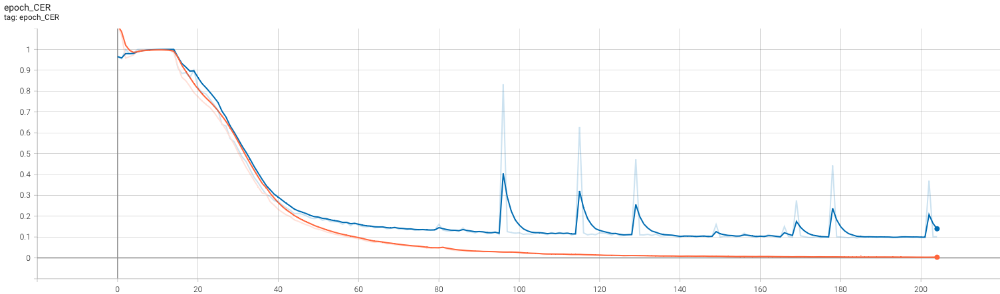

In [2]:
from IPython.display import Image, display
display(Image(filename='/Users/archishabhattacharya/Documents/ENSE480_Project/Models/ense480_project/202303121345/epoch_CER.png'))

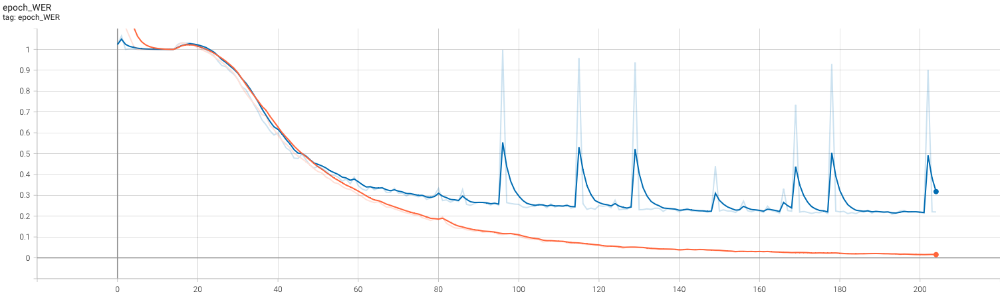

In [4]:
from IPython.display import Image, display
display(Image(filename='/Users/archishabhattacharya/Documents/ENSE480_Project/Models/ense480_project/202303121345/epoch_WER.png'))

### 2. Validating Model
The saved model is loaded and used to run prediction on the images from the validation set in `val.csv` in a for loop. The image path, image, label, prediction, CER and WER for each image is printed as well as the average CER and average WER is displayed

  0%|          | 0/301 [00:00<?, ?it/s]

Image:  Datasets/IAM_Sentences/sentences/g06/g06-011f/g06-011f-s01-00.png


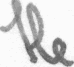

  0%|          | 1/301 [00:00<00:35,  8.53it/s]

Label: He
Prediction:  He
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031e/g06-031e-s04-00.png


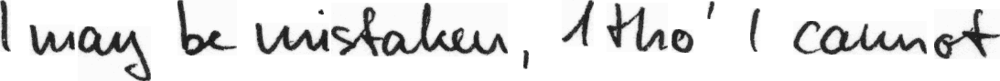

  1%|          | 2/301 [00:00<00:41,  7.22it/s]

Label: I may be mistaken , 1tho' I cannot
Prediction:  I may be mistaken , 1tho' I counot
CER: 0.058823529411764705; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/c03/c03-087f/c03-087f-s01-03.png


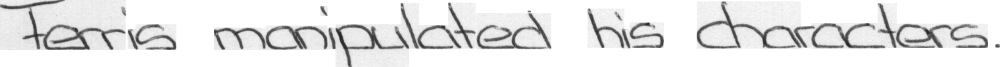

Label: Ferris manipulated his characters .
Prediction:  Ferris manipulated his characters .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050m/g06-050m-s02-05.png


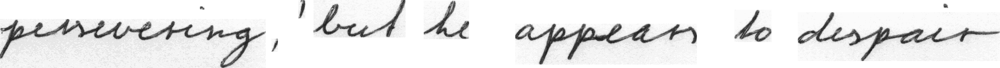

  1%|▏         | 4/301 [00:00<00:32,  9.03it/s]

Label: persevering , ' but he appears to despair
Prediction:  persevering , ' but he appear to despair
CER: 0.024390243902439025; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031i/g06-031i-s03-01.png


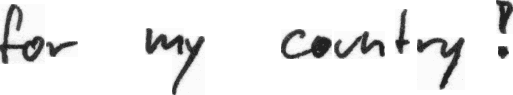

Label: for my country !
Prediction:  for my country !
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045m/g06-045m-s00-00.png


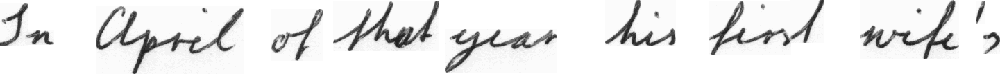

  2%|▏         | 6/301 [00:00<00:31,  9.40it/s]

Label: In April of that year his first wife's
Prediction:  In April of that year his first wife's
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026m/g06-026m-s03-00.png


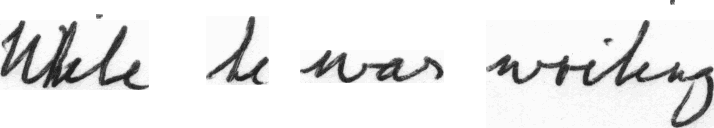

  2%|▏         | 7/301 [00:00<00:33,  8.72it/s]

Label: While he was writing
Prediction:  Wite he was writing
CER: 0.1; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011r/g06-011r-s02-00.png


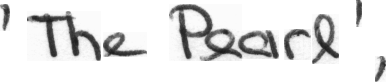

  3%|▎         | 8/301 [00:00<00:38,  7.59it/s]

Label: ' The Pearl ' ,
Prediction:  ' The Pearl ' ,
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045o/g06-045o-s00-06.png


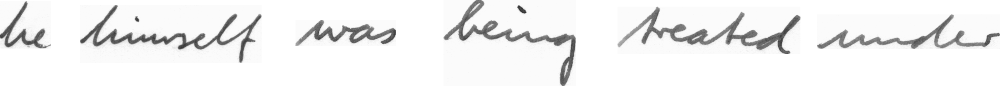

  3%|▎         | 9/301 [00:01<00:40,  7.13it/s]

Label: he himself was being treated under
Prediction:  he himself was being treated under
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-020x/a01-020x-s03-01.png


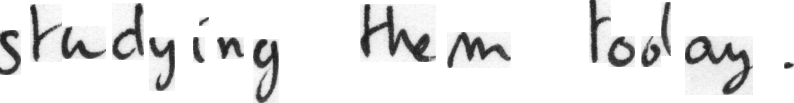

  3%|▎         | 10/301 [00:01<00:42,  6.80it/s]

Label: studying them today .
Prediction:  studying the m toolay .
CER: 0.14285714285714285; WER: 0.75
Image:  Datasets/IAM_Sentences/sentences/g07/g07-079a/g07-079a-s01-05.png


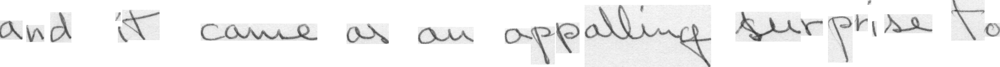

  4%|▎         | 11/301 [00:01<00:42,  6.76it/s]

Label: and it came as an appalling surprise to
Prediction:  and it came as an appalling surprise to
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037k/g06-037k-s03-03.png


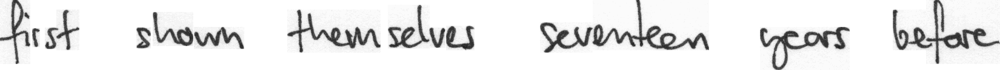

  4%|▍         | 12/301 [00:01<00:42,  6.75it/s]

Label: first shown themselves seventeen years before
Prediction:  first show themselves seventeen years before
CER: 0.022222222222222223; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/c03/c03-003c/c03-003c-s01-03.png


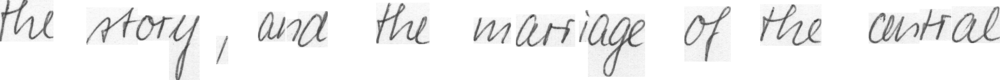

  4%|▍         | 13/301 [00:01<00:42,  6.77it/s]

Label: the story , and the marriage of the central
Prediction:  the story , and the marriage of the cntral
CER: 0.023255813953488372; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047e/g06-047e-s01-01.png


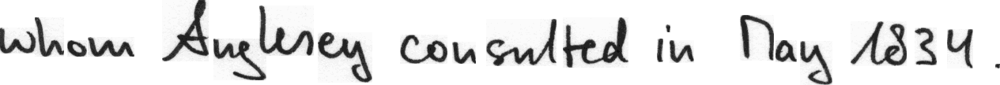

  5%|▍         | 14/301 [00:01<00:42,  6.77it/s]

Label: whom Anglesey consulted in May 1834 .
Prediction:  whom Auglesey consulted in May 1834y .
CER: 0.05405405405405406; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031m/g06-031m-s04-03.png


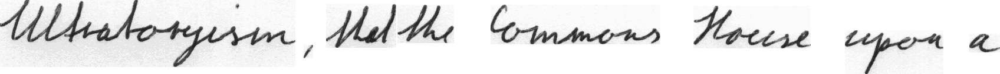

  5%|▍         | 15/301 [00:02<00:42,  6.80it/s]

Label: Ultratoryism , that the Commons House upon a
Prediction:  Ultratoryism , thet the Commons House upon a
CER: 0.022727272727272728; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011o/g06-011o-s05-00.png


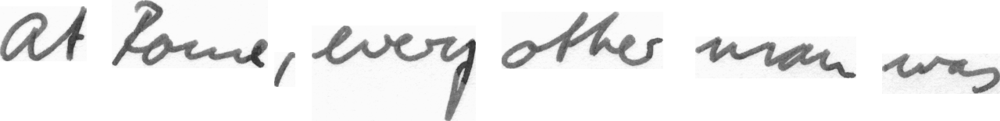

  5%|▌         | 16/301 [00:02<00:41,  6.87it/s]

Label: At Rome , every other man was
Prediction:  at Rome , every other man was
CER: 0.034482758620689655; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011m/g06-011m-s05-00.png


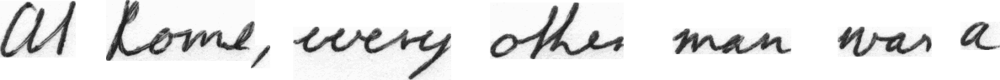

  6%|▌         | 17/301 [00:02<00:41,  6.90it/s]

Label: At Rome , every other man was a
Prediction:  At Rome , every other man was a
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037h/g06-037h-s02-01.png


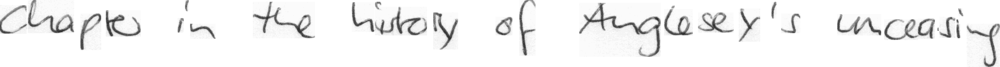

  6%|▌         | 18/301 [00:02<00:41,  6.86it/s]

Label: chapter in the history of Anglesey's unceasing
Prediction:  chapler in the history of Anglesey's unceasing
CER: 0.021739130434782608; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/h07/h07-051b/h07-051b-s01-06.png


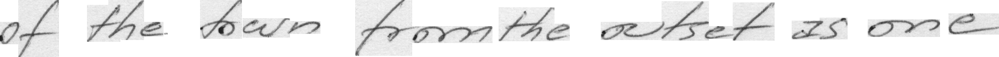

  6%|▋         | 19/301 [00:02<00:41,  6.74it/s]

Label: of the town from the outset as one
Prediction:  of the towr foromthe atret as onse
CER: 0.20588235294117646; WER: 0.625
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026a/g06-026a-s03-00.png


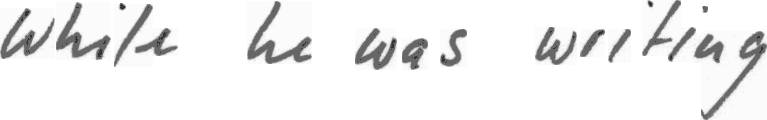

  7%|▋         | 20/301 [00:02<00:41,  6.77it/s]

Label: While he was writing
Prediction:  While he was writing
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-096d/c03-096d-s00-00.png


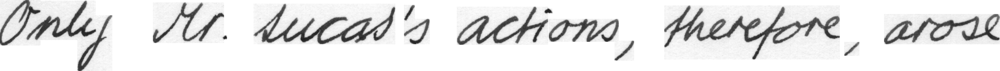

  7%|▋         | 21/301 [00:02<00:41,  6.71it/s]

Label: Only Mr. Lucas's actions , therefore , arose
Prediction:  Only Mr. Luca's actions , therefore , arose
CER: 0.022727272727272728; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/a01/a01-058u/a01-058u-s01-01.png


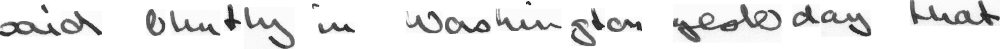

  7%|▋         | 22/301 [00:03<00:41,  6.71it/s]

Label: said bluntly in Washington yesterday that
Prediction:  said blntly in Washington yesterday that
CER: 0.024390243902439025; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/h07/h07-054a/h07-054a-s01-02.png


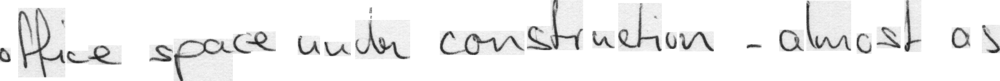

  8%|▊         | 23/301 [00:03<00:41,  6.75it/s]

Label: office space under construction - almost as
Prediction:  office space mude construetion -akmost as
CER: 0.13953488372093023; WER: 0.5714285714285714
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016a/c03-016a-s02-03.png


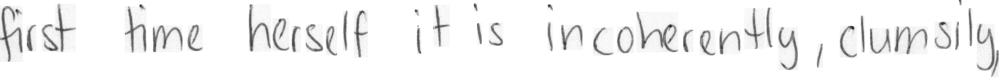

  8%|▊         | 24/301 [00:03<00:41,  6.67it/s]

Label: first time herself it is incoherently , clumsily ,
Prediction:  first time herself it is incoherently , clumsily
CER: 0.04; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/a01/a01-030u/a01-030u-s06-03.png


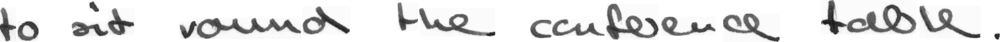

  8%|▊         | 25/301 [00:03<00:40,  6.76it/s]

Label: to sit round the conference table .
Prediction:  to sit round the conference toble .
CER: 0.02857142857142857; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/h07/h07-040b/h07-040b-s02-01.png


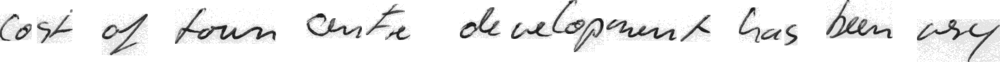

  9%|▊         | 26/301 [00:03<00:40,  6.83it/s]

Label: cost of town centre development has been very
Prediction:  cost of town ante development has been very
CER: 0.06666666666666667; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/c03/c03-007c/c03-007c-s00-01.png


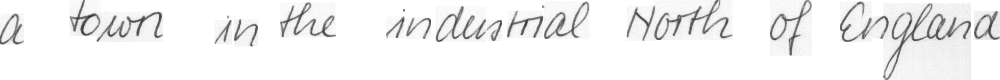

  9%|▉         | 27/301 [00:03<00:40,  6.82it/s]

Label: a town in the industrial North of England
Prediction:  a town in the industrial North of England
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018r/g06-018r-s01-03.png


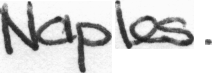

  9%|▉         | 28/301 [00:03<00:40,  6.80it/s]

Label: Naples .
Prediction:  Naples .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-032b/f07-032b-s00-04.png


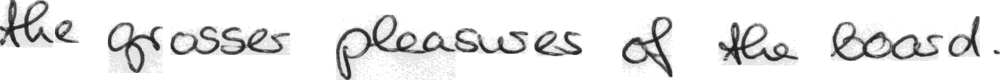

 10%|▉         | 29/301 [00:04<00:39,  6.81it/s]

Label: the grosser pleasures of the board .
Prediction:  the grosser pleasures of the board .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050c/g06-050c-s02-04.png


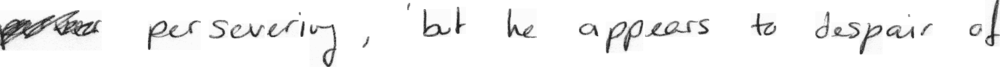

 10%|▉         | 30/301 [00:04<00:39,  6.88it/s]

Label: # persevering , ' but he appears to despair of
Prediction:  pskan persevering , ' but he appears to despair of
CER: 0.10869565217391304; WER: 0.1
Image:  Datasets/IAM_Sentences/sentences/h07/h07-040b/h07-040b-s02-02.png


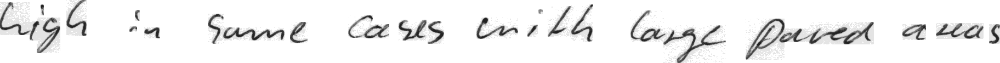

 10%|█         | 31/301 [00:04<00:39,  6.84it/s]

Label: high in some cases with large paved areas
Prediction:  high in same cases emith larnge paved areas
CER: 0.0975609756097561; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/c03/c03-000f/c03-000f-s01-05.png


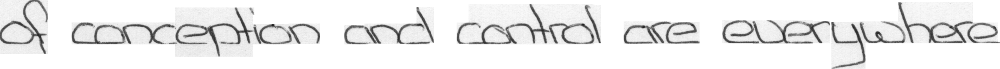

 11%|█         | 32/301 [00:04<00:39,  6.83it/s]

Label: of conception and control are everywhere
Prediction:  of conception and control are everywhere
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-030x/a01-030x-s00-00.png


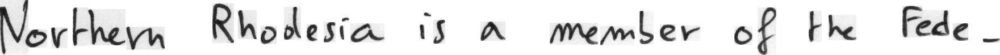

 11%|█         | 33/301 [00:04<00:39,  6.84it/s]

Label: Northern Rhodesia is a member of the Fede-
Prediction:  Northen Rhodesia is a member of the Fede-
CER: 0.023809523809523808; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/a01/a01-020u/a01-020u-s02-01.png


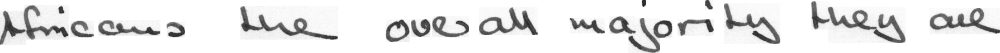

 11%|█▏        | 34/301 [00:04<00:39,  6.84it/s]

Label: Africans the overall majority they are
Prediction:  Africans the overall mgjority they are
CER: 0.02631578947368421; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037i/g06-037i-s03-00.png


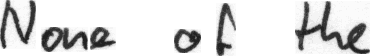

 12%|█▏        | 35/301 [00:04<00:38,  6.91it/s]

Label: None of the
Prediction:  None of the
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-021c/c03-021c-s01-00.png


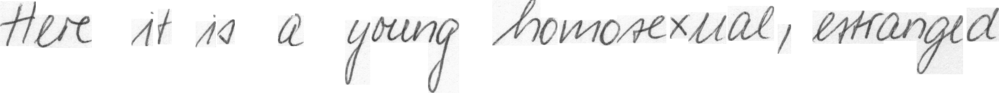

 12%|█▏        | 36/301 [00:05<00:38,  6.86it/s]

Label: Here it is a young homosexual , estranged
Prediction:  Here it is a young homovexual , estranged
CER: 0.024390243902439025; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011l/g06-011l-s03-00.png


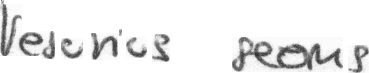

 12%|█▏        | 37/301 [00:05<00:37,  6.95it/s]

Label: Vesuvius seems
Prediction:  Vesunius seons
CER: 0.21428571428571427; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-081f/c03-081f-s01-01.png


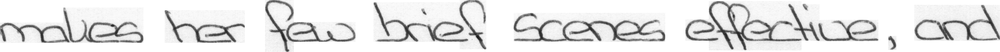

 13%|█▎        | 38/301 [00:05<00:38,  6.87it/s]

Label: makes her few brief scenes effective , and
Prediction:  makes her few brief scenes effective , and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-021c/c03-021c-s01-03.png


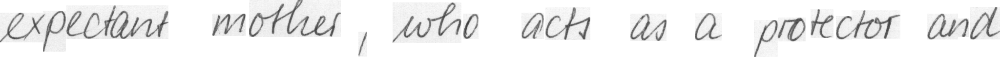

 13%|█▎        | 39/301 [00:05<00:38,  6.82it/s]

Label: expectant mother , who acts as a protector and
Prediction:  expectant mother , who acts as a protector and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-087a/c03-087a-s00-04.png


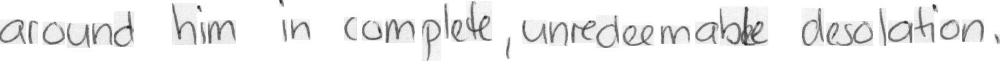

 13%|█▎        | 40/301 [00:05<00:38,  6.81it/s]

Label: around him in complete , unredeemable desolation .
Prediction:  around him in complete , unredeemable desolation .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037c/g06-037c-s01-00.png


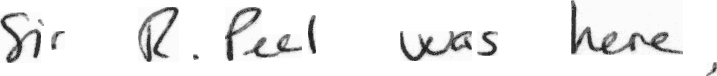

 14%|█▎        | 41/301 [00:05<00:37,  6.85it/s]

Label: Sir R. Peel was here ,
Prediction:  Sir R. Peel was here .
CER: 0.045454545454545456; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/a01/a01-107u/a01-107u-s00-00.png


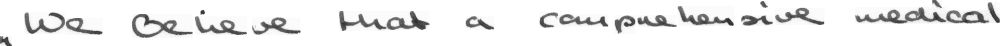

 14%|█▍        | 42/301 [00:06<00:37,  6.87it/s]

Label: " We believe that a comprehensive medical
Prediction:  " We bekeve that a comprehensive medical
CER: 0.04878048780487805; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/c03/c03-087b/c03-087b-s01-03.png


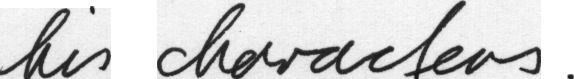

 14%|█▍        | 43/301 [00:06<00:38,  6.74it/s]

Label: his characters .
Prediction:  his chearactens .
CER: 0.125; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042j/g06-042j-s00-01.png


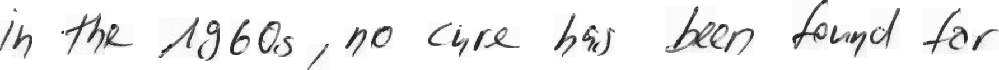

 15%|█▍        | 44/301 [00:06<00:38,  6.67it/s]

Label: in the 1960s , no cure has been found for
Prediction:  in the 1960s , no cure has been tound for
CER: 0.024390243902439025; WER: 0.1
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037r/g06-037r-s01-00.png


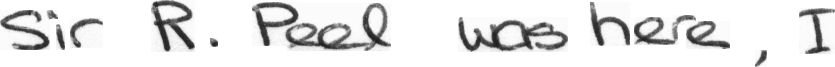

 15%|█▍        | 45/301 [00:06<00:38,  6.66it/s]

Label: Sir R. Peel was here , I
Prediction:  Sir R. Peel was here , I
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050i/g06-050i-s02-01.png


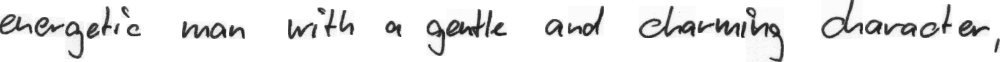

 15%|█▌        | 46/301 [00:06<00:38,  6.66it/s]

Label: energetic man with a gentle and charming character ,
Prediction:  energetic man with a gentte and charming character ,
CER: 0.019230769230769232; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050f/g06-050f-s01-01.png


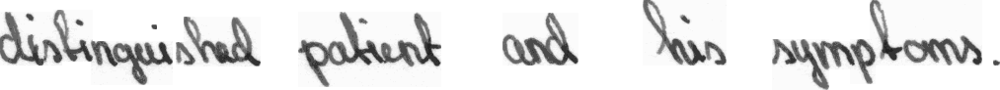

 16%|█▌        | 47/301 [00:06<00:37,  6.71it/s]

Label: distinguished patient and his symptoms .
Prediction:  distinguished patient and his symptoms .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026e/g06-026e-s03-02.png


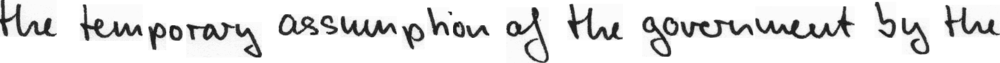

 16%|█▌        | 48/301 [00:06<00:38,  6.64it/s]

Label: the temporary assumption of the government by the
Prediction:  the temporary asumption of the government by the
CER: 0.02040816326530612; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037l/g06-037l-s01-00.png


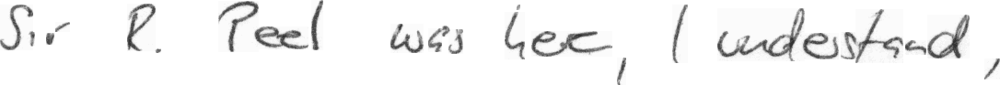

 16%|█▋        | 49/301 [00:07<00:38,  6.53it/s]

Label: Sir R. Peel was here , I understand ,
Prediction:  Sir R. Peel was here , I understand ,
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026k/g06-026k-s03-03.png


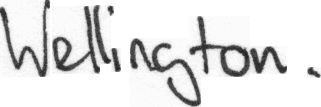

 17%|█▋        | 50/301 [00:07<00:39,  6.32it/s]

Label: Wellington .
Prediction:  Wellington .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018n/g06-018n-s00-01.png


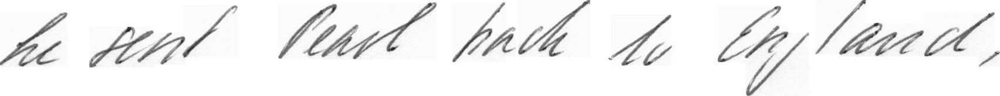

 17%|█▋        | 51/301 [00:07<00:40,  6.11it/s]

Label: he sent Pearl back to England ,
Prediction:  he sent Pearl hack to England ,
CER: 0.03225806451612903; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031r/g06-031r-s04-00.png


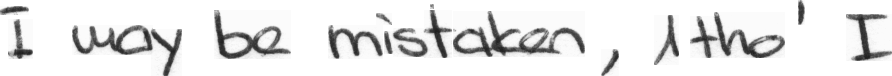

 17%|█▋        | 52/301 [00:07<00:42,  5.85it/s]

Label: I may be mistaken , 1tho' I
Prediction:  I way be mistaken , 1tho' 7
CER: 0.07407407407407407; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/a01/a01-128u/a01-128u-s00-02.png


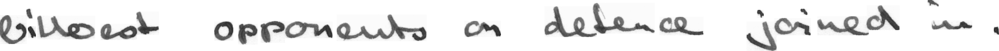

 18%|█▊        | 53/301 [00:07<00:42,  5.77it/s]

Label: bitterest opponents on defence joined in .
Prediction:  billoest opponents on detence joined in .
CER: 0.11904761904761904; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/a01/a01-000x/a01-000x-s01-00.png


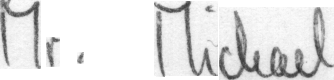

 18%|█▊        | 54/301 [00:07<00:44,  5.55it/s]

Label: Mr. Michael
Prediction:  Mr. Tichel
CER: 0.18181818181818182; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/a01/a01-113u/a01-113u-s00-02.png


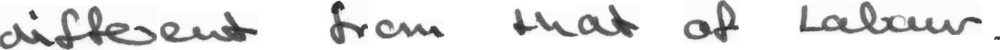

 18%|█▊        | 55/301 [00:08<00:44,  5.53it/s]

Label: different from that of Labour .
Prediction:  different from that of Labour .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-046a/f07-046a-s00-03.png


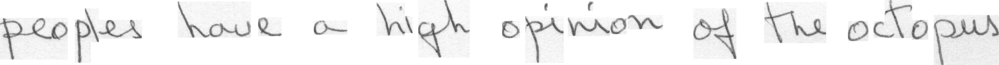

 19%|█▊        | 56/301 [00:08<00:45,  5.40it/s]

Label: peoples have a high opinion of the octopus
Prediction:  peoples have a high opivion of the oclopus
CER: 0.047619047619047616; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g07/g07-000a/g07-000a-s01-02.png


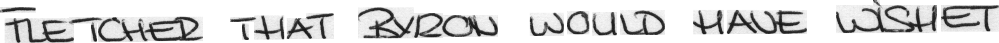

 19%|█▉        | 57/301 [00:08<00:44,  5.43it/s]

Label: FLETCHER THAT BYRON WOULD HAVE WISHED
Prediction:  TETOHER THAT BYRON WOUND HANE WISHET
CER: 0.16216216216216217; WER: 0.6666666666666666
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031i/g06-031i-s03-00.png


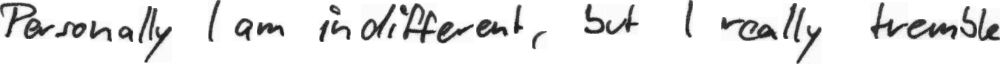

 19%|█▉        | 58/301 [00:08<00:43,  5.54it/s]

Label: Personally I am indifferent , but I really tremble
Prediction:  Personally I am indifferent , but I really tremble
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/k07/k07-063a/k07-063a-s02-01.png


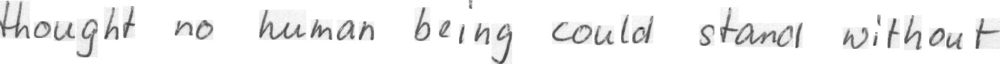

 20%|█▉        | 59/301 [00:08<00:43,  5.57it/s]

Label: thought no human being could stand without
Prediction:  thought no human being could stano without
CER: 0.023809523809523808; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050d/g06-050d-s02-04.png


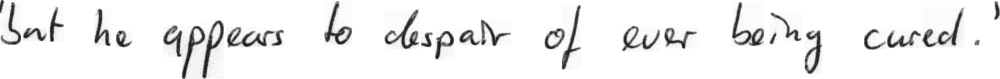

 20%|█▉        | 60/301 [00:09<00:42,  5.65it/s]

Label: ' but he appears to despair of ever being cured . '
Prediction:  'but he appears to despair of ever being cured . '
CER: 0.0196078431372549; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026n/g06-026n-s03-00.png


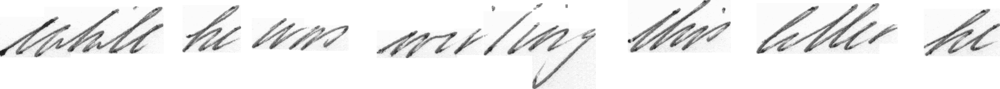

 20%|██        | 61/301 [00:09<00:42,  5.66it/s]

Label: While he was writing this letter he
Prediction:  Wahile hewas wiriling this letter he
CER: 0.11428571428571428; WER: 0.5714285714285714
Image:  Datasets/IAM_Sentences/sentences/g07/g07-000a/g07-000a-s01-05.png


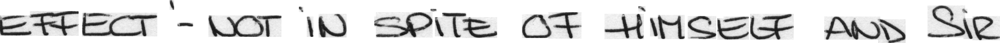

 21%|██        | 62/301 [00:09<00:43,  5.56it/s]

Label: EFFECT ' - NOT IN SPITE OF HIMSELF AND SIR
Prediction:  EFFEOT ' - NOT IN SPITE OF HIMSEEF AND SIR
CER: 0.047619047619047616; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/k07/k07-063a/k07-063a-s02-02.png


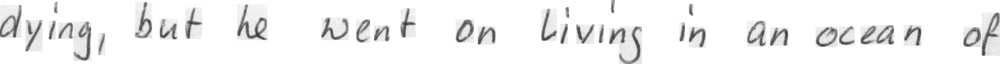

 21%|██        | 63/301 [00:09<00:42,  5.63it/s]

Label: dying , but he went on living in an ocean of
Prediction:  dying , but he went on living in an ocean of
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045r/g06-045r-s00-06.png


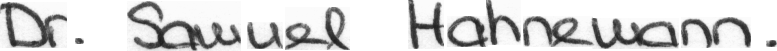

 21%|██▏       | 64/301 [00:09<00:42,  5.62it/s]

Label: Dr. Samuel Hahnemann .
Prediction:  Dr. Souuel Hahneuann .
CER: 0.13636363636363635; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050b/g06-050b-s02-00.png


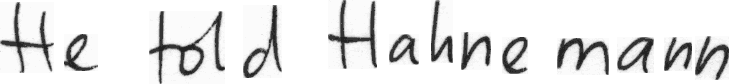

 22%|██▏       | 65/301 [00:09<00:41,  5.71it/s]

Label: He told Hahnemann
Prediction:  He told Hahne mann
CER: 0.058823529411764705; WER: 0.6666666666666666
Image:  Datasets/IAM_Sentences/sentences/a01/a01-082u/a01-082u-s00-00.png


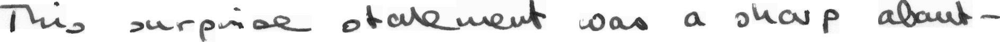

 22%|██▏       | 66/301 [00:10<00:40,  5.77it/s]

Label: This surprising statement was a sharp about-
Prediction:  This surprise ofatement was a sharp about-
CER: 0.11363636363636363; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/f07/f07-042b/f07-042b-s00-01.png


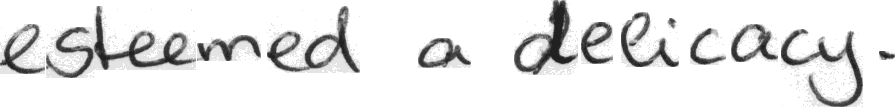

 22%|██▏       | 67/301 [00:10<00:40,  5.74it/s]

Label: esteemed a delicacy .
Prediction:  esteemed a delicacy .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-077u/a01-077u-s01-00.png


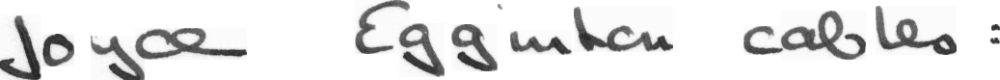

 23%|██▎       | 68/301 [00:10<00:40,  5.82it/s]

Label: Joyce Egginton cables :
Prediction:  loyoe Egginton cables :
CER: 0.08695652173913043; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/a01/a01-053u/a01-053u-s00-01.png


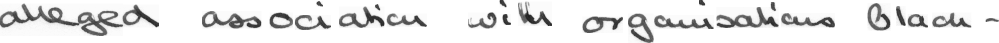

 23%|██▎       | 69/301 [00:10<00:40,  5.74it/s]

Label: alleged association with organisations black-
Prediction:  alleged association with organisations blacu -
CER: 0.044444444444444446; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/g07/g07-026a/g07-026a-s00-07.png


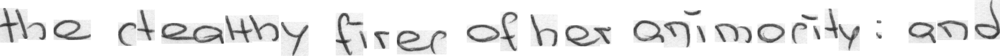

 23%|██▎       | 70/301 [00:10<00:39,  5.83it/s]

Label: the stealthy fires of her animosity : and
Prediction:  the cteathy fires of her arimority : and
CER: 0.0975609756097561; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011a/g06-011a-s03-01.png


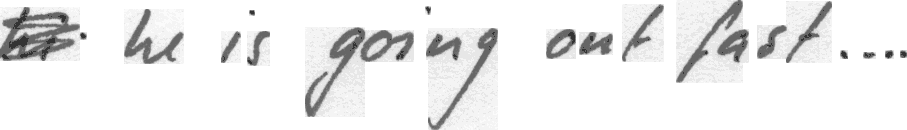

 24%|██▎       | 71/301 [00:10<00:37,  6.12it/s]

Label: # he is going out fast ... .
Prediction:  B he is going out fast ... .
CER: 0.03571428571428571; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/c03/c03-000b/c03-000b-s01-01.png


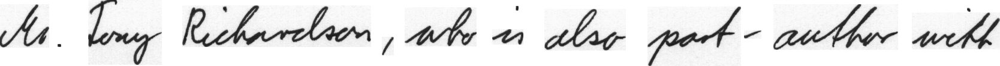

 24%|██▍       | 72/301 [00:11<00:36,  6.32it/s]

Label: Mr. Tony Richardson , who is also part-author with
Prediction:  Mr. Tony Richardson , who is also part-author with
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-128u/a01-128u-s00-00.png


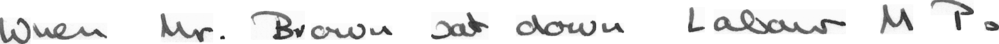

 24%|██▍       | 73/301 [00:11<00:35,  6.43it/s]

Label: Ps
Prediction:  When Mr. Prown st down kb
CER: 11.5; WER: 6.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018g/g06-018g-s01-02.png


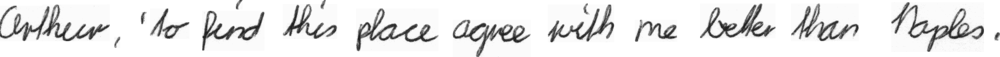

 25%|██▍       | 74/301 [00:11<00:35,  6.47it/s]

Label: Arthur , ' to find this place agree with me better than Naples .
Prediction:  Aurthur , ' to find this place agree with me beter than Naples ,
CER: 0.046875; WER: 0.21428571428571427
Image:  Datasets/IAM_Sentences/sentences/a01/a01-020x/a01-020x-s01-01.png


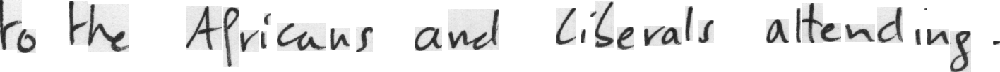

 25%|██▍       | 75/301 [00:11<00:34,  6.57it/s]

Label: to the Africans and Liberals attending .
Prediction:  to the Africans and Liberals altending .
CER: 0.025; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037d/g06-037d-s02-00.png


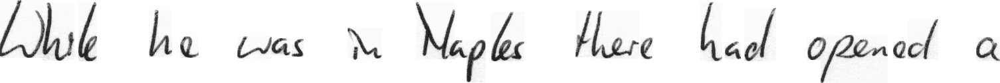

 25%|██▌       | 76/301 [00:11<00:33,  6.66it/s]

Label: While he was in Naples there had opened a
Prediction:  Whle he was in Naples there had opened a
CER: 0.024390243902439025; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011e/g06-011e-s00-00.png


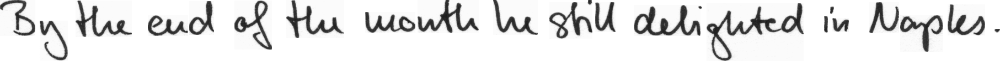

 26%|██▌       | 77/301 [00:11<00:33,  6.74it/s]

Label: By the end of the month he still delighted in Naples .
Prediction:  By the end of the month he still delighted in Naples .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-003a/g07-003a-s01-01.png


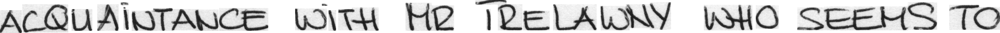

 26%|██▌       | 78/301 [00:11<00:32,  6.80it/s]

Label: ACQUAINTANCE WITH MR TRELAWNY WHO SEEMS TO
Prediction:  ACOUAINTANCE WITH MR IRELAWNY WHO SEENS TO
CER: 0.07142857142857142; WER: 0.42857142857142855
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016a/c03-016a-s03-02.png


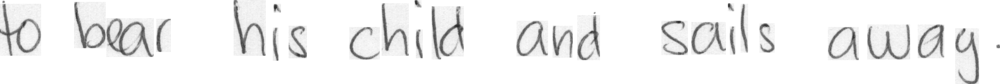

 26%|██▌       | 79/301 [00:12<00:32,  6.84it/s]

Label: to bear his child and sails away .
Prediction:  to bear his child and sails away .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026c/g06-026c-s01-01.png


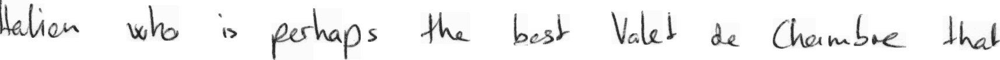

 27%|██▋       | 80/301 [00:12<00:32,  6.89it/s]

Label: Italian who is perhaps the best Valet de Chambre that
Prediction:  talion who is perhaps the best Valet de chambre that
CER: 0.05660377358490566; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/a01/a01-038x/a01-038x-s00-02.png


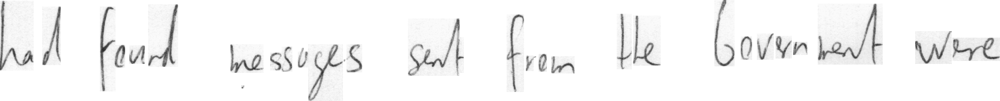

 27%|██▋       | 81/301 [00:12<00:31,  6.89it/s]

Label: had found messages sent from the Government were
Prediction:  had foud nesuyes sut fran the Govmsent wre
CER: 0.2916666666666667; WER: 0.75
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094a/c03-094a-s00-04.png


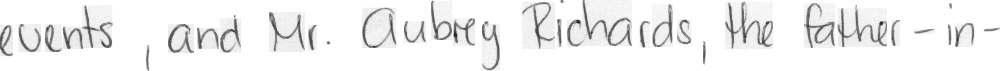

 27%|██▋       | 82/301 [00:12<00:31,  6.91it/s]

Label: events , and Mr. Aubrey Richards , the father-in-
Prediction:  events , and Mr. Aubrey Richards , the father-in-
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011k/g06-011k-s05-03.png


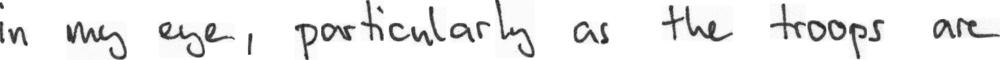

 28%|██▊       | 83/301 [00:12<00:31,  6.88it/s]

Label: in my eye , particularly as the troops are
Prediction:  in my eye , particularly as the troops are
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-007e/c03-007e-s00-00.png


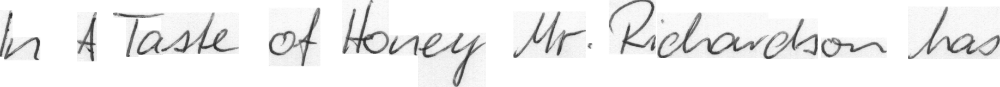

 28%|██▊       | 84/301 [00:12<00:31,  6.78it/s]

Label: In A Taste of Honey Mr. Richardson has
Prediction:  In A Taste of Honey Mr. Richardson has
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050g/g06-050g-s00-01.png


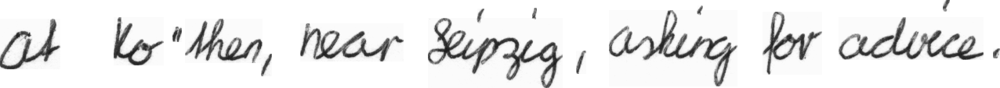

 28%|██▊       | 85/301 [00:12<00:31,  6.80it/s]

Label: at Ko"then , near Leipzig , asking for advice .
Prediction:  at Ko"then, near Leipzig , asking for advice .
CER: 0.02127659574468085; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/h07/h07-078a/h07-078a-s00-07.png


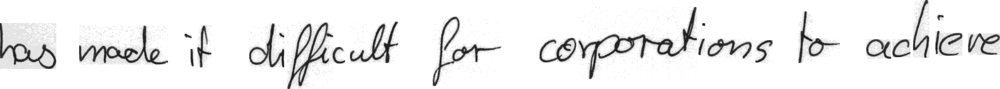

 29%|██▊       | 86/301 [00:13<00:31,  6.79it/s]

Label: has made it difficult for corporations to achieve
Prediction:  has madke it difeult for corporations to acticre
CER: 0.14285714285714285; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/a01/a01-043x/a01-043x-s01-00.png


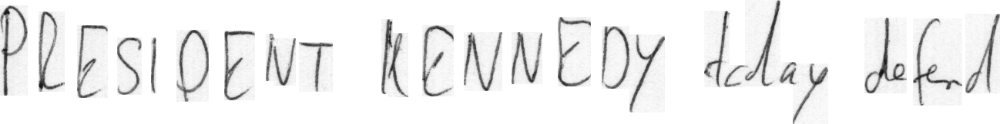

 29%|██▉       | 87/301 [00:13<00:31,  6.87it/s]

Label: PRESIDENT KENNEDY today defended
Prediction:  PRESIDENT KENNEDY day defud
CER: 0.1875; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031r/g06-031r-s04-03.png


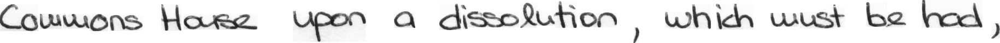

 29%|██▉       | 88/301 [00:13<00:31,  6.74it/s]

Label: Commons House upon a dissolution , which must be had ,
Prediction:  Coumons Harse upon a dissolution , which must be had ,
CER: 0.05555555555555555; WER: 0.18181818181818182
Image:  Datasets/IAM_Sentences/sentences/f07/f07-084a/f07-084a-s02-02.png


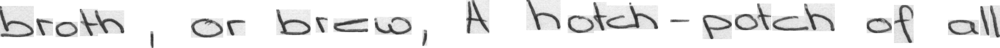

 30%|██▉       | 89/301 [00:13<00:31,  6.64it/s]

Label: broth , or brew , A hotch-potch of all
Prediction:  broth , or brew , A hotch-potch of all
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-026b/g07-026b-s00-07.png


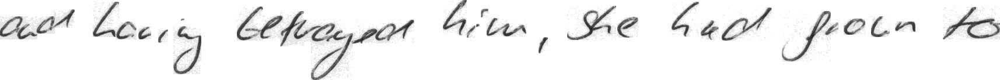

 30%|██▉       | 90/301 [00:13<00:31,  6.59it/s]

Label: and having betrayed him , she had grown to
Prediction:  and hawing betrayed him , She had frown to
CER: 0.07142857142857142; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011c/g06-011c-s03-01.png


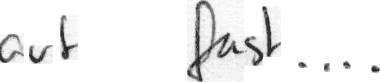

 30%|███       | 91/301 [00:13<00:32,  6.43it/s]

Label: out fast ... .
Prediction:  aut fust ... .
CER: 0.14285714285714285; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037r/g06-037r-s00-00.png


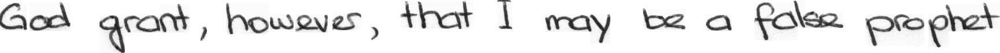

 31%|███       | 92/301 [00:14<00:33,  6.29it/s]

Label: God grant , however , that I may be a false prophet
Prediction:  God grant , however , that I may be a false prophet
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-003d/c03-003d-s02-03.png


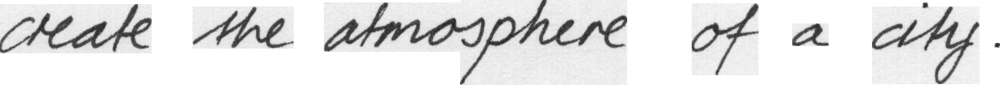

 31%|███       | 93/301 [00:14<00:35,  5.92it/s]

Label: create the atmosphere of a city .
Prediction:  cheate the atmosphere of a city .
CER: 0.030303030303030304; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/a01/a01-107u/a01-107u-s04-01.png


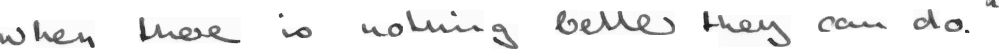

 31%|███       | 94/301 [00:14<00:34,  6.06it/s]

Label: when there is nothing better they can do . "
Prediction:  when there is nothing better they can do . "
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-060b/h07-060b-s01-04.png


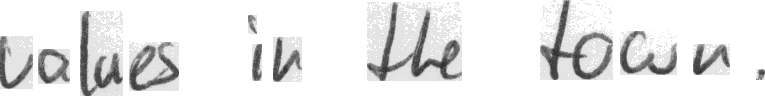

 32%|███▏      | 95/301 [00:14<00:32,  6.43it/s]

Label: values in the town .
Prediction:  wales in the town .
CER: 0.1; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011b/g06-011b-s03-00.png


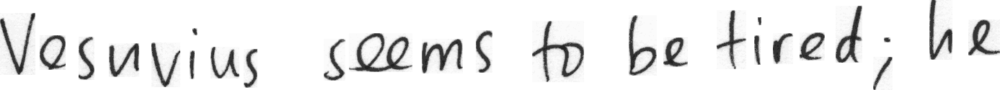

 32%|███▏      | 96/301 [00:14<00:30,  6.64it/s]

Label: Vesuvius seems to be tired ; he
Prediction:  Vesuvius seems to be tired ; he
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042p/g06-042p-s01-03.png


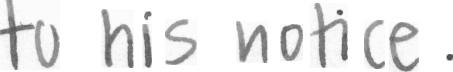

 32%|███▏      | 97/301 [00:14<00:29,  6.84it/s]

Label: to his notice .
Prediction:  t his notice .
CER: 0.06666666666666667; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031n/g06-031n-s01-01.png


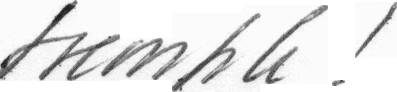

 33%|███▎      | 98/301 [00:14<00:29,  6.97it/s]

Label: tremble !
Prediction:  treomble !
CER: 0.1111111111111111; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/a01/a01-096u/a01-096u-s02-01.png


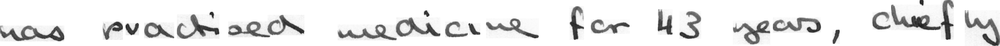

 33%|███▎      | 99/301 [00:15<00:29,  6.86it/s]

Label: has practised medicine for 43 years , chiefly
Prediction:  has practised medicine for 1s years , chiefly
CER: 0.044444444444444446; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037l/g06-037l-s03-00.png


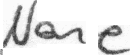

 33%|███▎      | 100/301 [00:15<00:29,  6.90it/s]

Label: None
Prediction:  Nane
CER: 0.25; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-038x/a01-038x-s00-00.png


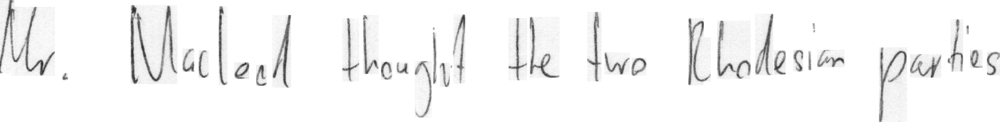

 34%|███▎      | 101/301 [00:15<00:29,  6.86it/s]

Label: Mr. Macleod thought the two Rhodesian parties
Prediction:  Mr. Nalod thaught the tho Rhatesin pastis
CER: 0.2222222222222222; WER: 0.7142857142857143
Image:  Datasets/IAM_Sentences/sentences/a01/a01-020x/a01-020x-s01-00.png


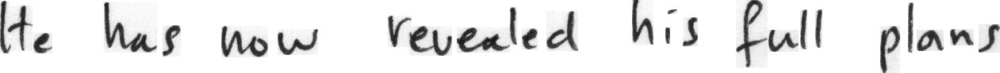

 34%|███▍      | 102/301 [00:15<00:28,  6.96it/s]

Label: He has now revealed his full plans
Prediction:  He has now revealed his full plans
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-019b/f07-019b-s00-09.png


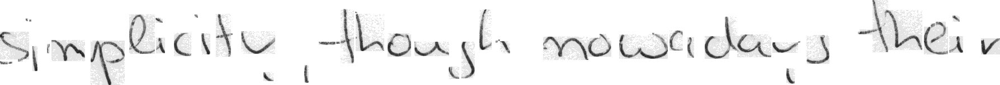

 34%|███▍      | 103/301 [00:15<00:28,  7.05it/s]

Label: simplicity , though nowadays their
Prediction:  simplicity , though nowadaus their
CER: 0.029411764705882353; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/f07/f07-081b/f07-081b-s01-02.png


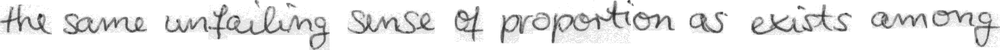

 35%|███▍      | 104/301 [00:15<00:27,  7.13it/s]

Label: the same unfailing sense of proportion as exists among
Prediction:  the same unfailing sunse of proportion as evists among
CER: 0.037037037037037035; WER: 0.2222222222222222
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050b/g06-050b-s01-01.png


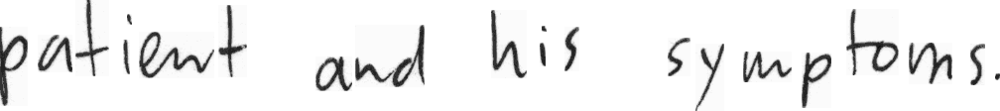

 35%|███▍      | 105/301 [00:15<00:27,  7.01it/s]

Label: patient and his symptoms .
Prediction:  patient and his symptoms .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-051b/h07-051b-s01-07.png


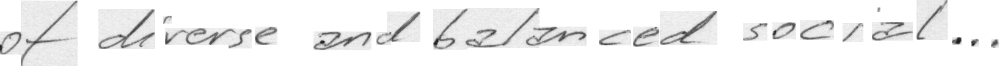

 35%|███▌      | 106/301 [00:16<00:27,  7.01it/s]

Label: of diverse and balanced social ...
Prediction:  of diverse and balanced social .
CER: 0.058823529411764705; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/a01/a01-096u/a01-096u-s03-00.png


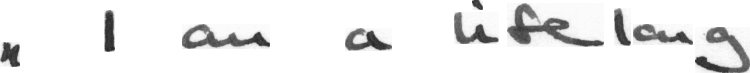

 36%|███▌      | 107/301 [00:16<00:27,  7.12it/s]

Label: " I am a lifelong
Prediction:  " I an a lifelang
CER: 0.11764705882352941; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050m/g06-050m-s02-03.png


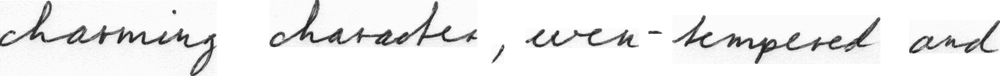

 36%|███▌      | 108/301 [00:16<00:26,  7.17it/s]

Label: charming character , even-tempered and
Prediction:  charming character , wven-tempered and
CER: 0.02631578947368421; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g07/g07-022b/g07-022b-s01-01.png


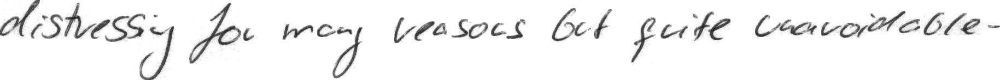

 36%|███▌      | 109/301 [00:16<00:26,  7.19it/s]

Label: distressing for many reasons but quite unavoidable -
Prediction:  distessing for may reasous but fuite mavodoove-
CER: 0.21153846153846154; WER: 0.75
Image:  Datasets/IAM_Sentences/sentences/a01/a01-072x/a01-072x-s02-02.png


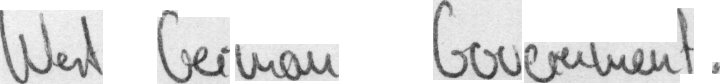

 37%|███▋      | 110/301 [00:16<00:26,  7.13it/s]

Label: West German Government .
Prediction:  Weat German Goverement .
CER: 0.08333333333333333; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050i/g06-050i-s01-00.png


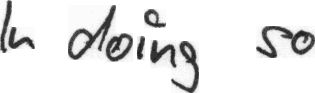

 37%|███▋      | 111/301 [00:16<00:26,  7.20it/s]

Label: In doing so
Prediction:  In doing so
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011o/g06-011o-s03-01.png


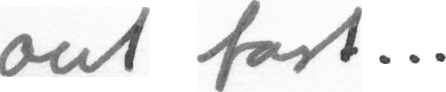

 37%|███▋      | 112/301 [00:16<00:26,  7.19it/s]

Label: out fast ... .
Prediction:  out fast ... .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031d/g06-031d-s03-01.png


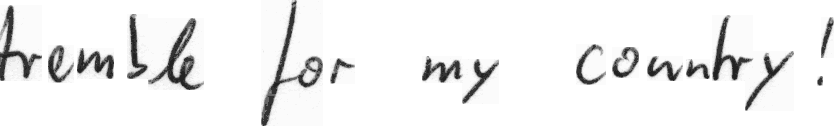

 38%|███▊      | 113/301 [00:17<00:26,  7.21it/s]

Label: tremble for my country !
Prediction:  tremble for my country !
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042l/g06-042l-s01-02.png


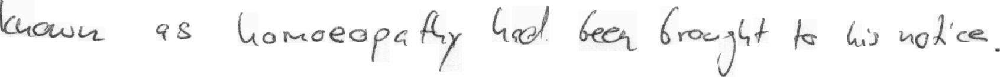

 38%|███▊      | 114/301 [00:17<00:25,  7.23it/s]

Label: known as homoeopathy had been brought to his notice .
Prediction:  known as homoeopatly had been brought to wis notice .
CER: 0.03773584905660377; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/c03/c03-081e/c03-081e-s01-04.png


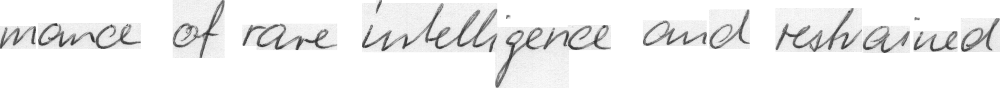

 38%|███▊      | 115/301 [00:17<00:25,  7.24it/s]

Label: mance of rare intelligence and restrained
Prediction:  mance of rare intelligence and restrained
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050n/g06-050n-s02-00.png


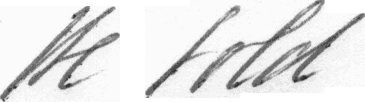

 39%|███▊      | 116/301 [00:17<00:25,  7.26it/s]

Label: He told
Prediction:  He told
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-077a/g07-077a-s00-01.png


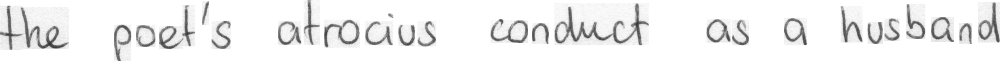

 39%|███▉      | 117/301 [00:17<00:25,  7.24it/s]

Label: the poet's atrocious conduct as a husband
Prediction:  the poet's atrocius conduct as a husband
CER: 0.024390243902439025; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/f07/f07-042a/f07-042a-s02-03.png


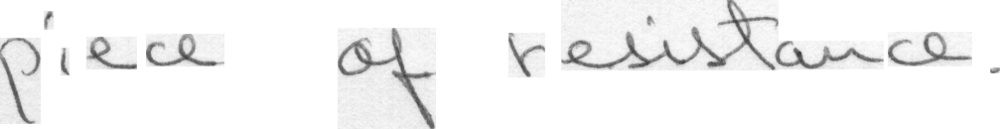

 39%|███▉      | 118/301 [00:17<00:25,  7.27it/s]

Label: piece of resistance .
Prediction:  piece of resistance .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031j/g06-031j-s02-01.png


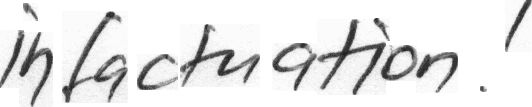

 40%|███▉      | 119/301 [00:17<00:25,  7.25it/s]

Label: infatuation !
Prediction:  infactuation !
CER: 0.07692307692307693; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g07/g07-014b/g07-014b-s01-02.png


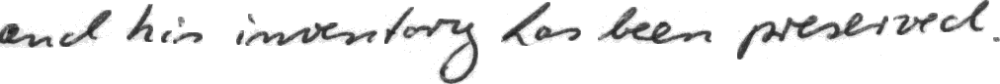

 40%|███▉      | 120/301 [00:18<00:25,  7.23it/s]

Label: and his inventory has been preserved .
Prediction:  end his investory has been preseroed .
CER: 0.07894736842105263; WER: 0.42857142857142855
Image:  Datasets/IAM_Sentences/sentences/f07/f07-028a/f07-028a-s02-01.png


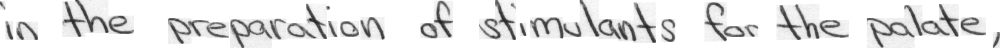

 40%|████      | 121/301 [00:18<00:25,  7.16it/s]

Label: in the preparation of stimulants for the palate ,
Prediction:  in the preparation of stimwlants for the palate ,
CER: 0.02040816326530612; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/f07/f07-088b/f07-088b-s01-01.png


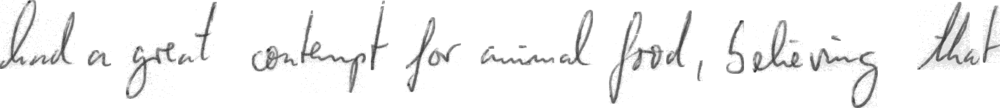

 41%|████      | 122/301 [00:18<00:25,  7.02it/s]

Label: had a great contempt for animal food , believing that
Prediction:  handa grant castepst for ainad ford , belesing that
CER: 0.2641509433962264; WER: 0.7
Image:  Datasets/IAM_Sentences/sentences/g07/g07-079a/g07-079a-s01-06.png


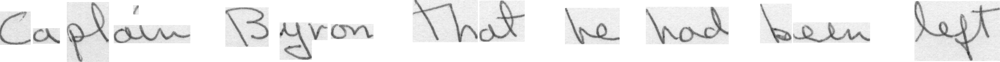

 41%|████      | 123/301 [00:18<00:25,  7.07it/s]

Label: Captain Byron that he had been left
Prediction:  Caplain Byron that he had been Left
CER: 0.05714285714285714; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031f/g06-031f-s02-00.png


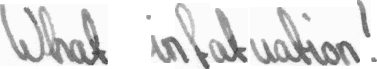

 41%|████      | 124/301 [00:18<00:24,  7.09it/s]

Label: What infatuation !
Prediction:  What infatuation !
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-122u/a01-122u-s01-00.png


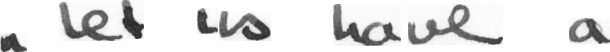

 42%|████▏     | 125/301 [00:18<00:24,  7.15it/s]

Label: " Let us have a
Prediction:  " let ws have a
CER: 0.13333333333333333; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/a01/a01-132u/a01-132u-s02-00.png


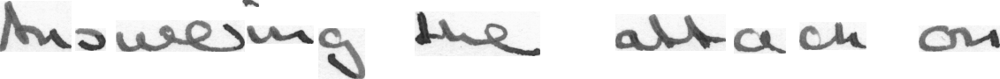

 42%|████▏     | 126/301 [00:18<00:24,  7.16it/s]

Label: Answering the attack on
Prediction:  Answering the attacn on
CER: 0.043478260869565216; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/a01/a01-007u/a01-007u-s00-00.png


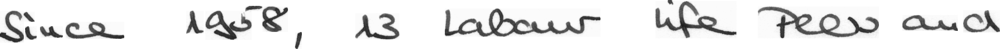

 42%|████▏     | 127/301 [00:19<00:24,  7.16it/s]

Label: Since 1958 , 13 Labour life Peers and
Prediction:  Since 19r0 , 1s Labour life Peer and
CER: 0.10810810810810811; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045i/g06-045i-s00-00.png


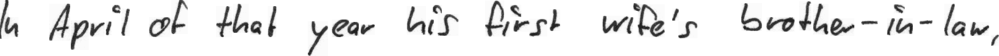

 43%|████▎     | 128/301 [00:19<00:24,  7.07it/s]

Label: In April of that year his first wife's brother-in-law ,
Prediction:  In April of that year his first wife's brother-in-law ,
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045j/g06-045j-s00-05.png


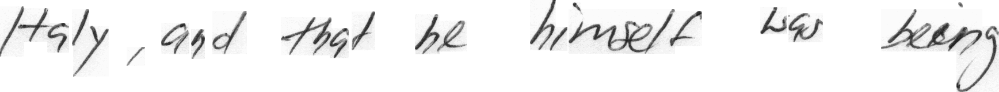

 43%|████▎     | 129/301 [00:19<00:24,  7.09it/s]

Label: Italy , and that he himself was being
Prediction:  Italy , and that he himself was being
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047m/g06-047m-s01-02.png


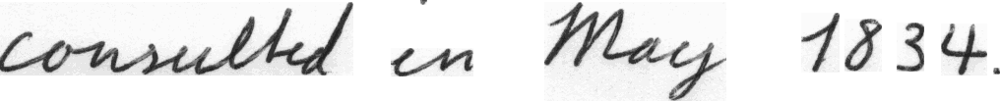

 43%|████▎     | 130/301 [00:19<00:24,  7.10it/s]

Label: consulted in May 1834 .
Prediction:  consulted in May 1834 .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-042b/f07-042b-s00-00.png


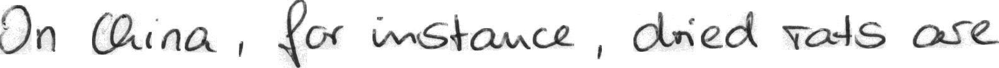

 44%|████▎     | 131/301 [00:19<00:24,  7.08it/s]

Label: In China , for instance , dried rats are
Prediction:  On China , for instance , dried rats are
CER: 0.025; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g07/g07-018a/g07-018a-s02-05.png


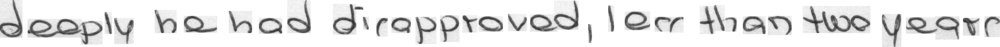

 44%|████▍     | 132/301 [00:19<00:23,  7.05it/s]

Label: deeply he had disapproved , less than two years
Prediction:  deeply he had disapproved , lerr than twoyears
CER: 0.06382978723404255; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/c03/c03-096b/c03-096b-s00-00.png


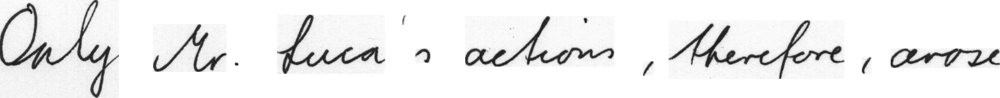

 44%|████▍     | 133/301 [00:19<00:23,  7.02it/s]

Label: Only Mr. Lucas's actions , therefore , arose
Prediction:  Only Mr. fuca's action , therfore , arose
CER: 0.09090909090909091; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045m/g06-045m-s00-01.png


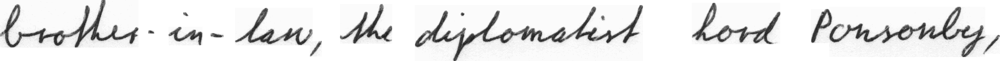

 45%|████▍     | 134/301 [00:20<00:23,  7.09it/s]

Label: brother-in-law , the diplomatist Lord Ponsonby ,
Prediction:  brother-in-law , the diplomatist hord Ponsonby ,
CER: 0.020833333333333332; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045l/g06-045l-s00-01.png


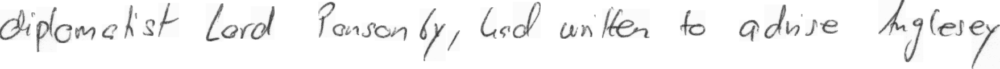

 45%|████▍     | 135/301 [00:20<00:23,  7.05it/s]

Label: diplomatist Lord Ponsonby , had written to advise Anglesey
Prediction:  diplomatist Lord Ponsonby , had written to advise Anglesey
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-069a/g07-069a-s00-03.png


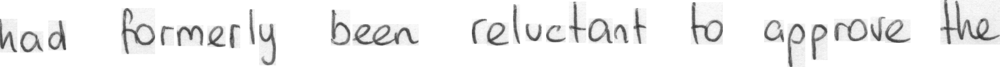

 45%|████▌     | 136/301 [00:20<00:23,  7.01it/s]

Label: had formerly been reluctant to approve the
Prediction:  had formerly been reluctant to approve the
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037k/g06-037k-s02-00.png


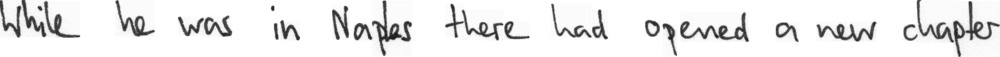

 46%|████▌     | 137/301 [00:20<00:23,  6.96it/s]

Label: While he was in Naples there had opened a new chapter
Prediction:  While he was in Nafes there had oyened a new chapter
CER: 0.05660377358490566; WER: 0.18181818181818182
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011l/g06-011l-s01-00.png


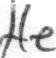

 46%|████▌     | 138/301 [00:20<00:23,  6.96it/s]

Label: He
Prediction:  te
CER: 0.5; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050p/g06-050p-s02-04.png


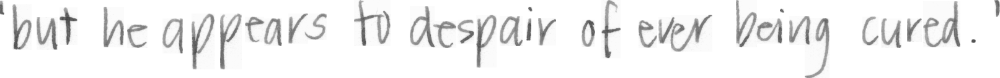

 46%|████▌     | 139/301 [00:20<00:23,  7.00it/s]

Label: ' but he appears to despair of ever being cured . '
Prediction:  ' but he appears to despair of ever being cured . '
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-063b/h07-063b-s00-01.png


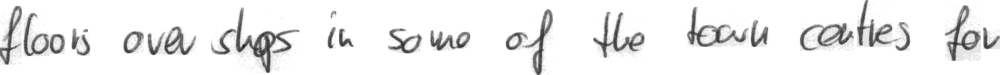

 47%|████▋     | 140/301 [00:20<00:22,  7.01it/s]

Label: floors over shops in some of the town centres for
Prediction:  floos over shpr in somo of the town coanties for
CER: 0.14285714285714285; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031n/g06-031n-s01-00.png


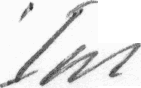

 47%|████▋     | 141/301 [00:21<00:22,  7.11it/s]

Label: ' I
Prediction:  ' Ius
CER: 0.6666666666666666; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g07/g07-003b/g07-003b-s01-01.png


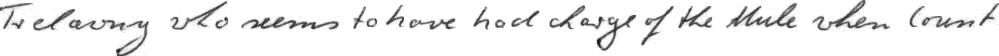

 47%|████▋     | 142/301 [00:21<00:22,  7.07it/s]

Label: Trelawny who seems to have had charge of the Mule when Count
Prediction:  Trelauny who sems to have had dange f the thile when bunt
CER: 0.18333333333333332; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037k/g06-037k-s02-02.png


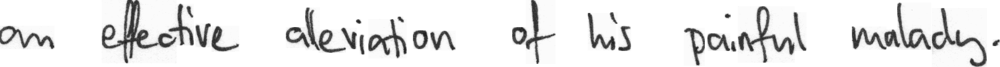

 48%|████▊     | 143/301 [00:21<00:22,  7.09it/s]

Label: an effective alleviation of his painful malady .
Prediction:  an effective aleviation of his painful malady .
CER: 0.020833333333333332; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050g/g06-050g-s01-00.png


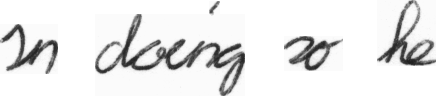

 48%|████▊     | 144/301 [00:21<00:21,  7.16it/s]

Label: In doing so he
Prediction:  In doing so he
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050o/g06-050o-s01-01.png


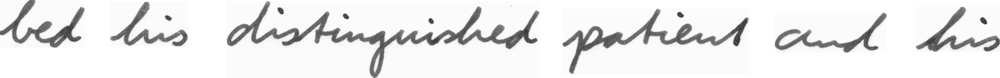

 48%|████▊     | 145/301 [00:21<00:21,  7.18it/s]

Label: bed his distinguished patient and his
Prediction:  bed his distinguished patient and his
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-087e/c03-087e-s00-00.png


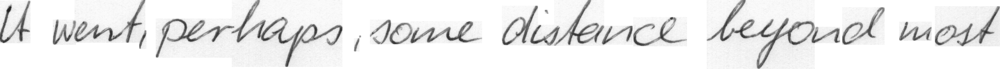

 49%|████▊     | 146/301 [00:21<00:21,  7.08it/s]

Label: It went , perhaps , some distance beyond most
Prediction:  It went , perhaps , some distence beyond most
CER: 0.022222222222222223; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/c03/c03-007c/c03-007c-s01-03.png


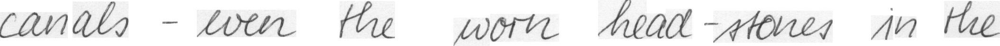

 49%|████▉     | 147/301 [00:21<00:21,  7.05it/s]

Label: canals - even the worn head-stones in the
Prediction:  canals - wen the worn head-stones in the
CER: 0.04878048780487805; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037h/g06-037h-s00-00.png


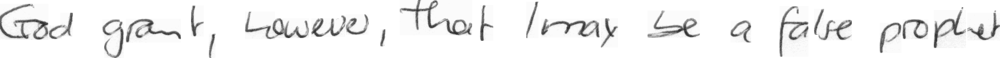

 49%|████▉     | 148/301 [00:22<00:22,  6.89it/s]

Label: God grant , however , that I may be a false prophet
Prediction:  God grant , however , that I may be a false prophet
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045a/g06-045a-s00-00.png


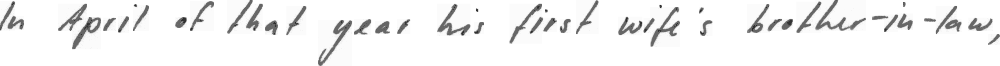

 50%|████▉     | 149/301 [00:22<00:23,  6.46it/s]

Label: In April of that year his first wife's brother-in-law ,
Prediction:  In April of that year his first wife's brotherin-law ,
CER: 0.01818181818181818; WER: 0.1
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016e/c03-016e-s03-01.png


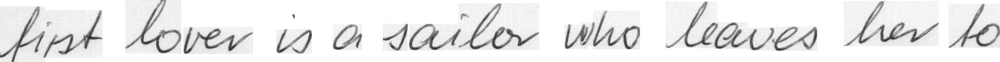

 50%|████▉     | 150/301 [00:22<00:23,  6.40it/s]

Label: first lover is a sailor who leaves her to
Prediction:  fist lover is a sailor who leaves her to
CER: 0.024390243902439025; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/a01/a01-072u/a01-072u-s00-01.png


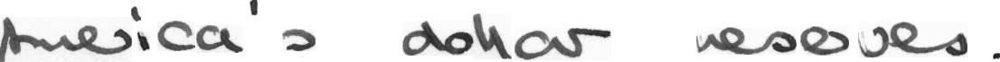

 50%|█████     | 151/301 [00:22<00:23,  6.51it/s]

Label: America's dollar reserves .
Prediction:  America's dotor reserves .
CER: 0.1111111111111111; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/f07/f07-101a/f07-101a-s00-04.png


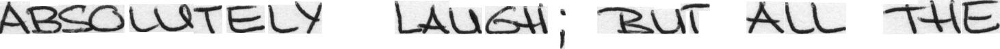

 50%|█████     | 152/301 [00:22<00:23,  6.27it/s]

Label: ABSOLUTELY LAUGH ; BUT ALL THE
Prediction:  ABSOUNTELY KAUGH ; BUT AUL THE
CER: 0.13333333333333333; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050g/g06-050g-s02-01.png


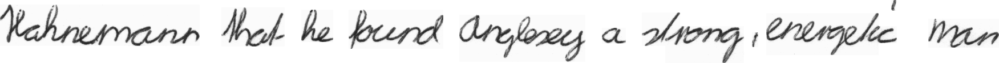

 51%|█████     | 153/301 [00:22<00:24,  5.96it/s]

Label: Hahnemann that he found Anglesey a strong , energetic man
Prediction:  Hahnemann that he found Anglesey a strong , energetic man
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047r/g06-047r-s00-03.png


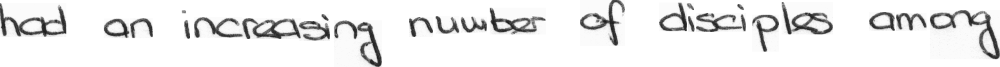

 51%|█████     | 154/301 [00:23<00:24,  6.07it/s]

Label: had an increasing number of disciples among
Prediction:  had an increasing number of disciples among
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-007a/g07-007a-s01-05.png


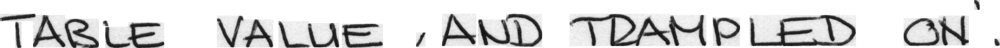

 51%|█████▏    | 155/301 [00:23<00:23,  6.16it/s]

Label: TABLE VALUE , AND TRAMPLED ON ' .
Prediction:  TABLE VALUE , AND TRAMDLED ON' 
CER: 0.09090909090909091; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/f07/f07-019b/f07-019b-s00-02.png


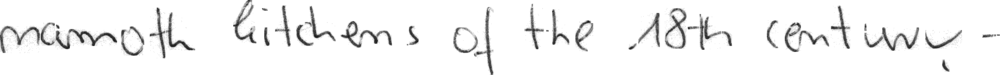

 52%|█████▏    | 156/301 [00:23<00:23,  6.07it/s]

Label: mammoth kitchens of the 18th century -
Prediction:  mamoth litchens of the 18th century -
CER: 0.05263157894736842; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031b/g06-031b-s00-00.png


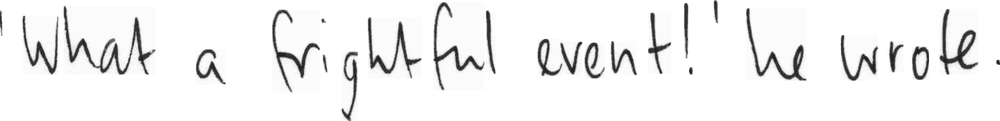

 52%|█████▏    | 157/301 [00:23<00:23,  6.03it/s]

Label: ' What a frightful event ! ' he wrote .
Prediction:  ' What a frightful event ! ' he wrote .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-082u/a01-082u-s01-02.png


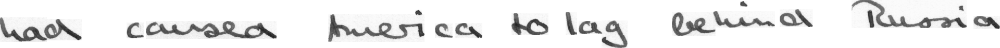

 52%|█████▏    | 158/301 [00:23<00:23,  6.03it/s]

Label: had caused America to lag behind Russia
Prediction:  had consea America to lag behind Russia
CER: 0.07692307692307693; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g07/g07-007a/g07-007a-s01-03.png


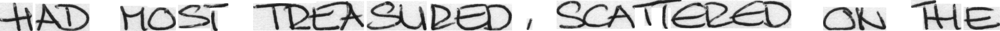

 53%|█████▎    | 159/301 [00:23<00:23,  5.94it/s]

Label: HAD MOST TREASURED , SCATTERED ON THE
Prediction:  HAD MOST TREASURED , SCATTERED ON THE
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-021a/f07-021a-s01-04.png


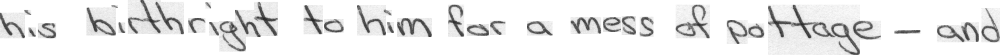

 53%|█████▎    | 160/301 [00:24<00:24,  5.78it/s]

Label: his birthright to him for a mess of pottage - and
Prediction:  his birthright to him for a mess of pottage - and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-000c/c03-000c-s01-00.png


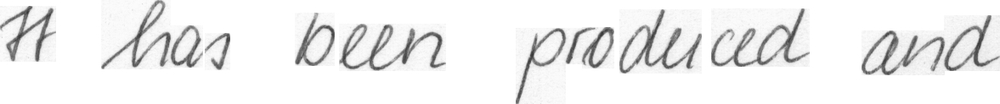

 53%|█████▎    | 161/301 [00:24<00:24,  5.75it/s]

Label: It has been produced and
Prediction:  It has been produced and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-021b/f07-021b-s01-00.png


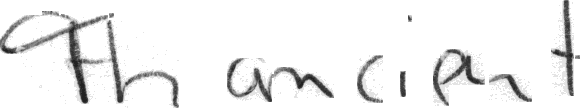

 54%|█████▍    | 162/301 [00:24<00:24,  5.72it/s]

Label: The ancient
Prediction:  th anciont
CER: 0.2727272727272727; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011k/g06-011k-s03-00.png


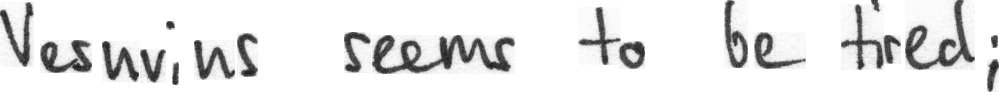

 54%|█████▍    | 163/301 [00:24<00:23,  5.76it/s]

Label: Vesuvius seems to be tired ;
Prediction:  Vesuvius seems to be tired ;
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-026x/a01-026x-s02-03.png


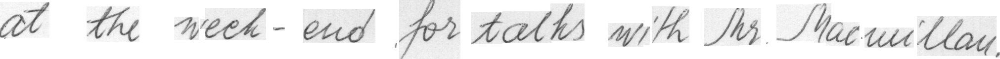

 54%|█████▍    | 164/301 [00:24<00:23,  5.82it/s]

Label: at the week-end for talks with Mr. Macmillan .
Prediction:  ad the week-end for talks with Mr. hacmuillow .
CER: 0.10869565217391304; WER: 0.2222222222222222
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037k/g06-037k-s03-04.png


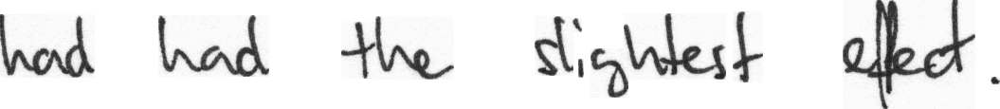

 55%|█████▍    | 165/301 [00:24<00:23,  5.69it/s]

Label: had had the slightest effect .
Prediction:  had had the slightest effect .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-000a/g07-000a-s00-02.png


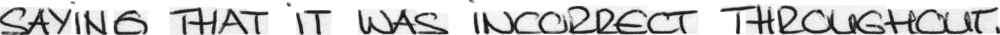

 55%|█████▌    | 166/301 [00:25<00:23,  5.74it/s]

Label: SAYING THAT IT WAS INCORRECT THROUGHOUT .
Prediction:  SHING THAT IT WAS INCORRECT THROUSHOUT S
CER: 0.0975609756097561; WER: 0.42857142857142855
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031o/g06-031o-s04-07.png


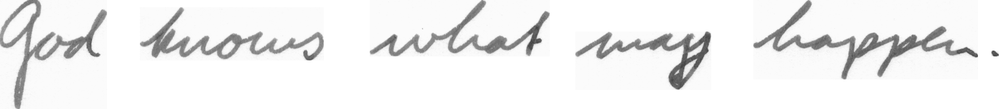

 55%|█████▌    | 167/301 [00:25<00:22,  5.84it/s]

Label: God knows what may happen ... .
Prediction:  God kuows what may happen .
CER: 0.16129032258064516; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/f07/f07-076a/f07-076a-s02-00.png


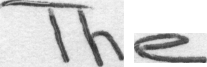

 56%|█████▌    | 168/301 [00:25<00:22,  5.82it/s]

Label: The
Prediction:  The
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045h/g06-045h-s00-06.png


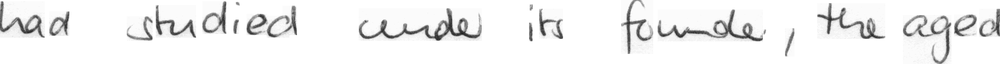

 56%|█████▌    | 169/301 [00:25<00:22,  5.86it/s]

Label: had studied under its founder , the aged
Prediction:  had studied under its founde , the aged
CER: 0.025; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042c/g06-042c-s01-00.png


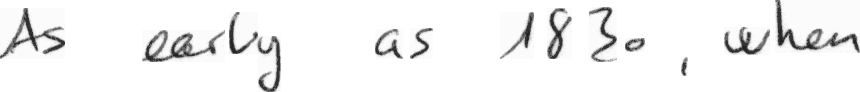

 56%|█████▋    | 170/301 [00:25<00:22,  5.88it/s]

Label: As early as 1830 , when
Prediction:  As early as 1830 , when
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-049u/a01-049u-s00-02.png


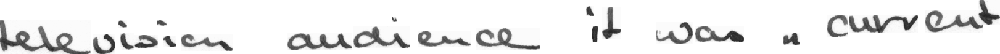

 57%|█████▋    | 171/301 [00:25<00:22,  5.83it/s]

Label: television audience it was " current
Prediction:  television audience it was " current
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-096u/a01-096u-s04-01.png


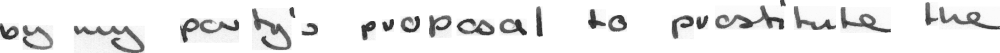

 57%|█████▋    | 172/301 [00:26<00:22,  5.78it/s]

Label: by my party's proposal to prostitute the
Prediction:  by my parly's propooal to prostitute the
CER: 0.05; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011i/g06-011i-s00-00.png


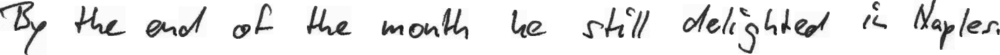

 57%|█████▋    | 173/301 [00:26<00:22,  5.81it/s]

Label: By the end of the month he still delighted in Naples .
Prediction:  By the end of the month he still delighted in Naples
CER: 0.037037037037037035; WER: 0.08333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011n/g06-011n-s01-00.png


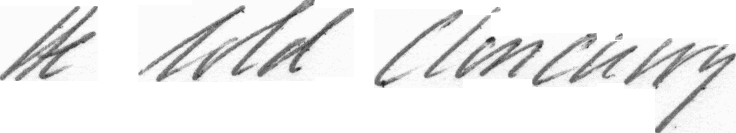

 58%|█████▊    | 174/301 [00:26<00:21,  5.84it/s]

Label: He told Cloncurry
Prediction:  He told Cloncurry
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011j/g06-011j-s00-01.png


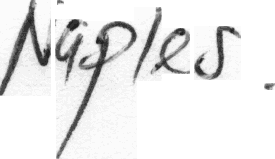

 58%|█████▊    | 175/301 [00:26<00:21,  5.90it/s]

Label: Naples .
Prediction:  Naples .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026b/g06-026b-s00-00.png


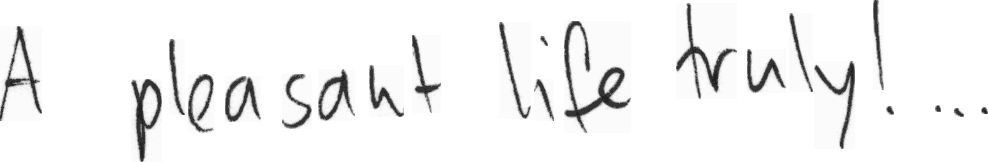

 58%|█████▊    | 176/301 [00:26<00:20,  6.13it/s]

Label: A pleasant life truly ! ...
Prediction:  A pleasant life truly ! ...
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-057a/h07-057a-s01-00.png


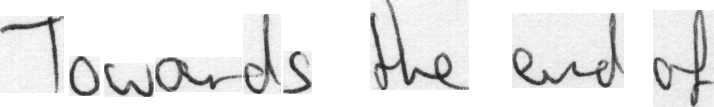

 59%|█████▉    | 177/301 [00:26<00:19,  6.43it/s]

Label: Towards the end of
Prediction:  Towards the end of
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094c/c03-094c-s00-04.png


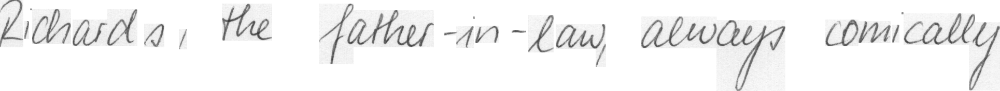

 59%|█████▉    | 178/301 [00:27<00:18,  6.60it/s]

Label: Richards , the father-in-law , always comically
Prediction:  Richards , the father-in-law aeways comically
CER: 0.06382978723404255; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/a01/a01-063u/a01-063u-s02-00.png


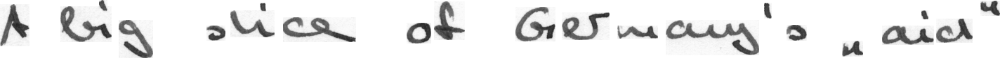

 59%|█████▉    | 179/301 [00:27<00:18,  6.68it/s]

Label: A big slice of Germany's " aid "
Prediction:  A big slice of Grermany's " aid"
CER: 0.0625; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/h07/h07-066b/h07-066b-s01-04.png


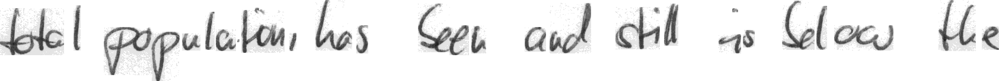

 60%|█████▉    | 180/301 [00:27<00:17,  6.82it/s]

Label: total population , has been and still is below the
Prediction:  total populatin , has been and stil' is belows the
CER: 0.06; WER: 0.3
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045l/g06-045l-s00-00.png


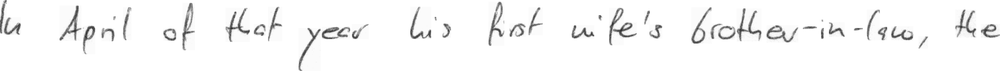

 60%|██████    | 181/301 [00:27<00:17,  6.85it/s]

Label: In April of that year his first wife's brother-in-law , the
Prediction:  In April of that year his frot wife's brotherin-law , the
CER: 0.05084745762711865; WER: 0.18181818181818182
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045k/g06-045k-s00-05.png


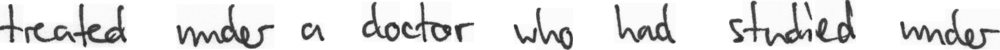

 60%|██████    | 182/301 [00:27<00:17,  6.94it/s]

Label: treated under a doctor who had studied under
Prediction:  treated under a doctor who had studied under
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-081e/c03-081e-s01-00.png


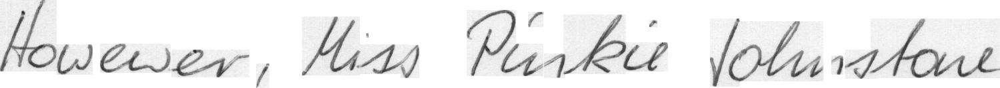

 61%|██████    | 183/301 [00:27<00:17,  6.90it/s]

Label: However , Miss Pinkie Johnstone
Prediction:  Howewer , Miss Piubie Jokmstone
CER: 0.16129032258064516; WER: 0.6
Image:  Datasets/IAM_Sentences/sentences/a01/a01-030u/a01-030u-s06-00.png


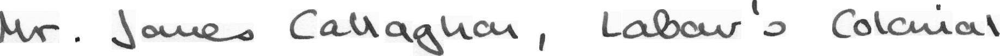

 61%|██████    | 184/301 [00:27<00:17,  6.80it/s]

Label: Mr. James Callaghan , Labour's Colonial
Prediction:  Mr. Jomes Callaghan , Labour's Colonial
CER: 0.02564102564102564; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/c03/c03-084d/c03-084d-s00-02.png


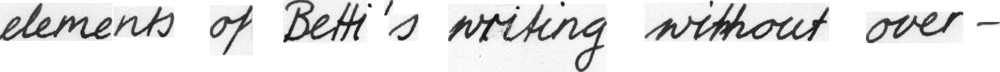

 61%|██████▏   | 185/301 [00:28<00:16,  6.84it/s]

Label: elements of Betti's writing without over-
Prediction:  elements of Bett's writing without over-
CER: 0.024390243902439025; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094d/c03-094d-s00-01.png


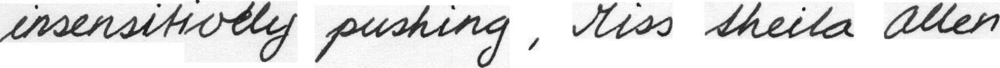

 62%|██████▏   | 186/301 [00:28<00:16,  6.88it/s]

Label: insensitively pushing , Miss Sheila Allen
Prediction:  insensitively pushing , Miss Sheila Allen
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037g/g06-037g-s02-01.png


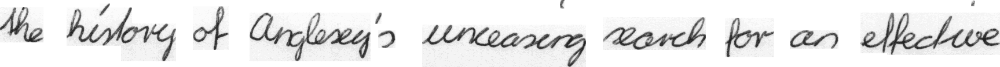

 62%|██████▏   | 187/301 [00:28<00:16,  6.89it/s]

Label: the history of Anglesey's unceasing search for an effective
Prediction:  the history of Anglesey's unceasing search for an effective
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050e/g06-050e-s02-04.png


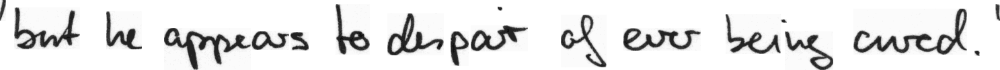

 62%|██████▏   | 188/301 [00:28<00:16,  6.94it/s]

Label: ' but he appears to despair of ever being cured . '
Prediction:  ' but he appears to depair of ever being cured . '
CER: 0.0196078431372549; WER: 0.08333333333333333
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094f/c03-094f-s00-07.png


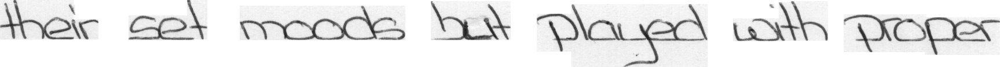

 63%|██████▎   | 189/301 [00:28<00:16,  6.90it/s]

Label: their set moods but played with proper
Prediction:  their set moods but played with proper
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-038x/a01-038x-s01-01.png


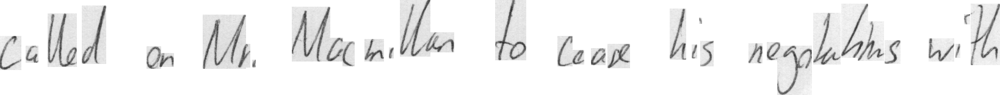

 63%|██████▎   | 190/301 [00:28<00:15,  6.94it/s]

Label: called on Mr. Macmillan to cease his negotiations with
Prediction:  cated an Mr. Nacmulter to ceare his negahtis with
CER: 0.2777777777777778; WER: 0.5555555555555556
Image:  Datasets/IAM_Sentences/sentences/a01/a01-049u/a01-049u-s00-04.png


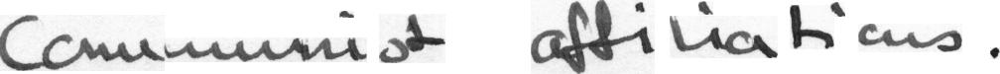

 63%|██████▎   | 191/301 [00:28<00:15,  6.91it/s]

Label: Communist affiliations .
Prediction:  Commmist affiliations .
CER: 0.08333333333333333; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011k/g06-011k-s05-01.png


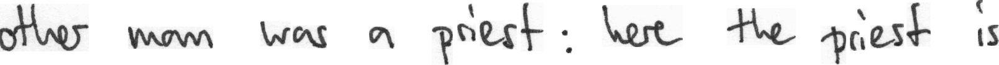

 64%|██████▍   | 192/301 [00:29<00:15,  6.96it/s]

Label: other man was a priest : here the priest is
Prediction:  other man was a priest : here the piest is
CER: 0.023255813953488372; WER: 0.1
Image:  Datasets/IAM_Sentences/sentences/f07/f07-088a/f07-088a-s00-01.png


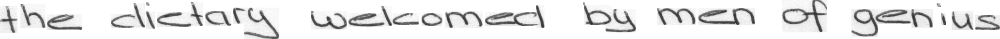

 64%|██████▍   | 193/301 [00:29<00:15,  6.97it/s]

Label: the dietary welcomed by men of genius
Prediction:  the dietary welcomed by men of genius
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037j/g06-037j-s01-01.png


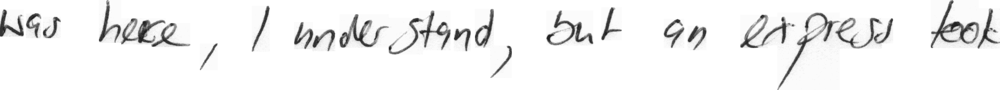

 64%|██████▍   | 194/301 [00:29<00:15,  7.02it/s]

Label: was here , I understand , but an express took
Prediction:  was hece , I maderstand , but an express teot
CER: 0.1111111111111111; WER: 0.3
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031m/g06-031m-s04-06.png


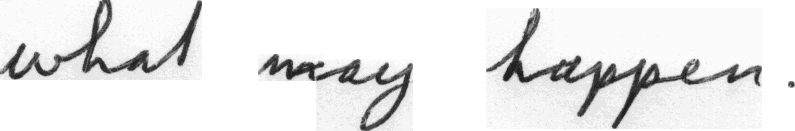

 65%|██████▍   | 195/301 [00:29<00:15,  7.06it/s]

Label: what may happen ... .
Prediction:  what may happen .
CER: 0.19047619047619047; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/a01/a01-087u/a01-087u-s01-01.png


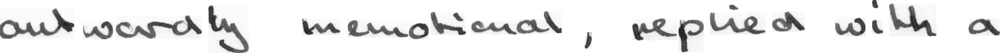

 65%|██████▌   | 196/301 [00:29<00:14,  7.06it/s]

Label: outwardly unemotional , replied with a
Prediction:  outwardly memotional , replied with a
CER: 0.05263157894736842; WER: 0.16666666666666666
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050p/g06-050p-s02-02.png


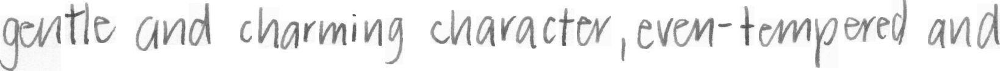

 65%|██████▌   | 197/301 [00:29<00:14,  7.08it/s]

Label: gentle and charming character , even-tempered and
Prediction:  gentle and charming character , even-tempered and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-026x/a01-026x-s01-03.png


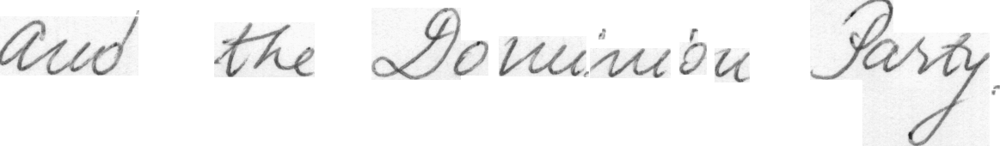

 66%|██████▌   | 198/301 [00:29<00:14,  7.04it/s]

Label: and the Dominion Party .
Prediction:  and the CDominion Parey .
CER: 0.08333333333333333; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026a/g06-026a-s03-03.png


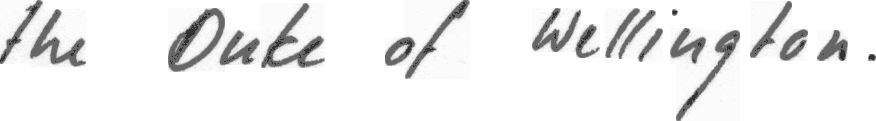

 66%|██████▌   | 199/301 [00:30<00:14,  7.10it/s]

Label: the Duke of Wellington .
Prediction:  the Duke of Wellington .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026m/g06-026m-s03-01.png


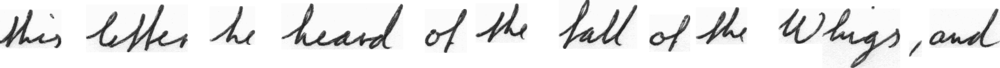

 66%|██████▋   | 200/301 [00:30<00:14,  7.05it/s]

Label: this letter he heard of the fall of the Whigs , and
Prediction:  this letter he heard of the fall of the Whigs , and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042h/g06-042h-s01-00.png


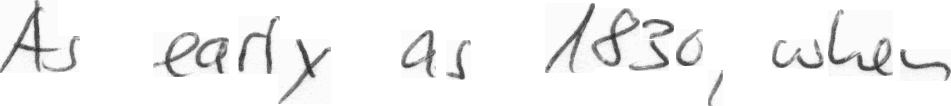

 67%|██████▋   | 201/301 [00:30<00:13,  7.16it/s]

Label: As early as 1830 , when
Prediction:  As early as 1830 , when
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-092a/f07-092a-s01-01.png


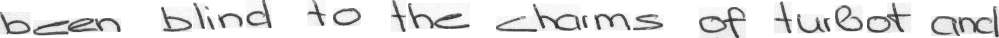

 67%|██████▋   | 202/301 [00:30<00:13,  7.13it/s]

Label: been blind to the charms of turbot and
Prediction:  been blind to the charms of turbot and
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042m/g06-042m-s01-04.png


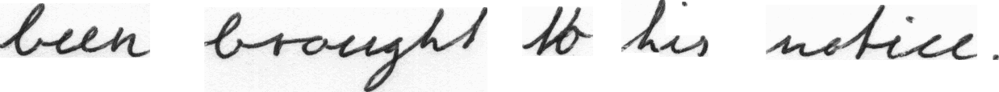

 67%|██████▋   | 203/301 [00:30<00:13,  7.06it/s]

Label: been brought to his notice .
Prediction:  been brought to his notice .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037f/g06-037f-s02-01.png


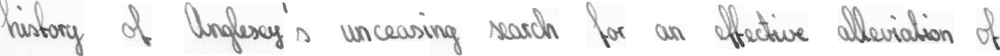

 68%|██████▊   | 204/301 [00:30<00:13,  7.00it/s]

Label: history of Anglesey's unceasing search for an effective alleviation of
Prediction:  history of Anglesey's unceasing search for an offedive alleiation of
CER: 0.05714285714285714; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/h07/h07-037a/h07-037a-s00-02.png


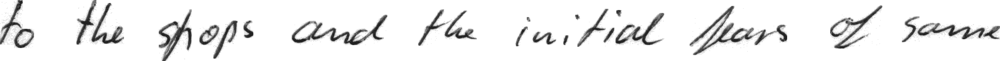

 68%|██████▊   | 205/301 [00:30<00:13,  6.91it/s]

Label: to the shops and the initial fears of some
Prediction:  to the shops and the initial fears of same
CER: 0.023809523809523808; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016c/c03-016c-s03-01.png


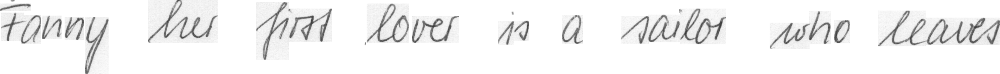

 68%|██████▊   | 206/301 [00:31<00:13,  6.96it/s]

Label: Fanny her first lover is a sailor who leaves
Prediction:  Fanny her first lover is a sailor who leaves
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050g/g06-050g-s02-02.png


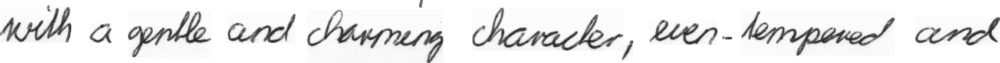

 69%|██████▉   | 207/301 [00:31<00:13,  6.95it/s]

Label: with a gentle and charming character , even-tempered and
Prediction:  with a gentle and charming character , even-tempened and
CER: 0.017857142857142856; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g07/g07-028b/g07-028b-s00-04.png


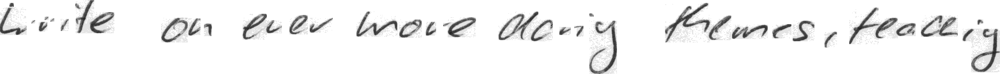

 69%|██████▉   | 208/301 [00:31<00:13,  7.01it/s]

Label: write on ever more daring themes , teaching
Prediction:  wvite on ever move dorig themes , teaceing
CER: 0.11627906976744186; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/a01/a01-091u/a01-091u-s02-01.png


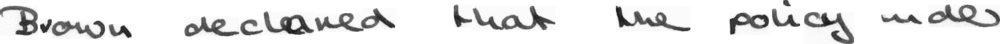

 69%|██████▉   | 209/301 [00:31<00:13,  6.97it/s]

Label: Brown declared that the policy under
Prediction:  Brown declared that the policy under
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-072x/a01-072x-s03-03.png


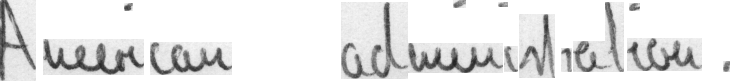

 70%|██████▉   | 210/301 [00:31<00:13,  6.99it/s]

Label: American administration .
Prediction:  Aurcan cdumiiatretion .
CER: 0.32; WER: 0.6666666666666666
Image:  Datasets/IAM_Sentences/sentences/a01/a01-043x/a01-043x-s02-00.png


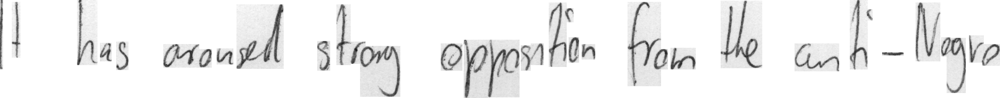

 70%|███████   | 211/301 [00:31<00:12,  6.94it/s]

Label: It has aroused strong opposition from the anti-Negro
Prediction:  II has anoued stoy opontin fon te anstillayro
CER: 0.34615384615384615; WER: 0.875
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011p/g06-011p-s03-00.png


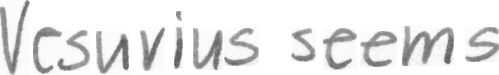

 70%|███████   | 212/301 [00:31<00:12,  7.05it/s]

Label: Vesuvius seems
Prediction:  Vesuvius seems
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-066a/h07-066a-s01-00.png


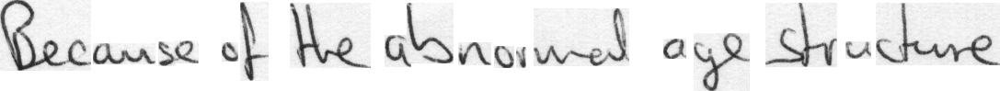

 71%|███████   | 213/301 [00:32<00:12,  6.92it/s]

Label: Because of the abnormal age structure
Prediction:  Becanse of the abnomad age structure
CER: 0.08108108108108109; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/a01/a01-014u/a01-014u-s00-01.png


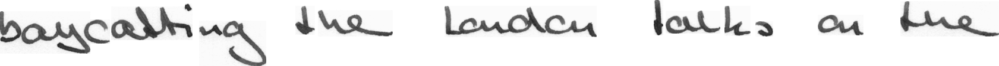

 71%|███████   | 214/301 [00:32<00:12,  6.80it/s]

Label: boycotting the London talks on the
Prediction:  baycatting the London touks on the
CER: 0.11764705882352941; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037k/g06-037k-s01-01.png


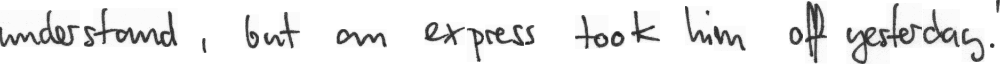

 71%|███████▏  | 215/301 [00:32<00:12,  6.89it/s]

Label: understand , but an express took him off yesterday . '
Prediction:  understand , but an express took him off yesterday .
CER: 0.037037037037037035; WER: 0.09090909090909091
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031d/g06-031d-s04-04.png


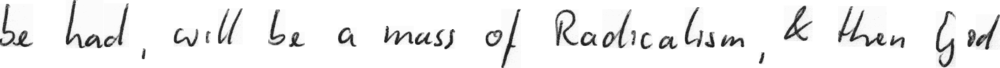

 72%|███████▏  | 216/301 [00:32<00:12,  6.92it/s]

Label: be had , will be a mass of Radicalism , & then God
Prediction:  be had , will be a mass of Radicalism , & then God
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-087f/c03-087f-s01-01.png


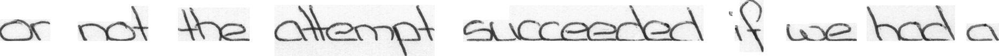

 72%|███████▏  | 217/301 [00:32<00:12,  6.78it/s]

Label: or not the attempt succeeded if we had a
Prediction:  or not the attempt succeeded if we had a
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-060a/h07-060a-s01-00.png


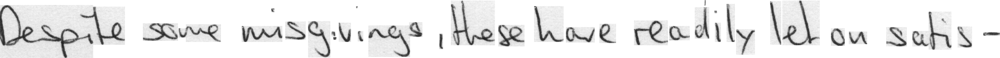

 72%|███████▏  | 218/301 [00:32<00:12,  6.83it/s]

Label: Despite some misgivings , these have readily let on satis-
Prediction:  Gespite some misguings , these have readily let on satis -
CER: 0.06896551724137931; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042b/g06-042b-s00-00.png


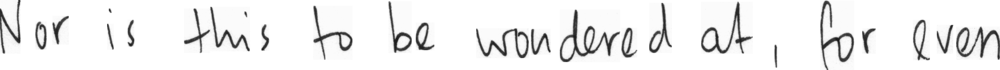

 73%|███████▎  | 219/301 [00:32<00:11,  6.89it/s]

Label: Nor is this to be wondered at , for even
Prediction:  Nor is this to be wondered at , for even
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-128u/a01-128u-s02-04.png


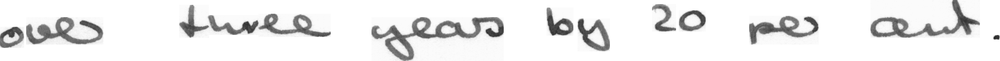

 73%|███████▎  | 220/301 [00:33<00:11,  7.01it/s]

Label: over three years by 20 per cent.
Prediction:  over three years by 20 per cent.
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-081b/f07-081b-s01-03.png


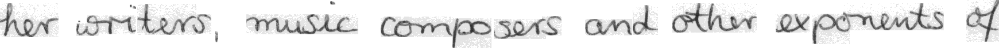

 73%|███████▎  | 221/301 [00:33<00:11,  6.81it/s]

Label: her writers , music composers and other exponents of
Prediction:  her writers , music composers and other exponents of
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-051b/h07-051b-s00-01.png


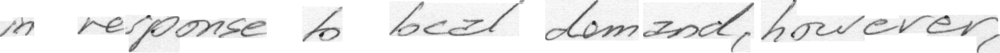

 74%|███████▍  | 222/301 [00:33<00:12,  6.53it/s]

Label: in response to local demand , however ,
Prediction:  n respponse to bcal domand , howevrer ,
CER: 0.15384615384615385; WER: 0.625
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011o/g06-011o-s00-00.png


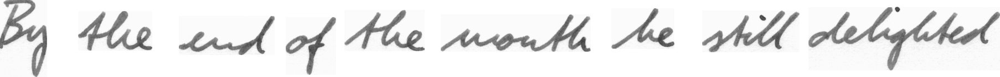

 74%|███████▍  | 223/301 [00:33<00:12,  6.49it/s]

Label: By the end of the month he still delighted
Prediction:  By the end of the month he still delighted
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-091u/a01-091u-s03-01.png


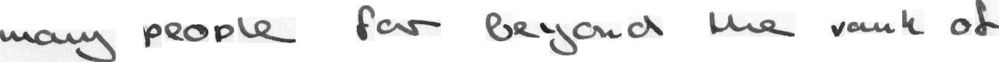

 74%|███████▍  | 224/301 [00:33<00:12,  6.26it/s]

Label: many people far beyond the ranks of
Prediction:  may people far beyond the rouk of
CER: 0.11428571428571428; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018j/g06-018j-s02-02.png


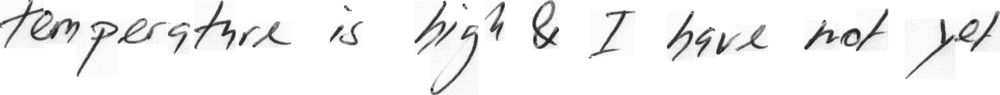

 75%|███████▍  | 225/301 [00:33<00:13,  5.81it/s]

Label: temperature is high & I have not yet
Prediction:  temperature is high be I have not yet
CER: 0.05555555555555555; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042c/g06-042c-s01-03.png


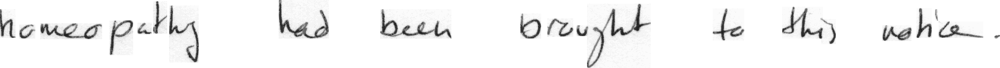

 75%|███████▌  | 226/301 [00:34<00:12,  5.78it/s]

Label: homoeopathy had been brought to his notice .
Prediction:  homeopathy had been brought to this notice .
CER: 0.045454545454545456; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016e/c03-016e-s01-00.png


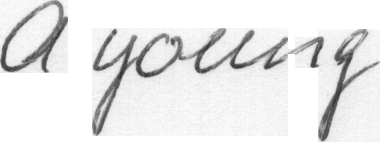

 75%|███████▌  | 227/301 [00:34<00:12,  5.86it/s]

Label: A young
Prediction:  A young
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-096f/c03-096f-s02-00.png


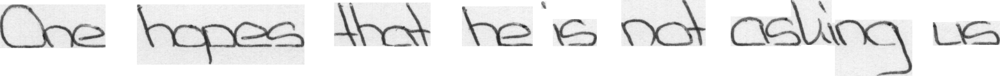

 76%|███████▌  | 228/301 [00:34<00:12,  5.90it/s]

Label: One hopes that he is not asking us
Prediction:  Ohe hopes that heis not asking us
CER: 0.058823529411764705; WER: 0.375
Image:  Datasets/IAM_Sentences/sentences/g06/g06-037c/g06-037c-s01-02.png


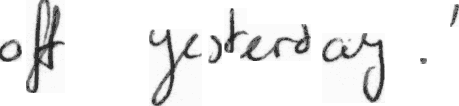

 76%|███████▌  | 229/301 [00:34<00:11,  6.01it/s]

Label: off yesterday . '
Prediction:  off yesterdary . '
CER: 0.058823529411764705; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050f/g06-050f-s00-00.png


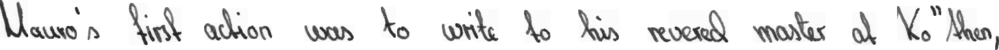

 76%|███████▋  | 230/301 [00:34<00:11,  6.00it/s]

Label: Mauro's first action was to write to his revered master at Ko"then ,
Prediction:  Mauro's first adtion was to write to his reverd manter at No"thern
CER: 0.10294117647058823; WER: 0.38461538461538464
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045r/g06-045r-s00-05.png


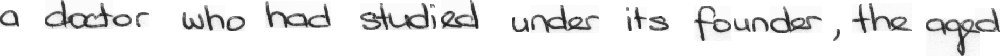

 77%|███████▋  | 231/301 [00:34<00:11,  5.86it/s]

Label: a doctor who had studied under its founder , the aged
Prediction:  a doctor who had studied under its founder , the aged
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045k/g06-045k-s00-03.png


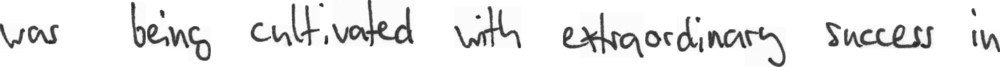

 77%|███████▋  | 232/301 [00:35<00:11,  5.93it/s]

Label: was being cultivated with extraordinary success in
Prediction:  was being cultivated with extraordinary sucess in
CER: 0.02; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/c03/c03-096d/c03-096d-s00-01.png


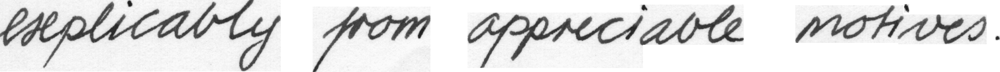

 77%|███████▋  | 233/301 [00:35<00:11,  5.97it/s]

Label: explicably from appreciable motives .
Prediction:  eplicably from appreciable motives .
CER: 0.02702702702702703; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g07/g07-026a/g07-026a-s00-08.png


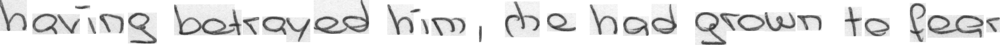

 78%|███████▊  | 234/301 [00:35<00:11,  6.02it/s]

Label: having betrayed him , she had grown to fear
Prediction:  having betrayed him , she had grown to fear
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/f07/f07-081a/f07-081a-s00-03.png


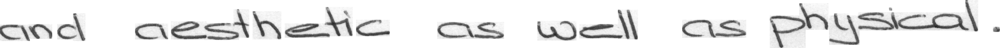

 78%|███████▊  | 235/301 [00:35<00:10,  6.03it/s]

Label: and aesthetic as well as physical .
Prediction:  and aesthetic as well as physical .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050j/g06-050j-s02-05.png


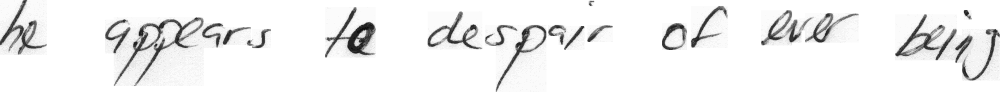

 78%|███████▊  | 236/301 [00:35<00:10,  6.07it/s]

Label: he appears to despair of ever being
Prediction:  he appears te despair of ever being
CER: 0.02857142857142857; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042a/g06-042a-s01-03.png


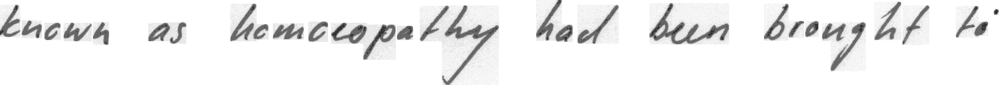

 79%|███████▊  | 237/301 [00:35<00:10,  5.99it/s]

Label: known as homoeopathy had been brought to
Prediction:  known as homoeopathy had been brought to
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-081e/c03-081e-s00-02.png


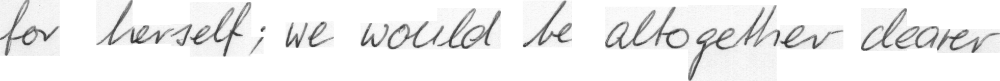

 79%|███████▉  | 238/301 [00:36<00:11,  5.56it/s]

Label: for herself ; we would be altogether clearer
Prediction:  for herself ; we would be altogether dearer
CER: 0.045454545454545456; WER: 0.125
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018c/g06-018c-s01-02.png


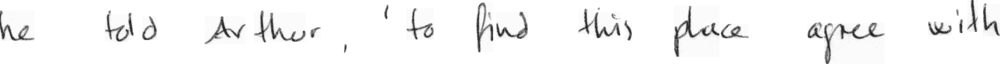

 79%|███████▉  | 239/301 [00:36<00:11,  5.55it/s]

Label: he told Arthur , ' to find this place agree with
Prediction:  he told Arthur , ' to find this place agree with
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026r/g06-026r-s03-00.png


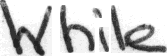

 80%|███████▉  | 240/301 [00:36<00:10,  5.67it/s]

Label: While
Prediction:  Ihite
CER: 0.4; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/g07/g07-010b/g07-010b-s02-03.png


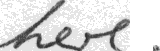

 80%|████████  | 241/301 [00:36<00:10,  5.77it/s]

Label: here .
Prediction:  here .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-031l/g06-031l-s02-00.png


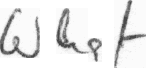

 80%|████████  | 242/301 [00:36<00:09,  5.97it/s]

Label: What
Prediction:  Whot
CER: 0.25; WER: 1.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-063b/h07-063b-s01-02.png


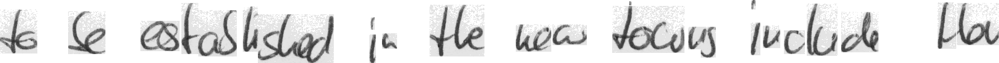

 81%|████████  | 243/301 [00:36<00:09,  6.05it/s]

Label: to be established in the new towns include Her
Prediction:  to be stablished in the new tows incude tho
CER: 0.13043478260869565; WER: 0.4444444444444444
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016d/c03-016d-s01-01.png


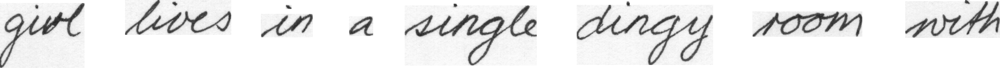

 81%|████████  | 244/301 [00:37<00:09,  5.94it/s]

Label: girl lives in a single dingy room with
Prediction:  girl lives in a single dingy room with
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-072u/a01-072u-s02-02.png


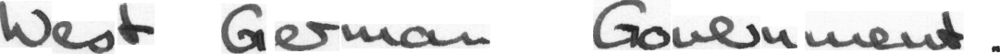

 81%|████████▏ | 245/301 [00:37<00:09,  6.07it/s]

Label: West German Government .
Prediction:  West German Government .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094d/c03-094d-s00-09.png


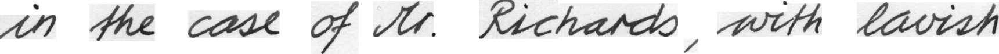

 82%|████████▏ | 246/301 [00:37<00:09,  5.96it/s]

Label: in the case of Mr. Richards , with lavish
Prediction:  in the case of Mr. Richards , with lavish
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011f/g06-011f-s01-02.png


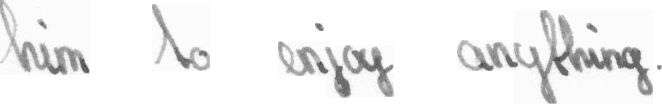

 82%|████████▏ | 247/301 [00:37<00:09,  5.99it/s]

Label: him to enjoy anything .
Prediction:  him to enjoy aneyfhing .
CER: 0.08695652173913043; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011r/g06-011r-s04-01.png


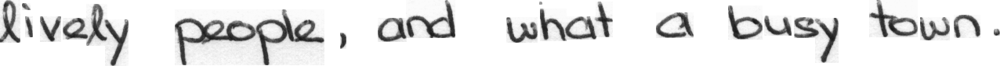

 82%|████████▏ | 248/301 [00:37<00:08,  6.10it/s]

Label: lively people , and what a busy town .
Prediction:  lively people , and what a busy town .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047h/g06-047h-s01-01.png


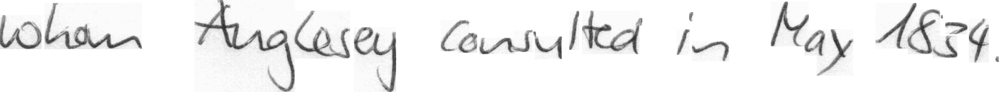

 83%|████████▎ | 249/301 [00:37<00:08,  6.01it/s]

Label: whom Anglesey consulted in May 1834 .
Prediction:  whan Anglesey consulted in May 1834 .
CER: 0.05405405405405406; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011k/g06-011k-s01-01.png


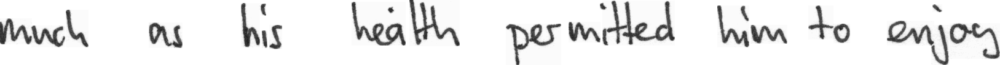

 83%|████████▎ | 250/301 [00:38<00:08,  6.19it/s]

Label: much as his health permitted him to enjoy
Prediction:  much as his health permitted him to enjoy
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-007e/c03-007e-s01-03.png


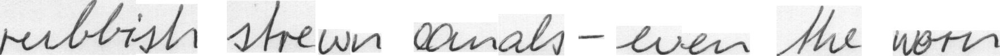

 83%|████████▎ | 251/301 [00:38<00:07,  6.30it/s]

Label: rubbish strewn canals - even the worn
Prediction:  rubbish strewn canals- even the worn
CER: 0.02702702702702703; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045a/g06-045a-s00-07.png


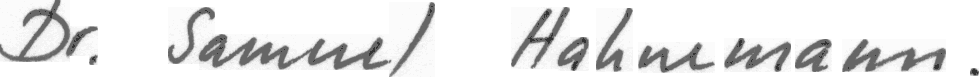

 84%|████████▎ | 252/301 [00:38<00:07,  6.27it/s]

Label: Dr. Samuel Hahnemann .
Prediction:  Dr. Samuel Hahnemann .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094e/c03-094e-s00-09.png


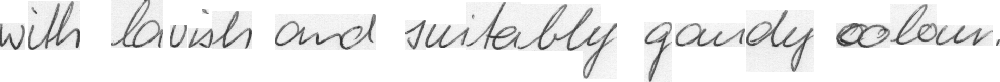

 84%|████████▍ | 253/301 [00:38<00:07,  6.37it/s]

Label: with lavish and suitably gaudy colour .
Prediction:  with lavish and suitably gandy colour .
CER: 0.02564102564102564; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/c03/c03-003b/c03-003b-s01-00.png


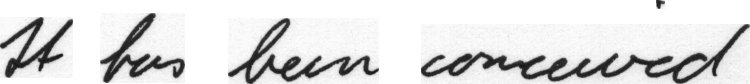

 84%|████████▍ | 254/301 [00:38<00:07,  6.41it/s]

Label: It has been conceived
Prediction:  It has he coneeiedt
CER: 0.2857142857142857; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/f07/f07-042a/f07-042a-s01-02.png


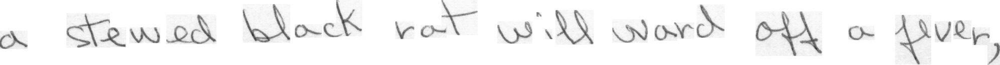

 85%|████████▍ | 255/301 [00:38<00:07,  6.44it/s]

Label: a stewed black rat will ward off a fever .
Prediction:  a stewed black rot will ward off a fever ,
CER: 0.047619047619047616; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/f07/f07-092b/f07-092b-s02-02.png


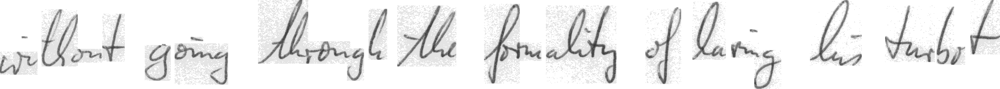

 85%|████████▌ | 256/301 [00:39<00:06,  6.53it/s]

Label: without going through the formality of having his turbot
Prediction:  sitout going through the formality of hasig his tubut
CER: 0.10714285714285714; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045m/g06-045m-s00-05.png


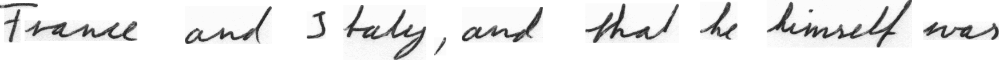

 85%|████████▌ | 257/301 [00:39<00:06,  6.38it/s]

Label: France and Italy , and that he himself was
Prediction:  France and I taly , and that he himself was
CER: 0.023809523809523808; WER: 0.2222222222222222
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018e/g06-018e-s02-01.png


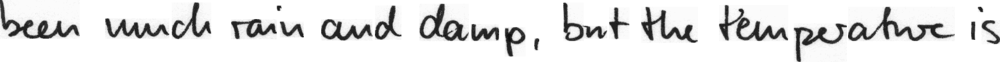

 86%|████████▌ | 258/301 [00:39<00:07,  5.99it/s]

Label: been much rain and damp , but the temperature is
Prediction:  been much rain and damp , but the temperature is
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011c/g06-011c-s05-02.png


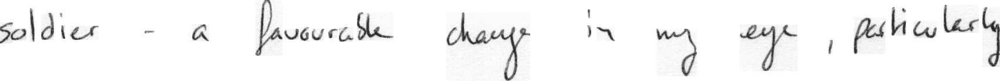

 86%|████████▌ | 259/301 [00:39<00:07,  5.90it/s]

Label: soldier - a favourable change in my eye , particularly
Prediction:  soldier - a fuvouratle chany in my eye , patively
CER: 0.18518518518518517; WER: 0.3
Image:  Datasets/IAM_Sentences/sentences/c03/c03-084d/c03-084d-s01-01.png


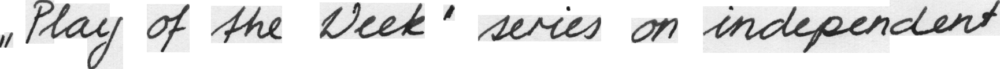

 86%|████████▋ | 260/301 [00:39<00:07,  5.71it/s]

Label: " Play of the Week " series on independent
Prediction:  " Play of the Week " series on independent
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094e/c03-094e-s00-06.png


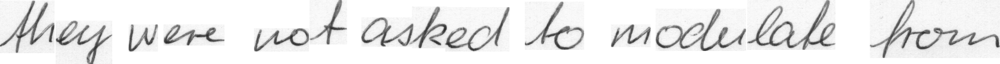

 87%|████████▋ | 261/301 [00:39<00:07,  5.64it/s]

Label: they were not asked to modulate from
Prediction:  they were not asked to modulate from
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/c03/c03-084e/c03-084e-s00-02.png


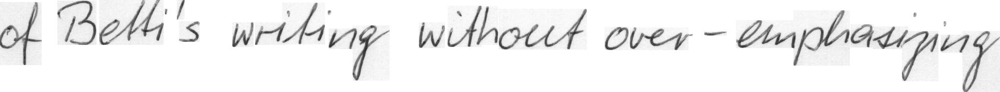

 87%|████████▋ | 262/301 [00:40<00:07,  5.55it/s]

Label: of Betti's writing without over-emphasizing
Prediction:  of Bettis writing without over-emphasiging
CER: 0.046511627906976744; WER: 0.4
Image:  Datasets/IAM_Sentences/sentences/a01/a01-068u/a01-068u-s01-01.png


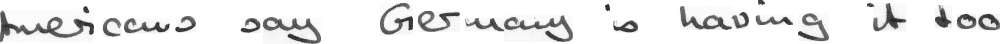

 87%|████████▋ | 263/301 [00:40<00:06,  5.58it/s]

Label: Americans say Germany is having it too
Prediction:  Americaus say Germany is having it too
CER: 0.02631578947368421; WER: 0.14285714285714285
Image:  Datasets/IAM_Sentences/sentences/h07/h07-063a/h07-063a-s00-00.png


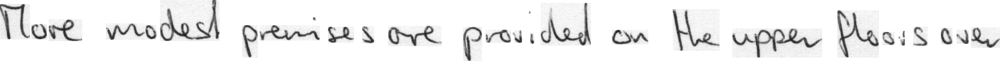

 88%|████████▊ | 264/301 [00:40<00:06,  5.63it/s]

Label: More modest premises are provided on the upper floors over
Prediction:  Tore modest premises are provided on the upper flousoven
CER: 0.08620689655172414; WER: 0.3
Image:  Datasets/IAM_Sentences/sentences/h07/h07-075a/h07-075a-s01-04.png


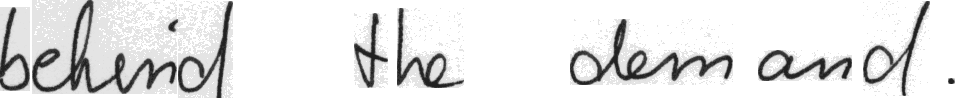

 88%|████████▊ | 265/301 [00:40<00:06,  5.69it/s]

Label: behind the demand .
Prediction:  beheint the demand .
CER: 0.10526315789473684; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011r/g06-011r-s01-00.png


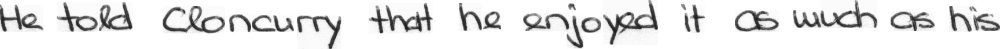

 88%|████████▊ | 266/301 [00:40<00:06,  5.69it/s]

Label: He told Cloncurry that he enjoyed it as much as his
Prediction:  He told Cloncurry that he enjoyed it as much as his
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-026u/a01-026u-s02-02.png


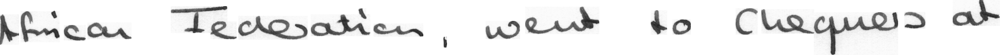

 89%|████████▊ | 267/301 [00:41<00:06,  5.51it/s]

Label: African Federation , went to Chequers at
Prediction:  African Federation , went to Chequers at
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018n/g06-018n-s00-03.png


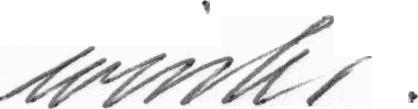

 89%|████████▉ | 268/301 [00:41<00:06,  5.48it/s]

Label: winter .
Prediction:  mnter .
CER: 0.25; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047d/g06-047d-s00-02.png


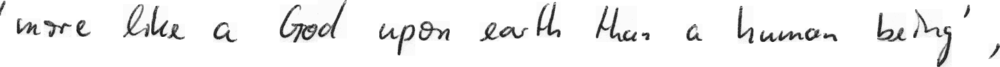

 89%|████████▉ | 269/301 [00:41<00:05,  5.50it/s]

Label: ' more like a God upon earth than a human being ' ,
Prediction:  ' mre like a God upon earth thans a human being ' ,
CER: 0.0392156862745098; WER: 0.15384615384615385
Image:  Datasets/IAM_Sentences/sentences/f07/f07-092b/f07-092b-s02-03.png


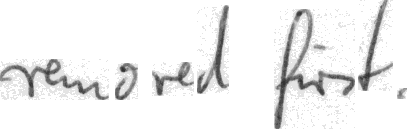

 90%|████████▉ | 270/301 [00:41<00:05,  5.67it/s]

Label: removed first .
Prediction:  remored first .
CER: 0.06666666666666667; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/a01/a01-014x/a01-014x-s00-02.png


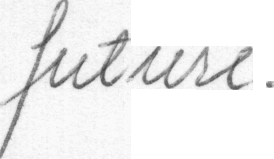

 90%|█████████ | 271/301 [00:41<00:05,  5.70it/s]

Label: future .
Prediction:  fulure .
CER: 0.125; WER: 0.5
Image:  Datasets/IAM_Sentences/sentences/a01/a01-049x/a01-049x-s02-02.png


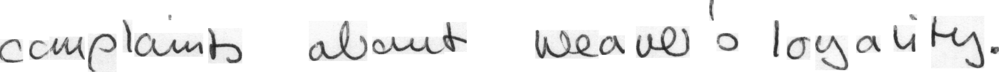

 90%|█████████ | 272/301 [00:41<00:05,  5.74it/s]

Label: complaints about Weaver's loyalty .
Prediction:  cemplaint about weaver's loyality .
CER: 0.11428571428571428; WER: 0.6
Image:  Datasets/IAM_Sentences/sentences/c03/c03-094b/c03-094b-s00-07.png


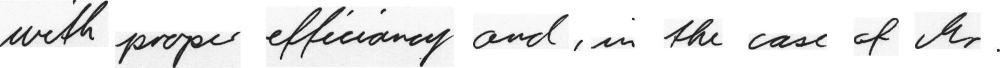

 91%|█████████ | 273/301 [00:42<00:04,  5.78it/s]

Label: with proper efficiency and , in the case of Mr.
Prediction:  with proper efficianey and , in the case of Rr.
CER: 0.06382978723404255; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g07/g07-018a/g07-018a-s01-01.png


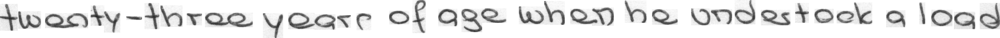

 91%|█████████ | 274/301 [00:42<00:04,  5.79it/s]

Label: twenty-three years of age when he undertook a load
Prediction:  tweaty- three years of ase when he undertook a load
CER: 0.06; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/k07/k07-067a/k07-067a-s01-01.png


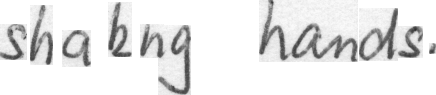

 91%|█████████▏| 275/301 [00:42<00:04,  5.76it/s]

Label: shaking hands .
Prediction:  shakng hands .
CER: 0.06666666666666667; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045i/g06-045i-s00-04.png


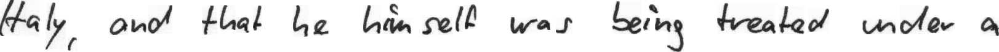

 92%|█████████▏| 276/301 [00:42<00:04,  5.77it/s]

Label: Italy , and that he himself was being treated under a
Prediction:  Italy , and that he himsell was being treated under a
CER: 0.018867924528301886; WER: 0.09090909090909091
Image:  Datasets/IAM_Sentences/sentences/c03/c03-000d/c03-000d-s01-05.png


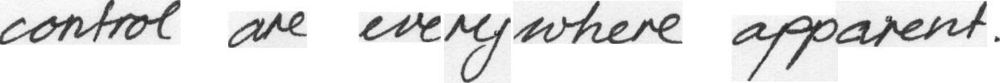

 92%|█████████▏| 277/301 [00:42<00:04,  5.95it/s]

Label: control are everywhere apparent .
Prediction:  control are everywhere apparent .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018j/g06-018j-s02-03.png


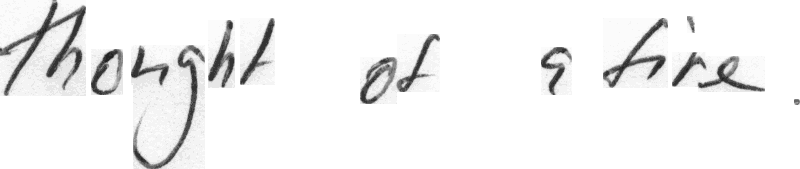

 92%|█████████▏| 278/301 [00:42<00:03,  6.15it/s]

Label: thought of a fire ... .
Prediction:  thought of a five .
CER: 0.21739130434782608; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/f07/f07-076a/f07-076a-s03-00.png


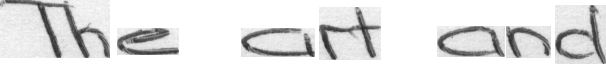

 93%|█████████▎| 279/301 [00:43<00:03,  5.95it/s]

Label: The art and
Prediction:  The ant and
CER: 0.09090909090909091; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/a01/a01-043u/a01-043u-s03-01.png


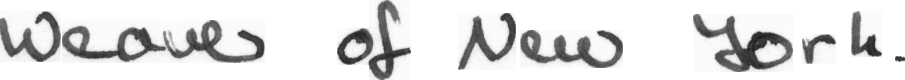

 93%|█████████▎| 280/301 [00:43<00:03,  6.04it/s]

Label: Weaver of New York .
Prediction:  Weover of New York .
CER: 0.05; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/g06/g06-026l/g06-026l-s02-00.png


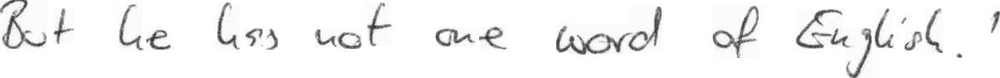

 93%|█████████▎| 281/301 [00:43<00:03,  6.24it/s]

Label: But he has not one word of English . '
Prediction:  But he has not one word of English . '
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-047l/g06-047l-s00-00.png


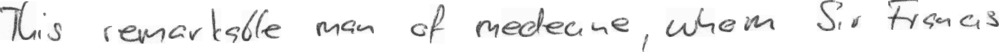

 94%|█████████▎| 282/301 [00:43<00:02,  6.45it/s]

Label: This remarkable man of medicine , whom Sir Francis
Prediction:  This remarkable man of medeane , whom Sir Franais
CER: 0.08; WER: 0.2222222222222222
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018a/g06-018a-s00-01.png


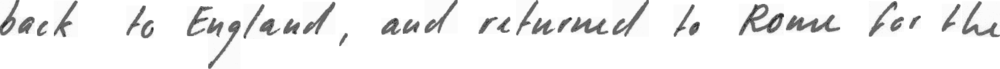

 94%|█████████▍| 283/301 [00:43<00:02,  6.54it/s]

Label: back to England , and returned to Rome for the
Prediction:  backt to England , and returned to Rome for the
CER: 0.021739130434782608; WER: 0.1
Image:  Datasets/IAM_Sentences/sentences/a01/a01-020u/a01-020u-s03-01.png


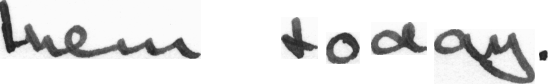

 94%|█████████▍| 284/301 [00:43<00:02,  6.72it/s]

Label: them today .
Prediction:  themn today .
CER: 0.08333333333333333; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/a01/a01-122u/a01-122u-s00-00.png


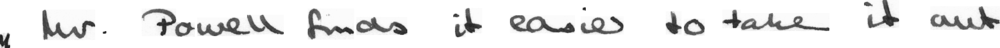

 95%|█████████▍| 285/301 [00:43<00:02,  6.74it/s]

Label: " Mr. Powell finds it easier to take it out
Prediction:  " Mr. Powell fnds it easier to take it aut
CER: 0.046511627906976744; WER: 0.2
Image:  Datasets/IAM_Sentences/sentences/c03/c03-016b/c03-016b-s03-00.png


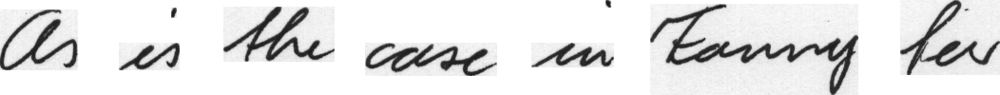

 95%|█████████▌| 286/301 [00:44<00:02,  6.82it/s]

Label: As is the case in Fanny her
Prediction:  As is the case in Fanry fer
CER: 0.07407407407407407; WER: 0.2857142857142857
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011e/g06-011e-s04-00.png


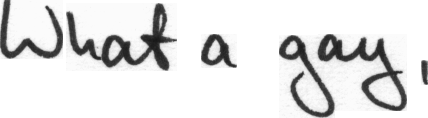

 95%|█████████▌| 287/301 [00:44<00:02,  6.91it/s]

Label: What a gay ,
Prediction:  What a gay .
CER: 0.08333333333333333; WER: 0.25
Image:  Datasets/IAM_Sentences/sentences/f07/f07-000b/f07-000b-s00-02.png


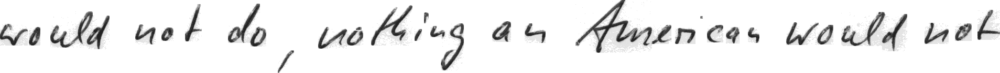

 96%|█████████▌| 288/301 [00:44<00:01,  6.93it/s]

Label: would not do ; nothing an American would not
Prediction:  crould not do , nothing an American would not
CER: 0.06818181818181818; WER: 0.2222222222222222
Image:  Datasets/IAM_Sentences/sentences/a01/a01-072x/a01-072x-s00-01.png


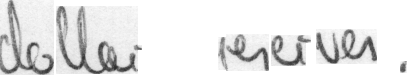

 96%|█████████▌| 289/301 [00:44<00:01,  6.98it/s]

Label: dollar reserves .
Prediction:  Holar reerven .
CER: 0.23529411764705882; WER: 0.6666666666666666
Image:  Datasets/IAM_Sentences/sentences/g06/g06-018a/g06-018a-s02-00.png


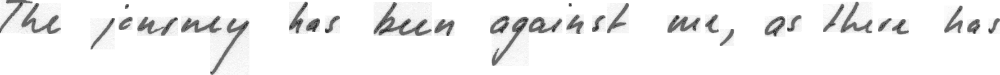

 96%|█████████▋| 290/301 [00:44<00:01,  7.03it/s]

Label: The journey has been against me , as there has
Prediction:  The journey has been against me , as there has
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-060a/h07-060a-s01-02.png


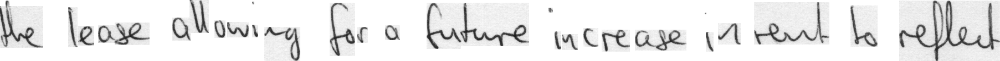

 97%|█████████▋| 291/301 [00:44<00:01,  7.05it/s]

Label: the lease allowing for a future increase in rent to reflect
Prediction:  the lease allowing for a future increase in rent to reflect
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-011o/g06-011o-s04-01.png


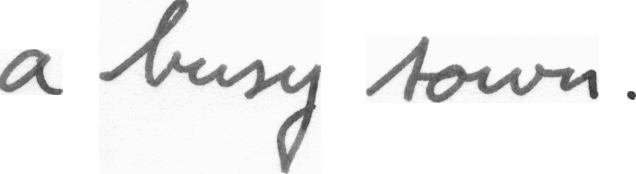

 97%|█████████▋| 292/301 [00:44<00:01,  7.01it/s]

Label: a busy town .
Prediction:  a busy town .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/a01/a01-132u/a01-132u-s01-03.png


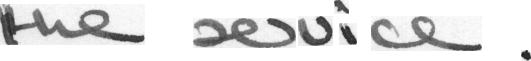

 97%|█████████▋| 293/301 [00:45<00:01,  7.06it/s]

Label: the service .
Prediction:  the service .
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-063a/h07-063a-s01-01.png


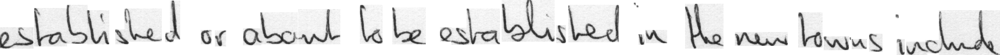

 98%|█████████▊| 294/301 [00:45<00:00,  7.05it/s]

Label: established or about to be established in the new towns include
Prediction:  established or about 6obe establisted in the new towns inchut
CER: 0.09523809523809523; WER: 0.36363636363636365
Image:  Datasets/IAM_Sentences/sentences/g07/g07-077a/g07-077a-s00-03.png


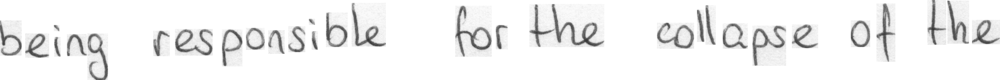

 98%|█████████▊| 295/301 [00:45<00:00,  7.05it/s]

Label: being responsible for the collapse of the
Prediction:  being responsible for the collapse of the
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/h07/h07-080a/h07-080a-s02-04.png


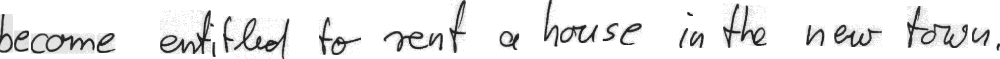

 98%|█████████▊| 296/301 [00:45<00:00,  7.06it/s]

Label: become entitled to rent a house in the new town .
Prediction:  recome entthed to rent a house in the new town .
CER: 0.061224489795918366; WER: 0.18181818181818182
Image:  Datasets/IAM_Sentences/sentences/g06/g06-045p/g06-045p-s00-04.png


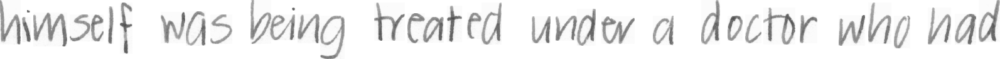

 99%|█████████▊| 297/301 [00:45<00:00,  7.09it/s]

Label: himself was being treated under a doctor who had
Prediction:  himself was being treated under d doctor who had
CER: 0.020833333333333332; WER: 0.1111111111111111
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050k/g06-050k-s02-05.png


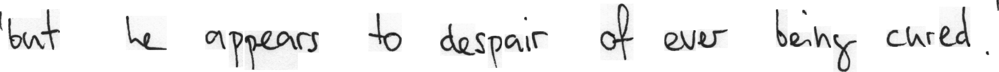

 99%|█████████▉| 298/301 [00:45<00:00,  6.96it/s]

Label: ' but he appears to despair of ever being cured . '
Prediction:  ' but he appears to despair of ever being cured . '
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-042a/g06-042a-s01-01.png


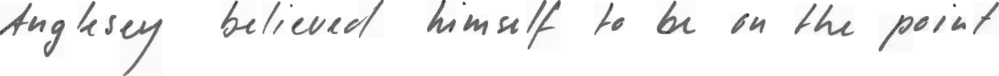

 99%|█████████▉| 299/301 [00:45<00:00,  6.96it/s]

Label: Anglesey believed himself to be on the point
Prediction:  Anglesey believed himself to be on the point
CER: 0.0; WER: 0.0
Image:  Datasets/IAM_Sentences/sentences/g06/g06-050j/g06-050j-s02-06.png


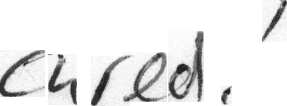

100%|█████████▉| 300/301 [00:46<00:00,  7.03it/s]

Label: cured . '
Prediction:  cured . !
CER: 0.1111111111111111; WER: 0.3333333333333333
Image:  Datasets/IAM_Sentences/sentences/h07/h07-063a/h07-063a-s01-05.png


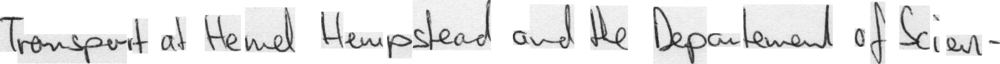

100%|██████████| 301/301 [00:46<00:00,  6.51it/s]

Label: Transport at Hemel Hempstead and the Department of Scien-
Prediction:  Fromspurt at Hemel Hempstead and the Nepoartement of Scier .
CER: 0.17543859649122806; WER: 0.4444444444444444
Average CER: 0.09492634752653152, Average WER: 0.21199466830696068


In [5]:
import cv2
import typing
import numpy as np
from IPython.display import Image, display

from mltu.inferenceModel import OnnxInferenceModel
from mltu.utils.text_utils import ctc_decoder, get_cer, get_wer
from mltu.transformers import ImageResizer

class ImageToWordModel(OnnxInferenceModel):
    def __init__(self, char_list: typing.Union[str, list], *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.char_list = char_list

    def predict(self, image: np.ndarray):
        image = ImageResizer.resize_maintaining_aspect_ratio(image, *self.input_shape[:2][::-1])

        image_pred = np.expand_dims(image, axis=0).astype(np.float32)

        preds = self.model.run(None, {self.input_name: image_pred})[0]

        text = ctc_decoder(preds, self.char_list)[0]

        return text

if __name__ == "__main__":
    import pandas as pd
    from tqdm import tqdm
    from mltu.configs import BaseModelConfigs

    configs = BaseModelConfigs.load("Models/ense480_project/202303121345/configs.yaml")

    model = ImageToWordModel(model_path=configs.model_path, char_list=configs.vocab)

    df = pd.read_csv("Models/ense480_project/202303121345/val.csv").values.tolist()

    accum_cer, accum_wer = [], []
    for image_path, label in tqdm(df):
        image = cv2.imread(image_path)

        prediction_text = model.predict(image)

        cer = get_cer(prediction_text, label)
        wer = get_wer(prediction_text, label)
        print("Image: ", image_path)
        display(Image(filename=image_path))
        print("Label:", label)
        print("Prediction: ", prediction_text)
        print(f"CER: {cer}; WER: {wer}")

        accum_cer.append(cer)
        accum_wer.append(wer)

        #cv2.imshow(prediction_text, image)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()

    print(f"Average CER: {np.average(accum_cer)}, Average WER: {np.average(accum_wer)}")

# Deploying the Front-end Application
This module will help run the front-end application where use can upload their own images of handwritten text and use the train trained model to generate predictions.

In [ ]:
import os
from flask import Flask, request, render_template
from tensorflow.keras.models import load_model
from werkzeug.utils import secure_filename
from werkzeug.datastructures import  FileStorage
from werkzeug.wrappers import Request, Response
from PIL import Image
import numpy as np

from mltu.inferenceModel import OnnxInferenceModel
from mltu.utils.text_utils import ctc_decoder, get_cer

# Define the Flask app
app = Flask(__name__)
app.config['UPLOAD_FOLDER'] = '/Users/archishabhattacharya/Documents/ENSE480_Project/static'

# Define the home page route
@app.route('/')
def home():
    return render_template('home.html')

@app.route('/uploader', methods = ['GET', 'POST'])
def upload_file():
    import pandas as pd
    from tqdm import tqdm
    from mltu.configs import BaseModelConfigs
    
    if request.method == 'POST':
        f = request.files['file']
        path = os.path.join(app.config['UPLOAD_FOLDER'], f.filename)
        f.save(path)
    else:
        f.filename = ""
    
    configs = BaseModelConfigs.load("Models/ense480_project/202303121345/configs.yaml")
    model = ImageToWordModel(model_path=configs.model_path, char_list=configs.vocab)
    
    # Convert the prediction to text
    image_path = '/Users/archishabhattacharya/Documents/ENSE480_Project/static/' + f.filename    
    image = cv2.imread(image_path)
    prediction_text = model.predict(image)
    
    #cv2.imshow(prediction_text, image)

    # Return the prediction to the user
    return render_template('upload.html', text=prediction_text, file_name=f.filename)
        

# Run the app
if __name__ == '__main__':
    from werkzeug.serving import run_simple
    run_simple('localhost', 9000, app)

2023-04-11 13:12:11,211 INFO werkzeug: WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://localhost:9000
2023-04-11 13:12:11,212 INFO werkzeug: Press CTRL+C to quit
2023-04-11 13:12:13,889 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:12:13] "GET / HTTP/1.1" 200 -
2023-04-11 13:12:14,729 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:12:14] "GET /favicon.ico HTTP/1.1" 404 -
2023-04-11 13:12:27,248 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:12:27] "POST /uploader HTTP/1.1" 200 -
2023-04-11 13:12:27,457 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:12:27] "GET /static/Example%202.png HTTP/1.1" 200 -
2023-04-11 13:13:48,593 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:13:48] "GET /apple-touch-icon-precomposed.png HTTP/1.1" 404 -
2023-04-11 13:13:48,599 INFO werkzeug: 127.0.0.1 - - [11/Apr/2023 13:13:48] "GET /apple-touch-icon.png HTTP/1.1" 404 -
2023-04-11 13:13:48,602 INFO werkzeug: 127.0.0.1 - - [11/A